### IMPORT libraries

In [1]:
import pandas as pd
import numpy as np
import prince
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import scale

import plotly.graph_objects as go
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import euclidean_distances, cosine_similarity
from sklearn.preprocessing import scale

from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score 


### IMPORT DATA

In [2]:
# Loaaaaaad the latest version
data_initial = pd.read_csv('data/spotify_songs.csv')

#### Taille + Variables

In [3]:
#Taille du jeu de données : 33k lignes et 23 clonnes qu on affiche
print(data_initial.shape)
print(data_initial.columns)

(32833, 23)
Index(['track_id', 'track_name', 'track_artist', 'track_popularity',
       'track_album_id', 'track_album_name', 'track_album_release_date',
       'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms'],
      dtype='str')


#### Qualitative

In [4]:
# Variables qualitives
qual_cols = data_initial.select_dtypes(include=['object']).columns
print('Variables qualitatives :', list(qual_cols))

Variables qualitatives : ['track_id', 'track_name', 'track_artist', 'track_album_id', 'track_album_name', 'track_album_release_date', 'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre']


C:\Users\alexb\AppData\Local\Temp\ipykernel_26944\121485315.py:2: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  qual_cols = data_initial.select_dtypes(include=['object']).columns


In [5]:
categorical_cols = [
    "playlist_name", 
    "playlist_genre", 
    "playlist_subgenre",
    "mode",
    "key"
]

for col in categorical_cols:
    data_initial[col] = pd.Categorical(data_initial[col], ordered=False)

data_initial.describe()


,track_popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000
mean,42.477081,0.654850,0.698619,-6.719499,0.107068,0.175334,0.084747,0.190176,0.510561,120.881132,225799.811622
std,24.984074,0.145085,0.180910,2.988436,0.101314,0.219633,0.224230,0.154317,0.233146,26.903624,59834.006182
min,0.000000,0.000000,0.000175,-46.448000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4000.000000
25%,24.000000,0.563000,0.581000,-8.171000,0.041000,0.015100,0.000000,0.092700,0.331000,99.960000,187819.000000
50%,45.000000,0.672000,0.721000,-6.166000,0.062500,0.080400,0.000016,0.127000,0.512000,121.984000,216000.000000
75%,62.000000,0.761000,0.840000,-4.645000,0.132000,0.255000,0.004830,0.248000,0.693000,133.918000,253585.000000
max,100.000000,0.983000,1.000000,1.275000,0.918000,0.994000,0.994000,0.996000,0.991000,239.440000,517810.000000


#### Quantitative

In [6]:
# Variables quantatives
quant_cols = data_initial.select_dtypes(include=['float64', 'int64']).columns
print('Variables quantitatives :', list(quant_cols))

Variables quantitatives : ['track_popularity', 'danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']


In [7]:
print(data_initial[categorical_cols].describe())

          playlist_name playlist_genre          playlist_subgenre   mode  \
count             32833          32833                      32833  32833   
unique              449              6                         24      2   
top     Indie Poptimism            edm  progressive electro house      1   
freq                308           6043                       1809  18574   

          key  
count   32833  
unique     12  
top         1  
freq     4010  


### CLEAN DATA

In [8]:
# Remove dumb columns and uncomplete lines 

print('=== Non-meaningful columns ===')
# remove identifiers if they exist
cols = ["track_album_id", "playlist_id"]
print('Columns to drop:', cols)
data_initial.drop(columns=cols, errors='ignore', inplace=True)

print('')
print('=== Missing values ===')
print('Columns containing missing values are:', list(data_initial.columns[data_initial.isnull().sum()!=0]))

print('')
print('track_name - Rate of missing values: {:.2f}%'.format(data_initial['track_name'].isnull().sum()/data_initial.shape[0]*100))
print('track_artist - Rate of missing values: {:.2f}%'.format(data_initial['track_artist'].isnull().sum()/data_initial.shape[0]*100))
print('track_album_name - Rate of missing values: {:.2f}%'.format(data_initial['track_album_name'].isnull().sum()/data_initial.shape[0]*100))

print('We cannot put the average value or the most common value and the rate of missing values is very low, hence we will just delete the rows that have empty data.')

data = data_initial.dropna(subset=['track_name', 'track_artist', 'track_album_name'])

print('')
print('=== Checking ===')
print('Columns containing missing values are:', list(data.columns[data.isnull().sum()!=0]))


=== Non-meaningful columns ===
Columns to drop: ['track_album_id', 'playlist_id']

=== Missing values ===
Columns containing missing values are: ['track_name', 'track_artist', 'track_album_name']

track_name - Rate of missing values: 0.02%
track_artist - Rate of missing values: 0.02%
track_album_name - Rate of missing values: 0.02%
We cannot put the average value or the most common value and the rate of missing values is very low, hence we will just delete the rows that have empty data.

=== Checking ===
Columns containing missing values are: []


#### Scaling

In [9]:
data_centered = data.copy()
data_centered[quant_cols] = scale(data[quant_cols])

C:\Users\alexb\AppData\Local\Temp\ipykernel_26944\4982838.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  data[quant_cols].hist(bins=30,


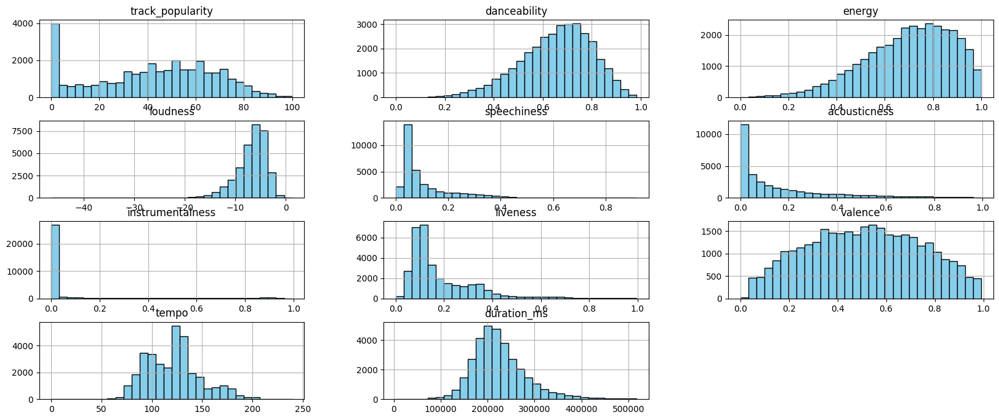

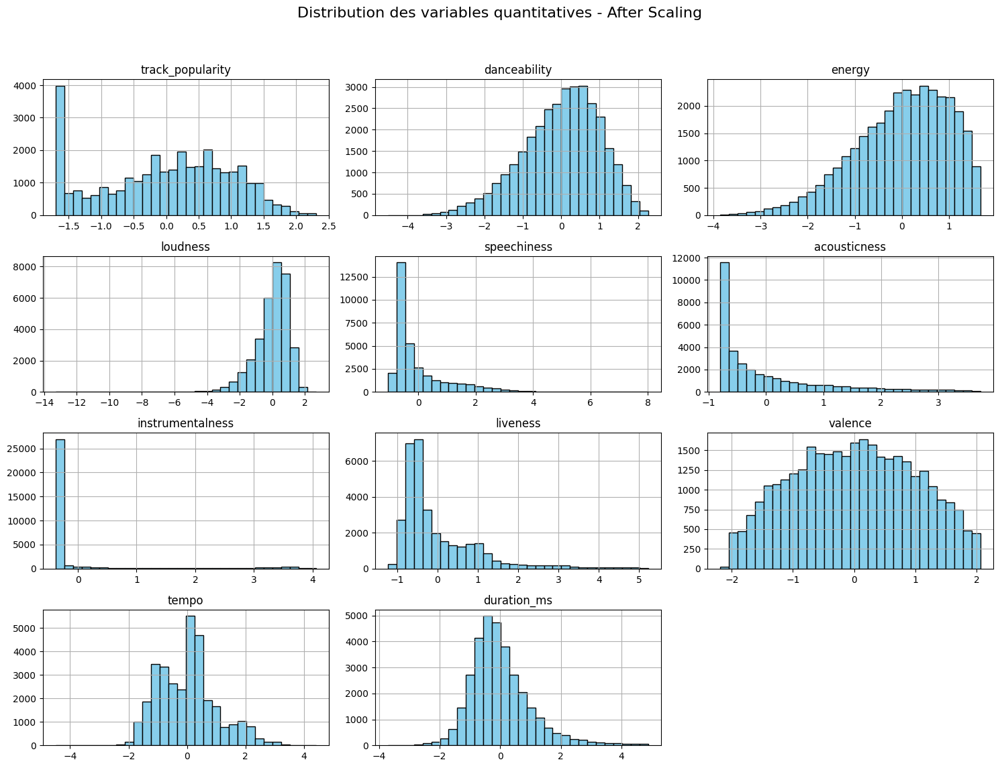

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# before scaling
data[quant_cols].hist(bins=30,
                      ax=axes[0],
                      color='skyblue',
                      edgecolor='black')
axes[0].set_title("Distribution des variables quantitatives\nBefore Scaling",
                  fontsize=14)

# After scaling
data_centered[quant_cols].hist(bins=30, figsize=(15, 12), color='skyblue', edgecolor='black')
plt.suptitle("Distribution des variables quantitatives - After Scaling", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

#### Normalizing

In [11]:
"""from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer(method='yeo-johnson')
data_normalized=data.copy()
data_normalized[quant_cols] = pt.fit_transform(data[quant_cols])

data_centered[quant_cols].hist(bins=30, figsize=(15, 12), color='skyblue', edgecolor='black')
plt.suptitle("Distribution des variables quantitatives - After Scaling", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()"""

'from sklearn.preprocessing import PowerTransformer\n\npt = PowerTransformer(method=\'yeo-johnson\')\ndata_normalized=data.copy()\ndata_normalized[quant_cols] = pt.fit_transform(data[quant_cols])\n\ndata_centered[quant_cols].hist(bins=30, figsize=(15, 12), color=\'skyblue\', edgecolor=\'black\')\nplt.suptitle("Distribution des variables quantitatives - After Scaling", fontsize=16)\nplt.tight_layout(rect=[0, 0.03, 1, 0.95])\nplt.show()'

### OUTLIERS


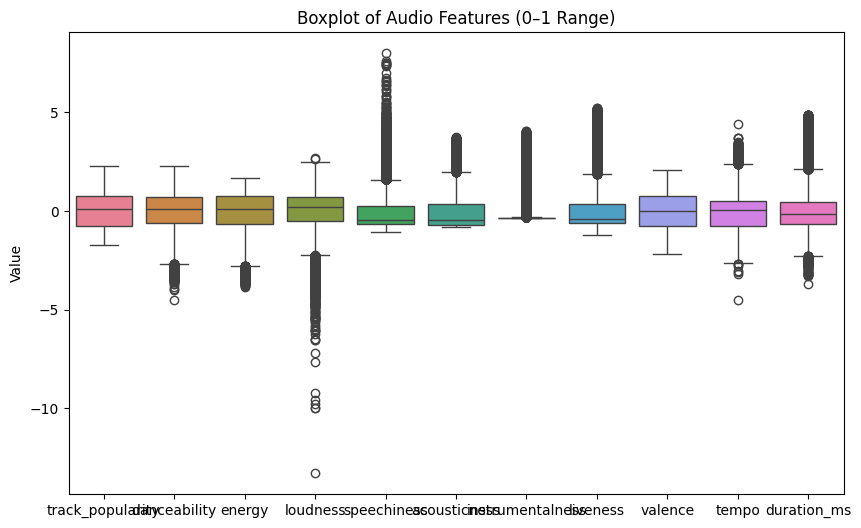

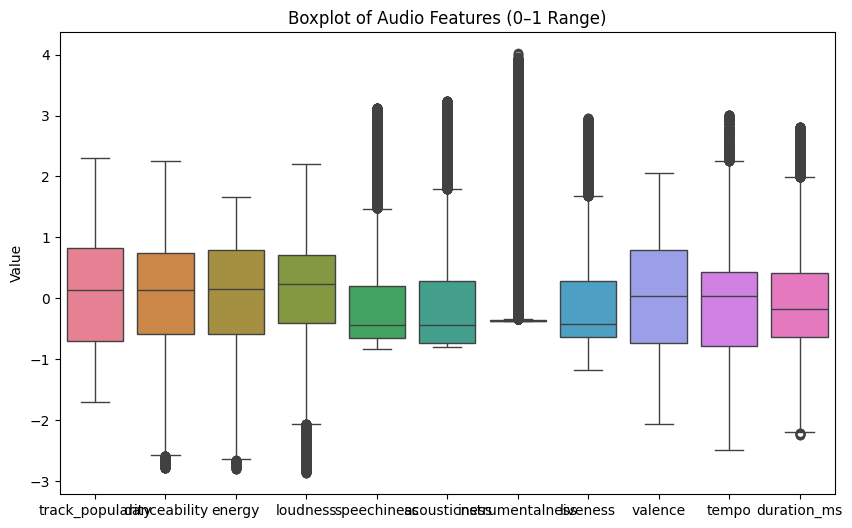


=== OUTLIER REMOVAL SUMMARY ===

Before outlier removal: 32828 rows
After outlier removal: 29827 rows
Rows removed: 3001 (9.14%)


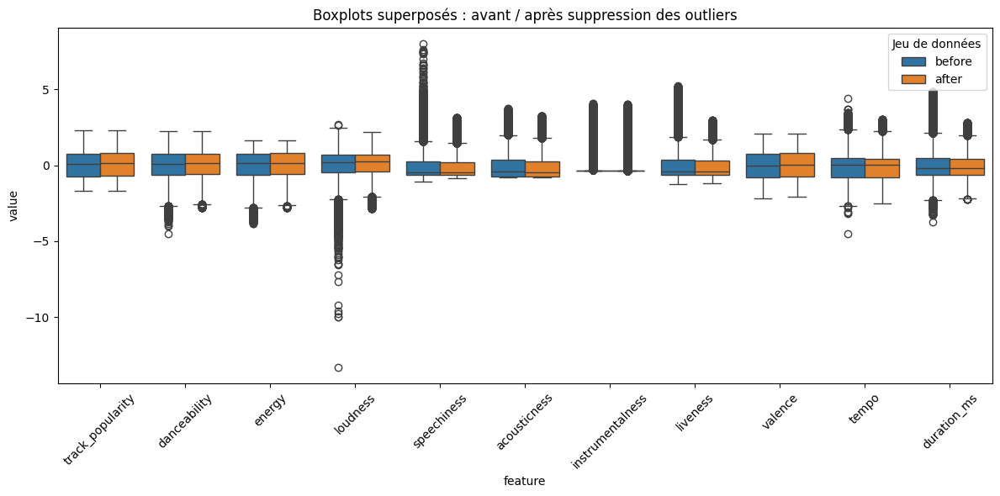

In [12]:
## BOXPLOTS

# on souhaite détécter les outliers qui contiennent des valeur numériques extrêmes

# variables numériques
quant_cols = data.select_dtypes(include='number').columns.tolist()

# on supprime les variables mode et key car elles sont quantitatives
if 'mode' in quant_cols:
    quant_cols.remove('mode')
if 'key' in quant_cols:
    quant_cols.remove('key')

# on les ramène à une échelle comparable (notamment pour duration_ms)
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
data[quant_cols] = scaler.fit_transform(data[quant_cols])

# PLOT
plt.figure(figsize=(10,6))
sns.boxplot(data=data[quant_cols])
plt.title("Boxplot of Audio Features (0–1 Range)")
plt.ylabel("Value")
plt.show()

## Remove data below 5th percentile and above 95th percentile
k=0.3
difference = data[quant_cols].quantile(0.95) - data[quant_cols].quantile(0.05)
lower_bounds = data[quant_cols].quantile(0.05) - k*difference
upper_bounds = data[quant_cols].quantile(0.95) + k*difference

mask = np.ones(len(data), dtype=bool)

for col in quant_cols:
    mask &= (data[col] >= lower_bounds[col]) & (data[col] <= upper_bounds[col])

data_without_outliers = data[mask]


## BOXPLOTS AFTER CLEANING
plt.figure(figsize=(10,6))
sns.boxplot(data=data_without_outliers[quant_cols])
plt.title("Boxplot of Audio Features (0–1 Range)")
plt.ylabel("Value")
plt.show()

# Print summary statistics before and after outlier removal
print("\n=== OUTLIER REMOVAL SUMMARY ===")
print(f"\nBefore outlier removal: {len(data)} rows")
print(f"After outlier removal: {len(data_without_outliers)} rows")
print(f"Rows removed: {len(data) - len(data_without_outliers)} ({(len(data) - len(data_without_outliers))/len(data)*100:.2f}%)")


# on construit un jeu de données long qui contient
# les deux versions (avant / après nettoyage)
df_before = data[quant_cols].copy()
df_before['dataset'] = 'before'
df_after = data_without_outliers[quant_cols].copy()
df_after['dataset'] = 'after'

df_comb = pd.concat([df_before, df_after], ignore_index=True)
df_comb = df_comb.melt(id_vars='dataset',
                       var_name='feature',
                       value_name='value')

plt.figure(figsize=(12, 6))
sns.boxplot(x='feature', y='value', hue='dataset', data=df_comb)
plt.xticks(rotation=45)
plt.title('Boxplots superposés : avant / après suppression des outliers')
plt.legend(title='Jeu de données')
plt.tight_layout()
plt.show()



In [13]:
df_clean=data_without_outliers.copy()

### Analyse descriptive : UNIDIMENSIONNELLE

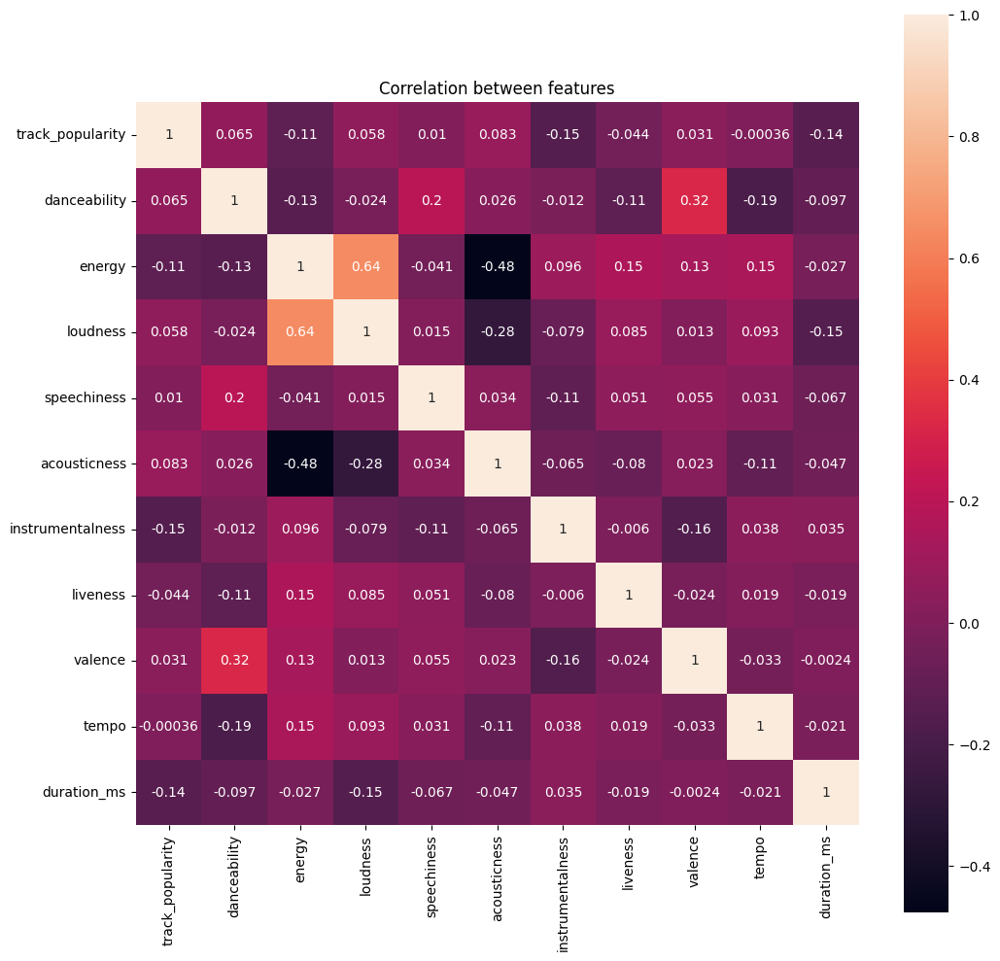

In [14]:
corr = df_clean.corr(numeric_only=True)

plt.figure(figsize=(12, 12))
sns.heatmap(corr, annot=True, square=True, cmap='rocket')
plt.title('Correlation between features')
plt.show()

In [15]:
import sys
print(sys.executable)

import nbformat
print(nbformat.__version__)

c:\Users\alexb\AppData\Local\Python\pythoncore-3.14-64\python.exe
5.10.4


In [16]:
# 1. Préparer les données (compter les combinaisons Genre -> Subgenre)


counts = df_clean.groupby(['playlist_genre', 'playlist_subgenre']).size().reset_index(name='count')

# 2. Créer la liste unique des labels (Genres + Sous-genres)
all_nodes = list(counts['playlist_genre'].unique()) + list(counts['playlist_subgenre'].unique())
node_indices = {name: i for i, name in enumerate(all_nodes)}

# 3. Définir les sources (genres), les cibles (sous-genres) et les valeurs (comptes)
source = counts['playlist_genre'].map(node_indices)
target = counts['playlist_subgenre'].map(node_indices)
value = counts['count']

# 4. Créer la figure
fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = all_nodes,
      color = "skyblue"
    ),
    link = dict(
      source = source,
      target = target,
      value = value,
      color = "rgba(135, 206, 235, 0.4)" # Bleu transparent pour les flux
  ))])

fig.update_layout(title_text="Flux des Genres vers les Sous-genres", font_size=12)
fig.show()

On observe que les sous-genres forment des groupes et appartiennent tous à un seul et unique genre. Il n'y a pas de sous-genre associé à plusieurs genres.

### Analyse descriptive : BIDIMENSIONNELLE

In [17]:
# Graphe des corrélations entre les variables quantitatives

### Analyse descriptive : MULTIDIMENSIONNELLE

#### 1. PCA

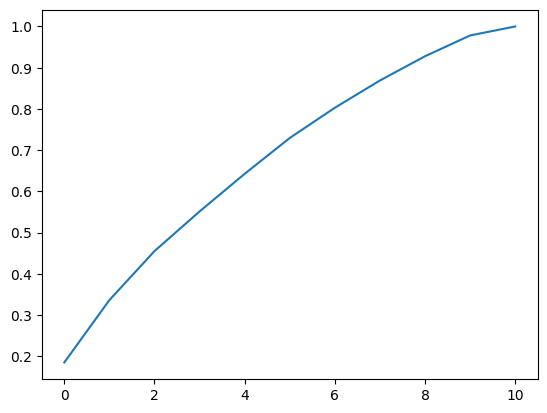

In [18]:
pca = PCA()
## Estimation, calcul des composantes principales
C = pca.fit(df_clean[quant_cols]).transform(df_clean[quant_cols])
## Décroissance de la variance expliquée
plt.plot(pca.explained_variance_ratio_.cumsum())
plt.show()

La variance expliquée par les dimensions augmente relativement linéairement au nombre de dimensions, La PCA ne semple pas être très utlise car les premières dimensions ne représentent pas une partie significative de la variance totale. 

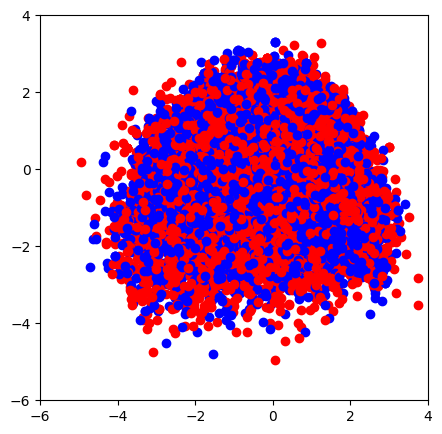

In [19]:
plt.figure(figsize=(5,5))
for i, j, nom in zip(C[:,0], C[:,1], df_clean["mode"]):
    color = "red" if nom  else "blue"
    plt.plot(i, j, "o",color=color)
plt.axis((-6,4,-6,4))  
plt.show()

<Figure size 800x800 with 0 Axes>

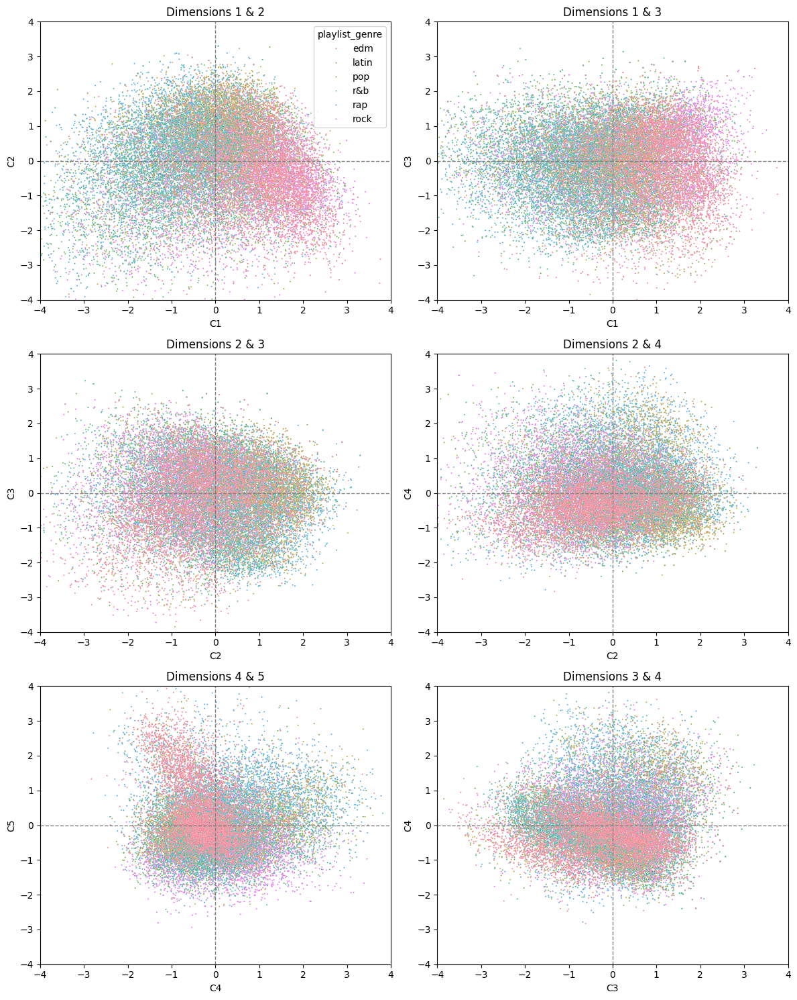

In [20]:
# On crée la figure
plt.figure(figsize=(8, 8))

# Liste des couples de dimensions à tester (index des colonnes de C)
couples = [(0, 1), (0, 2), (1, 2),(1,3),(3,4),(2,3)]

# Configuration : 3 lignes, 2 colonnes
n_rows, n_cols = 3, 2
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 15))

# On "aplatit" la matrice axes pour pouvoir boucler dessus avec un seul index (i)
axes_flat = axes.flatten()

for i, (dim_x, dim_y) in enumerate(couples):
    sns.scatterplot(
        x=C[:, dim_x], y=C[:, dim_y], 
        hue=df_clean["playlist_genre"], 
        ax=axes_flat[i], palette="husl", alpha=1, s=2,
        legend=(i == 0) # On garde la légende sur un seul graphique pour plus de clarté
    )
    
    axes_flat[i].set(title=f"Dimensions {dim_x+1} & {dim_y+1}", 
                     xlabel=f"C{dim_x+1}", ylabel=f"C{dim_y+1}",
                     xlim=(-1, 1), ylim=(-1, 1))
    axes_flat[i].axis((-4, 4, -4, 4)) # Ajuste selon tes données
    
    axes_flat[i].axhline(0, color='grey', lw=1, ls='--')
    axes_flat[i].axvline(0, color='grey', lw=1, ls='--')

plt.tight_layout()
plt.show()

On remarque que les nuages de points en fonction des genres ne sont pas répartis de la même manière. Cependant les nuages sont majoritairement superposés.  On observe donc des divergences entre différents genres mais aucun genre ou groupe de genre n'est bien séparé du reste du groupe. 
Afin de séparer de manière optimale les genres en fonction des variables quantitatives nous pouvons effectuer une LDA. En effet la PCA n'a pas permis de séparer correctement les données



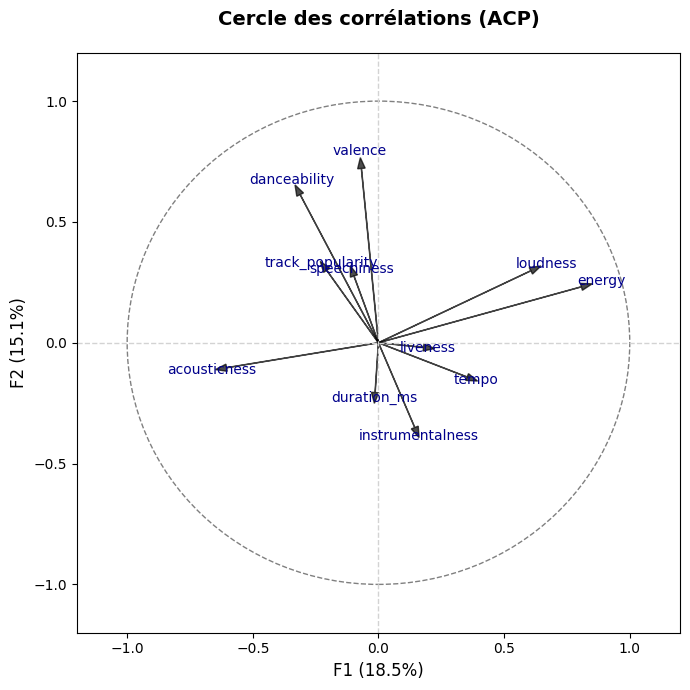

In [21]:
coord1 = pca.components_[0] * np.sqrt(pca.explained_variance_[0])
coord2 = pca.components_[1] * np.sqrt(pca.explained_variance_[1])

fig, ax = plt.subplots(figsize=(7, 7)) # Légèrement plus grand pour laisser de la place au texte

# Dessin des flèches et des noms
for i, j, nom in zip(coord1, coord2, df_clean[quant_cols].columns):
    plt.arrow(0, 0, i, j, color='black', alpha=0.7, head_width=0.03)
    plt.text(i * 1.1, j * 1.1, nom, color='darkblue', ha='center', va='center')

# Ajout des axes et du cercle
plt.axis((-1.2, 1.2, -1.2, 1.2))
ax.add_patch(plt.Circle((0, 0), radius=1, color='gray', fill=False, ls='--'))

# Lignes de repère (0,0)
plt.axhline(0, color='lightgrey', ls='--', lw=1)
plt.axvline(0, color='lightgrey', ls='--', lw=1)

# Titre et Labels
plt.title("Cercle des corrélations (ACP)", fontsize=14, fontweight='bold', pad=20)
plt.xlabel(f"F1 ({pca.explained_variance_ratio_[0]:.1%})", fontsize=12)
plt.ylabel(f"F2 ({pca.explained_variance_ratio_[1]:.1%})", fontsize=12)

plt.tight_layout()
plt.show()

Ce graphique représente les correlations entre chaque variable et les 2 premières composantes principales. On peut ainsi observer que :
- la première composante est fortement corrélée à loudness, energy et acousticness. Ce premier axe représente en quelque sorte l'intensité sonore. Ainsi l'intensité sonore est un facteur très discriminant dans notre jeu de donnée. La 2eme composante est corrélée majoritairement à valence et danceability. 
- Le 2eme axe est représente quand à lui la structure du morceau et son orientation artistique :
- D'un côté (positif) : On trouve les morceaux avec une forte Valence (joyeux, positifs) et une forte Danceability. S'ils sont aussi corrélés à la Speechiness et la Popularity, cela décrit parfaitement le profil du Tube Pop/Rap moderne : des morceaux avec des paroles (voix bien présente), faits pour danser, et qui plaisent au grand public.

- De l'autre côté (négatif) : On trouve les morceaux avec une forte Instrumentalness et une longue Duration. Ce sont les morceaux "méditatifs", longs, sans voix, et souvent moins "grand public" (ex: Post-Rock, Ambient, Techno minimale, Jazz expérimental).

In [22]:
# Performing PCA
df_quanti = df_clean[quant_cols]
print("Quantitative features:", quant_cols)

pca = prince.PCA(
    n_components=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    random_state=42
)
pca = pca.fit(df_quanti)

Quantitative features: ['track_popularity', 'danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']


In [23]:
# Inertia by each axis
display(pca.eigenvalues_summary)
pca.scree_plot()

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,2.074,18.85%,18.85%
1,1.553,14.12%,32.97%
2,1.200,10.91%,43.88%


alt.Chart(...)

The 3 first principal components do not really explain the variance, as we only get a 37% cumulative % of variance which is clearly not enough. However, we can still try to predict the musical genre or the track mode in PCA space by showing the projections of the points in the principal maps, colored accordingly.

  
Qualitative variable : acousticness
Number of modalities: 3547
  
Qualitative variable : danceability
Number of modalities: 728
  
Qualitative variable : duration_ms
Number of modalities: 17911
  
Qualitative variable : energy
Number of modalities: 797
  
Qualitative variable : instrumentalness
Number of modalities: 4611
  
Qualitative variable : key
Number of modalities: 12


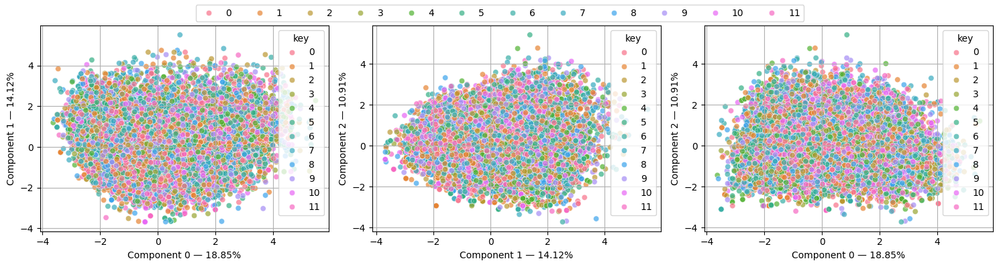

  
Qualitative variable : liveness
Number of modalities: 1327
  
Qualitative variable : loudness
Number of modalities: 9380
  
Qualitative variable : mode
Number of modalities: 2


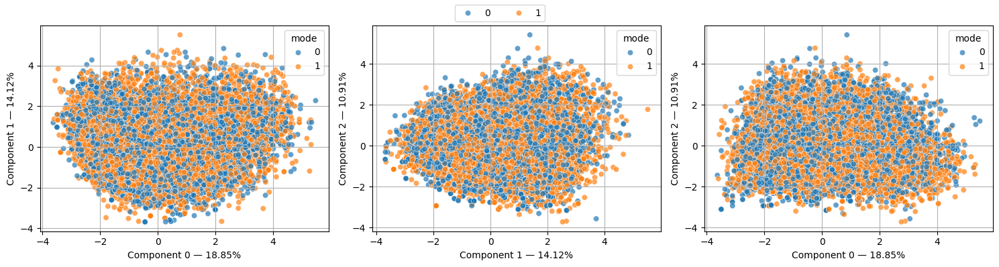

  
Qualitative variable : speechiness
Number of modalities: 1096
  
Qualitative variable : tempo
Number of modalities: 15966
  
Qualitative variable : track_popularity
Number of modalities: 101
  
Qualitative variable : valence
Number of modalities: 1286


In [24]:
# FAIRE UN GRAPHE DES VALEURS QUANTITATIVES VS 1 VALEUR QUALITATIVE
def plot_pca(pca, ax1=0, ax2=1, hue=None, ax=None, data=df_quanti):
  dataset = pca.transform(data)
  # on ajoute la variable playlist_genre dans notre base de données quantitatives
  dataset[hue] = df_clean[hue].values
  dataset.reset_index(inplace=True)
  sns.scatterplot(data = dataset,
                  x = ax1, y = ax2,
                  hue = hue, alpha=.7, ax=ax)

  ax.set_xlabel('Component {} — {:.2f}%'.format(ax1, pca.percentage_of_variance_[ax1]))
  ax.set_ylabel('Component {} — {:.2f}%'.format(ax2, pca.percentage_of_variance_[ax2]))
  ax.grid(True)

# REGROUPER 3 GRAPHES POUR UNE MÊME VALEUR QUALITATIVE AVEC DES COMBINAISONS DIFFÉRENTES DE COMPOSANTES PRINCIPALES
def plot_several(pca,hue):
    # Set up 1x3 subplot grid
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))  # smaller width per plot
    plt.subplots_adjust(wspace=0.3)  # spacing between plots

    plot_pca(pca, 0,1, hue=hue,ax=axes[0],data=df_quanti)
    plot_pca(pca, 1,2, hue=hue,ax=axes[1],data=df_quanti)
    plot_pca(pca, 0,2, hue=hue,ax=axes[2],data=df_quanti)
    
    handles, labels = axes[2].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=len(labels), frameon=True)
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # leave space for the legend
    plt.show()

# BOUCLE SUR TOUTES LES VALEURS QUALITATIVES QUI ONT MOINS DE N MODALITÉS
qual_features = df_clean.columns.difference(qual_cols)
N = 15
for qual_var in qual_features :
    num_modalities = df_clean[qual_var].nunique()
    print('  ')
    print(f"Qualitative variable : {qual_var}")
    print("Number of modalities:", num_modalities)
    if num_modalities<N :
        plot_several(pca,hue=qual_var)
# --- #

The only two quantitative variables we study are the mode and the playlist genre as they have under 15 modalities which could still be interpretable. However, we do not see a clear distinction between the different classes, at least for the mode variable. Fot the playlist genre we can observe some clusters of points that we could try to separate using non-linear SVM.

#### 2. LDA

In [25]:
print(df_clean.columns)

Index(['track_id', 'track_name', 'track_artist', 'track_popularity',
       'track_album_name', 'track_album_release_date', 'playlist_name',
       'playlist_genre', 'playlist_subgenre', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'duration_ms'],
      dtype='str')


In [26]:
import pandas as pd
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler

In [27]:
# 1. Calcul de toutes les dimensions possibles
# Le max est (nombre de genres - 1)
n_genres = df_clean['playlist_genre'].nunique()
max_dim = n_genres - 1

lda = LinearDiscriminantAnalysis(n_components=max_dim)
X_lda = lda.fit_transform(df_clean[quant_cols], df_clean['playlist_genre'])

# 2. Création du tableau complet (Toutes les LD)
lda_columns = [f'LDA{i+1}' for i in range(max_dim)]
df_total = pd.DataFrame(X_lda, columns=lda_columns)
df_total['genre'] = df_clean['playlist_genre'].values


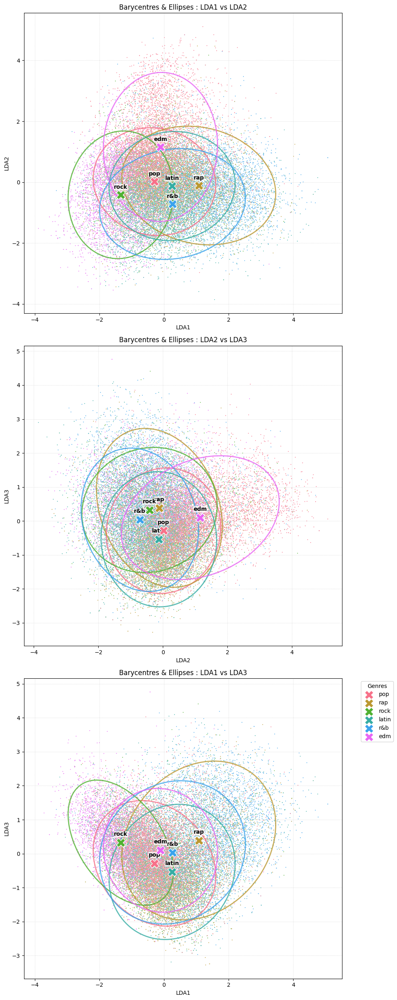

In [28]:
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms
import numpy as np
# --- Fonction pour les ellipses (inchangée) ---
def add_confidence_ellipse(x, y, ax, n_std=2.0, **kwargs):
    cov = np.cov(x, y)
    pearson = cov[0, 1] / np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2, facecolor='none', **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(np.mean(x), np.mean(y))
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# --- Préparation des graphiques ---
fig, axes = plt.subplots(3, 1, figsize=(10, 25))
combos = [('LDA1', 'LDA2'), ('LDA2', 'LDA3'), ('LDA1', 'LDA3')]
genres = df_total['genre'].unique()
colors = sns.color_palette('husl', n_colors=len(genres))

# Calcul des barycentres pour chaque genre
barycentres = df_total.groupby('genre').mean()

for i, (ax_x, ax_y) in enumerate(combos):
    ax = axes[i]
    
    # 1. Tracer les points (très légers)
    sns.scatterplot(data=df_total, x=ax_x, y=ax_y, hue='genre', palette=colors, 
                    alpha=1, s=2, ax=ax, legend=False)

    for j, genre in enumerate(genres):
        subset = df_total[df_total['genre'] == genre]
        
        # 2. Tracer l'ellipse
        add_confidence_ellipse(subset[ax_x], subset[ax_y], ax=ax, 
                               edgecolor=colors[j], linewidth=2, alpha=0.8)
        
        # 3. Tracer le BARYCENTRE (le centre de gravité)
        # On utilise une croix 'X' ou un gros point 'o'
        ax.scatter(barycentres.loc[genre, ax_x], barycentres.loc[genre, ax_y], 
                   color=colors[j], s=250, marker='X', edgecolors='white', 
                   linewidth=1, zorder=10, label=genre if i == 2 else None)
        
        # 4. Ajouter le texte du genre à côté du barycentre
        ax.text(barycentres.loc[genre, ax_x], barycentres.loc[genre, ax_y] + 0.2, 
                genre, fontsize=10, weight='bold', ha='center',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=0.5))

    ax.set_title(f'Barycentres & Ellipses : {ax_x} vs {ax_y}')
    ax.grid(True, linestyle=':', alpha=0.5)

# Légende sur le dernier graphique
plt.legend(title='Genres', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

- LDA1 (Axe Horizontal) : Il semble séparer le Rock (à gauche, valeurs négatives) du Rap (à droite, valeurs positives). Si l'on recroise avec vos analyses précédentes, le Rock est probablement ici lié à une forte Instrumentalness et une Duration plus longue, tandis que le Rap est lié à la Speechiness.

- LDA2 (Axe Vertical) : Il isole magnifiquement l'EDM (en haut, rose). L'EDM a une ellipse très étirée vers le haut, ce qui signifie que la LDA a trouvé une combinaison de variables (probablement Energy et Loudness) qui caractérise uniquement ce genre.

- Il y a beaucoup de chevauchements, mais certains genres se distinguent : le rock et le rap se distinguent bien selon l'axe 1. Les musiques du genre Edm s'étalent énormément selon ces composantes principales, cela témoigne d'une grande variété au sein de ce genre.

## SVM

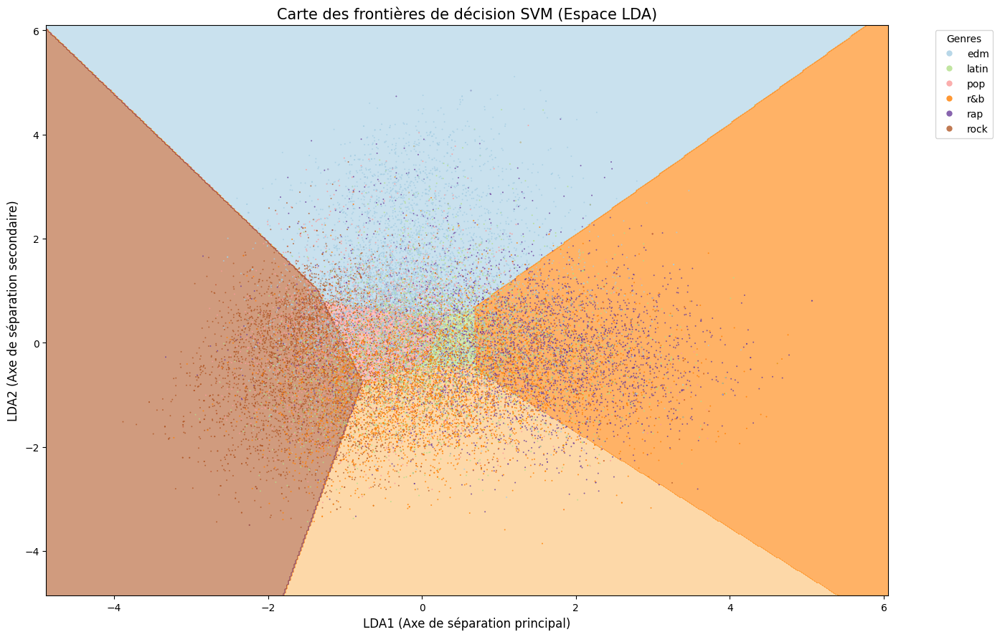

In [29]:
from sklearn import svm
from sklearn.preprocessing import LabelEncoder
import numpy as np
import matplotlib.pyplot as plt

# 1. Préparation des données
X_svm = df_total[['LDA1', 'LDA2']].values
y = df_clean['playlist_genre']

le = LabelEncoder()
y_encoded = le.fit_transform(y)

# 2. Création et entraînement du SVM
clf = svm.SVC(kernel='linear', C=1.0)
clf.fit(X_svm, y_encoded)

# 3. Création du maillage
h = .02
x_min, x_max = X_svm[:, 0].min() - 1, X_svm[:, 0].max() + 1
y_min, y_max = X_svm[:, 1].min() - 1, X_svm[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.figure(figsize=(14, 9))

# Zones de décision
plt.contourf(xx, yy, Z, cmap=plt.cm.Paired, alpha=0.6) 

# --- CORRECTION ICI : On définit 'scatter' pour pouvoir l'utiliser après ---
scatter = plt.scatter(
    X_svm[:, 0], 
    X_svm[:, 1], 
    c=y_encoded, 
    cmap=plt.cm.Paired, 
    s=2, 
    linewidths=0, 
    alpha=0.8
)

plt.title("Carte des frontières de décision SVM (Espace LDA)", fontsize=15)
plt.xlabel('LDA1 (Axe de séparation principal)', fontsize=12)
plt.ylabel('LDA2 (Axe de séparation secondaire)', fontsize=12)

# --- CORRECTION LÉGENDE ---
# legend_elements() fonctionne maintenant car 'scatter' existe
handles, _ = scatter.legend_elements()
plt.legend(handles=handles, labels=list(le.classes_), title="Genres", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [30]:
# 1. On prépare le DataFrame avec les noms de genres
from  sklearn.metrics  import confusion_matrix

y_pred = clf.predict(X_svm)

cm = confusion_matrix(y_encoded, y_pred)

df_cm_styled = pd.DataFrame(
    cm, 
    index=le.classes_, 
    columns=le.classes_
)

# 2. On applique un style "Heatmap" directement sur le tableau Pandas
# Cela fonctionne parfaitement dans Jupyter, Colab ou VS Code
styled_matrix = df_cm_styled.style.background_gradient(cmap='Blues') \
    .set_properties(**{'text-align': 'center', 'font-weight': 'bold', 'border': '1px solid black'}) \
    .set_caption("MATRICE DE CONFUSION (Réel en ligne / Prédit en colonne)")

# 3. Affichage du tableau de stats avec des couleurs pour TVP et TFP
# On recalcule les taux proprement (en float pour le style)
tvp_float = cm.diagonal() / cm.sum(axis=1)
tfp_float = []
for i in range(len(cm)):
    fp = cm[:, i].sum() - cm[i, i]
    vn = cm.sum() - cm[i, :].sum() - fp
    tfp_float.append(fp / (fp + vn) if (fp + vn) > 0 else 0)

df_stats_styled = pd.DataFrame({
    'TVP (Vrais Positifs)': tvp_float,
    'TFP (Faux Positifs)': tfp_float
}, index=le.classes_)

# On affiche les deux
display(styled_matrix)
display(df_stats_styled.style.background_gradient(cmap='RdYlGn_r', subset=['TFP (Faux Positifs)']) \
                             .background_gradient(cmap='RdYlGn', subset=['TVP (Vrais Positifs)']) \
                             .format("{:.2%}"))

,edm,latin,pop,r&b,rap,rock
edm,3301,198,878,233,522,382
latin,717,508,1121,948,1141,379
pop,1005,362,1471,766,564,1035
r&b,237,297,670,1948,1140,613
rap,601,337,414,823,2692,183
rock,392,47,510,539,42,2811


,TVP (Vrais Positifs),TFP (Faux Positifs)
edm,59.87%,12.14%
latin,10.55%,4.96%
pop,28.27%,14.59%
r&b,39.71%,13.28%
rap,53.31%,13.76%
rock,64.75%,10.17%


### Conclusion : Les limites du "tout-quantitatif"
Les résultats du modèle SVM, appuyés par la LDA, démontrent que si les variables quantitatives permettent de distinguer efficacement les genres aux signatures tranchées comme le Rock (65% de réussite) ou le Rap, elles s'avèrent insuffisantes pour le bloc Pop-Latin-R&B. Le fort chevauchement dans la matrice de confusion prouve que ces genres partagent désormais des standards de production (énergie, durée, volume) quasi identiques. En conclusion, les caractéristiques acoustiques brutes capturent la "texture" sonore, mais ne suffisent pas à modéliser les nuances de chaque style et culturelles qui définissent la musique actuelle.

#### 3. MCA

MCA is the usual dimension reduction technique when working with qualitative variables.

In [33]:
df_quali = df_clean[qual_features] 
df_quali = df_quali.astype('category')

pd.get_dummies(df_quali)

,acousticness_-0.7983485952291577,acousticness_-0.7983484131138303,acousticness_-0.7983482765273345,acousticness_-0.7983474114795288,acousticness_-0.7983451350379346,acousticness_-0.7983448618649432,acousticness_-0.7983444065766244,acousticness_-0.7983439057594737,acousticness_-0.798343769172978,acousticness_-0.7983435415288185,...,valence_1.9920573247205537,valence_1.996346446364534,valence_2.000635568008514,valence_2.004924689652494,valence_2.0092138112964744,valence_2.0135029329404546,valence_2.017792054584435,valence_2.0306594195163754,valence_2.0563941493802567,valence_2.060683271024237
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32827,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
32828,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
32829,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
32830,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


We will restrict our data set to the following qualitative variables: mode (2 modalities), playlist_genre (6 modalities) and playlist_subgenre (24 modalities). Then we will fit our model using MCA.


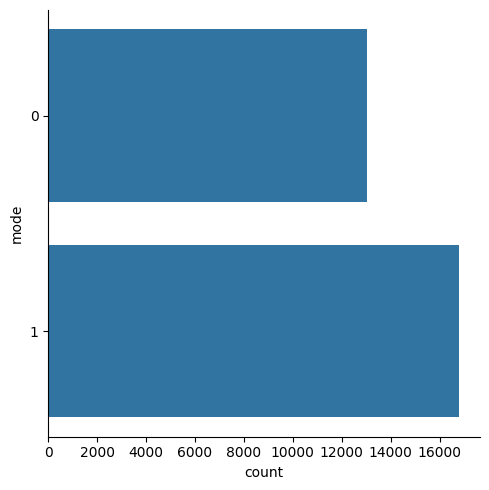

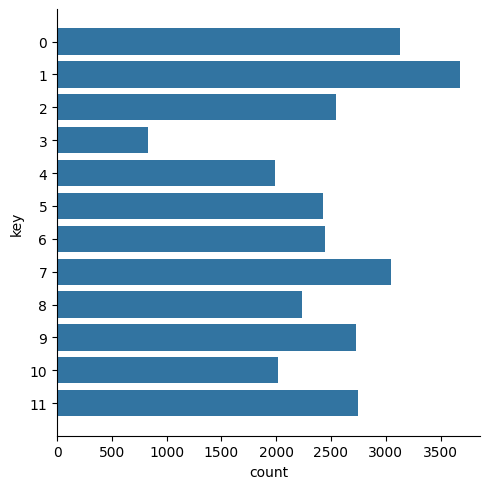

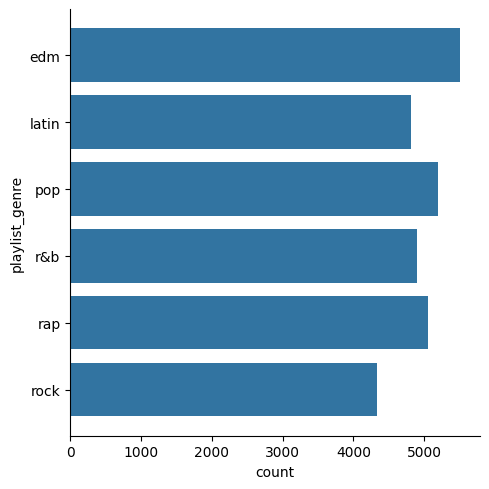

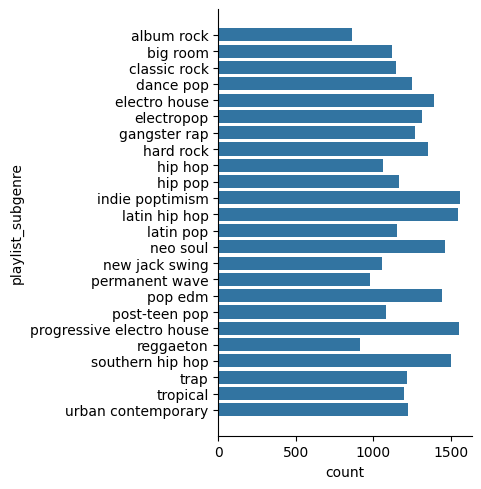

In [34]:
quali_features_restricted = ['mode','key','playlist_genre','playlist_subgenre']
df_quali_restricted = df_clean[quali_features_restricted]

for var in df_quali_restricted :
    sns.catplot(df_clean[var].astype('category'), kind='count')
    plt.plot()



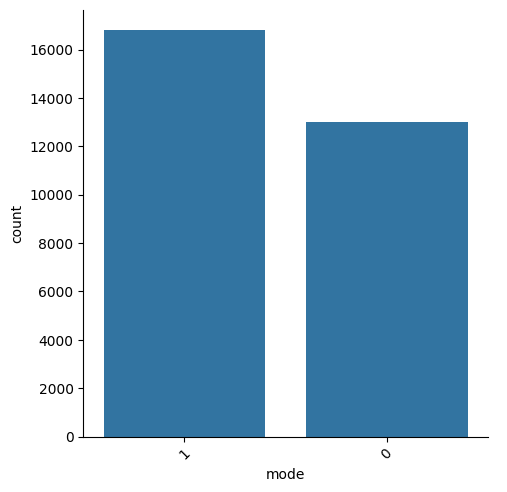

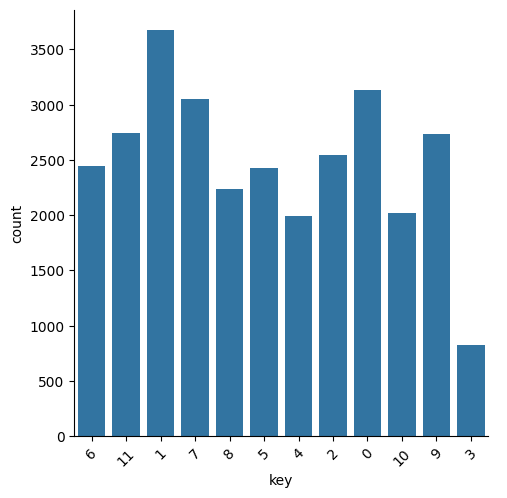

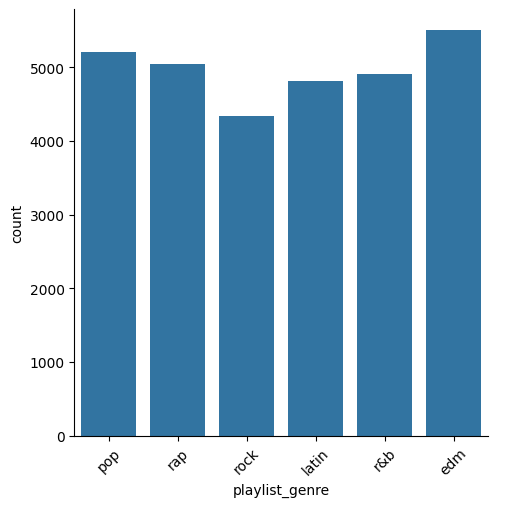

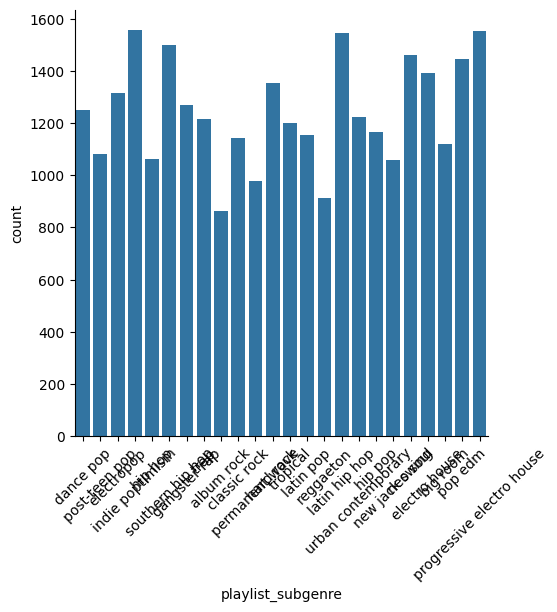

Explained inertia by component:
[5.18588584 5.02071642]

Row coordinates:
          0         1
0  0.153678 -0.412608
1  0.149135 -0.394397
2 -0.063057 -0.349511
3  0.309492 -0.374409
4  0.123575 -0.326265

Column coordinates:
                                                     0         1
mode__0                                      -0.302963 -0.037130
mode__1                                       0.234634  0.028756
key__0                                        0.272407 -0.061971
key__1                                       -0.315242  0.166612
key__10                                      -0.442075  0.205509
key__11                                      -0.241615 -0.026493
key__2                                        0.443695  0.059222
key__3                                       -0.064139 -0.273779
key__4                                        0.252624 -0.020813
key__5                                       -0.194104 -0.275879
key__6                                       -0.228530 -0.

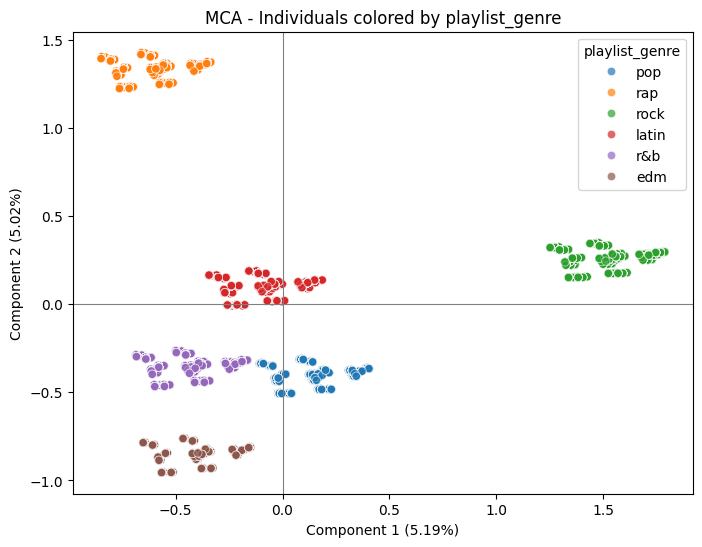

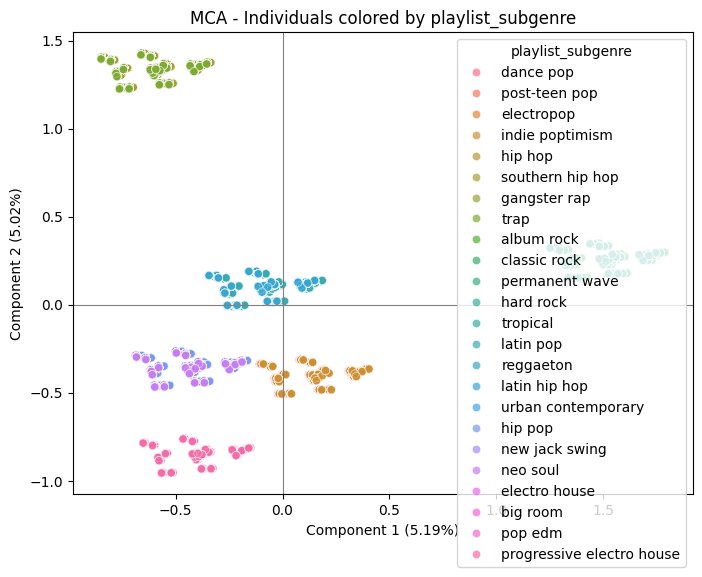

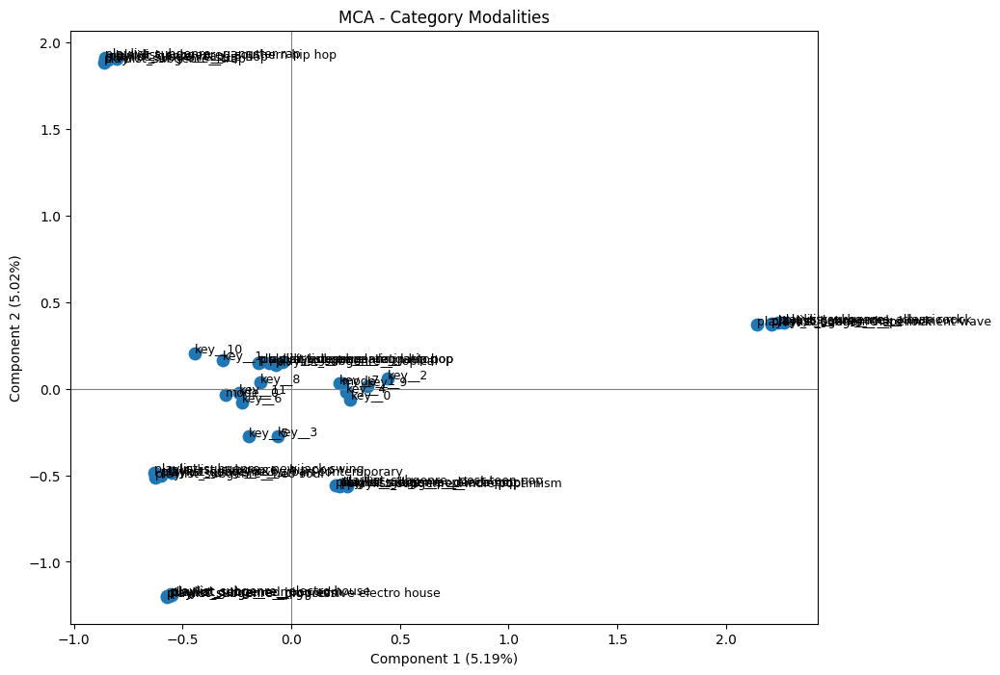

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import prince

# ---------------------------------------------------
# 1. Select qualitative features
# ---------------------------------------------------
quali_features_restricted = ['mode', 'key', 'playlist_genre', 'playlist_subgenre']
df_quali_restricted = df_clean[quali_features_restricted].copy()

# make sure everything is categorical/string
for col in df_quali_restricted.columns:
    df_quali_restricted[col] = df_quali_restricted[col].astype(str)

# ---------------------------------------------------
# 2. Count plots for each variable
# ---------------------------------------------------
for var in df_quali_restricted.columns:
    sns.catplot(x=var, data=df_quali_restricted, kind='count')
    plt.xticks(rotation=45)
    plt.show()

# ---------------------------------------------------
# 3. Fit MCA
# ---------------------------------------------------
mca = prince.MCA(
    n_components=2,
    n_iter=10,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
)

mca = mca.fit(df_quali_restricted)

# ---------------------------------------------------
# 4. Explained inertia
# ---------------------------------------------------
print("Explained inertia by component:")
print(mca.percentage_of_variance_)

# ---------------------------------------------------
# 5. Coordinates of individuals
# ---------------------------------------------------
row_coords = mca.row_coordinates(df_quali_restricted)
print("\nRow coordinates:")
print(row_coords.head())

# ---------------------------------------------------
# 6. Coordinates of categories / modalities
# ---------------------------------------------------
col_coords = mca.column_coordinates(df_quali_restricted)
print("\nColumn coordinates:")
print(col_coords)

# ---------------------------------------------------
# 7. Plot individuals
# ---------------------------------------------------
row_coords_plot = row_coords.copy()
row_coords_plot["playlist_genre"] = df_quali_restricted["playlist_genre"].values

plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=row_coords_plot,
    x=0,
    y=1,
    hue="playlist_genre",
    alpha=0.7
)
plt.axhline(0, color='grey', linewidth=0.8)
plt.axvline(0, color='grey', linewidth=0.8)
plt.xlabel(f"Component 1 ({mca.percentage_of_variance_[0]:.2f}%)")
plt.ylabel(f"Component 2 ({mca.percentage_of_variance_[1]:.2f}%)")
plt.title("MCA - Individuals colored by playlist_genre")
plt.show()


row_coords_plot = row_coords.copy()
row_coords_plot["playlist_subgenre"] = df_quali_restricted["playlist_subgenre"].values

plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=row_coords_plot,
    x=0,
    y=1,
    hue="playlist_subgenre",
    alpha=0.7
)
plt.axhline(0, color='grey', linewidth=0.8)
plt.axvline(0, color='grey', linewidth=0.8)
plt.xlabel(f"Component 1 ({mca.percentage_of_variance_[0]:.2f}%)")
plt.ylabel(f"Component 2 ({mca.percentage_of_variance_[1]:.2f}%)")
plt.title("MCA - Individuals colored by playlist_subgenre")
plt.show()

# ---------------------------------------------------
# 8. Plot modalities
# ---------------------------------------------------
plt.figure(figsize=(10, 8))
plt.scatter(col_coords[0], col_coords[1], s=80)

for i, label in enumerate(col_coords.index):
    plt.text(col_coords.iloc[i, 0], col_coords.iloc[i, 1], str(label), fontsize=9)

plt.axhline(0, color='grey', linewidth=0.8)
plt.axvline(0, color='grey', linewidth=0.8)
plt.xlabel(f"Component 1 ({mca.percentage_of_variance_[0]:.2f}%)")
plt.ylabel(f"Component 2 ({mca.percentage_of_variance_[1]:.2f}%)")
plt.title("MCA - Category Modalities")
plt.show()

Columns used for MCA:
['key', 'mode', 'popularity_class', 'energy_class', 'danceability_class', 'title_num_words_class', 'title_has_special_char_cat', 'title_has_number_cat', 'valence_class']

Number of unique categories per variable:
key: 12
mode: 2
popularity_class: 3
energy_class: 3
danceability_class: 3
title_num_words_class: 3
title_has_special_char_cat: 2
title_has_number_cat: 2
valence_class: 3


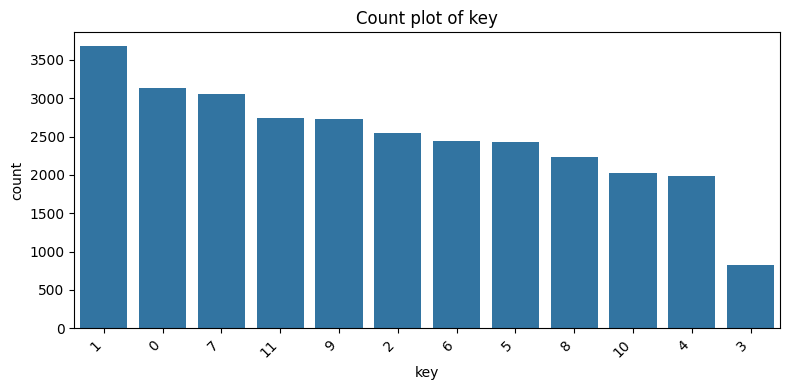

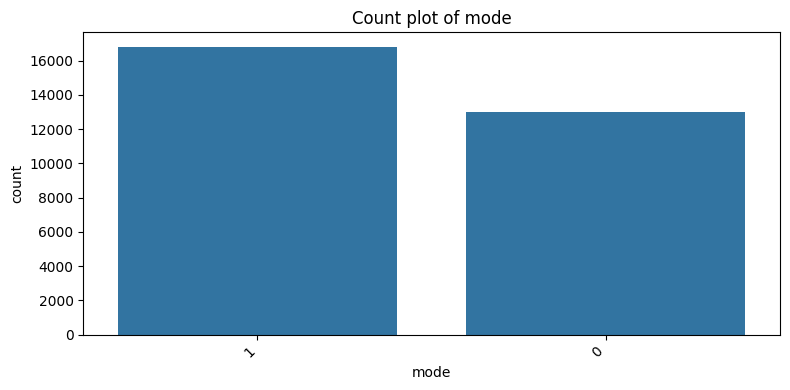

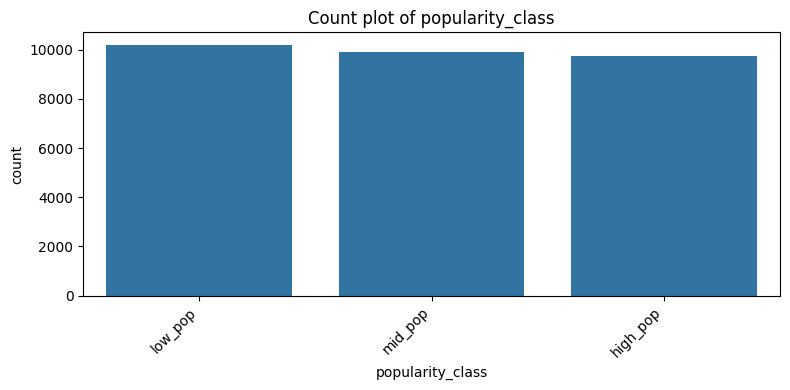

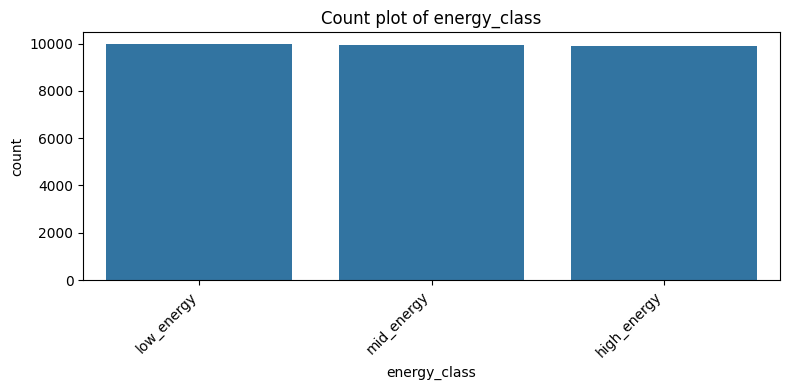

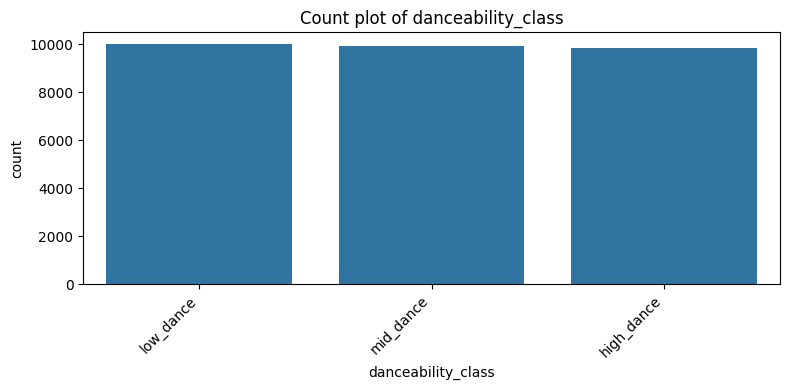

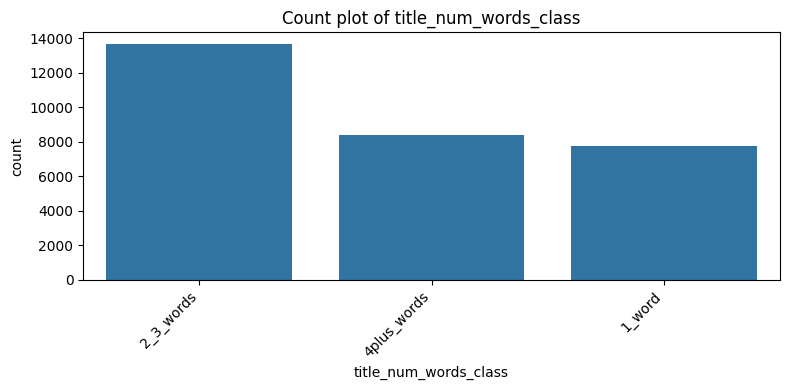

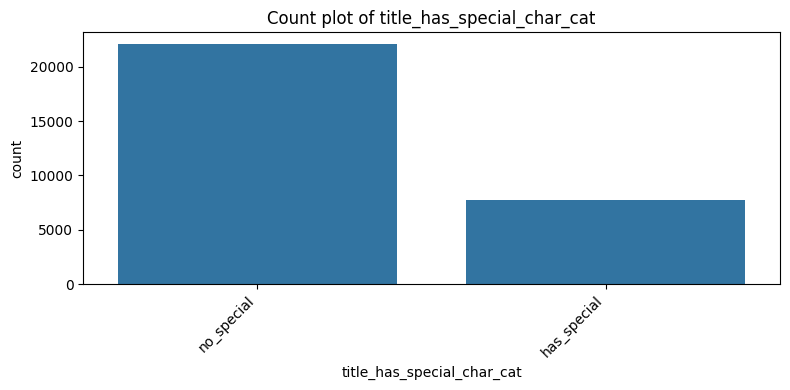

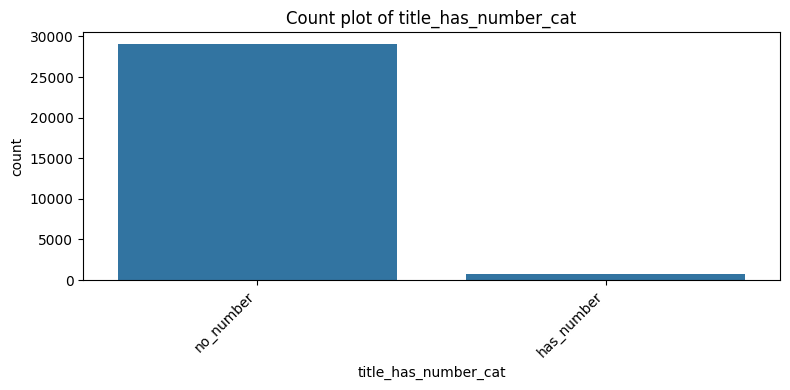

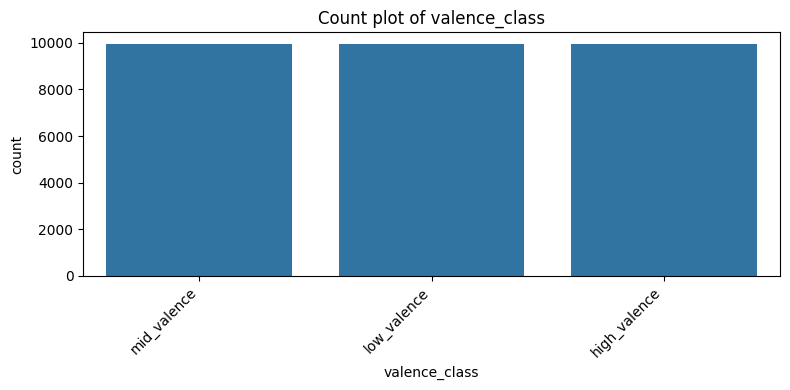


Explained inertia by component:
[6.49826545 5.60080582]

Row coordinates:
          0         1
0  0.830628  0.201583
1 -0.180784 -0.357346
2 -0.097471 -0.241527
3 -0.326079  0.291768
4 -0.047090 -0.237526

Column coordinates:
                                                0         1
key__0                                  -0.046829  0.287472
key__1                                   0.118192 -0.177083
key__10                                  0.242991 -0.686955
key__11                                  0.101980 -0.559503
key__2                                  -0.273868  0.667846
key__3                                  -0.435381  0.261952
key__4                                  -0.180510  0.168955
key__5                                   0.068407 -0.118192
key__6                                   0.079273 -0.276409
key__7                                  -0.107704  0.362192
key__8                                   0.164035  0.280914
key__9                                  -0.014193 -0

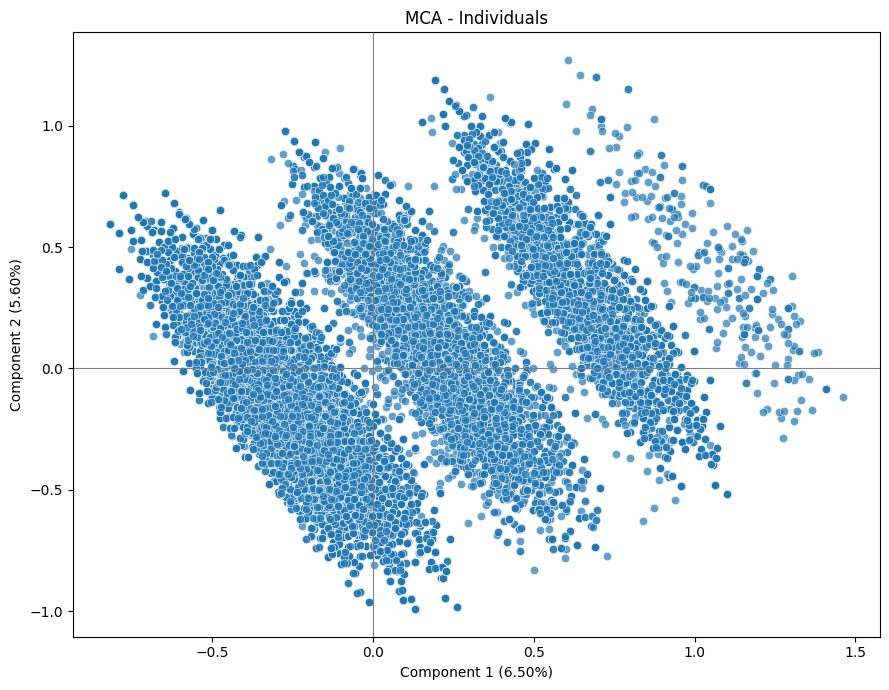

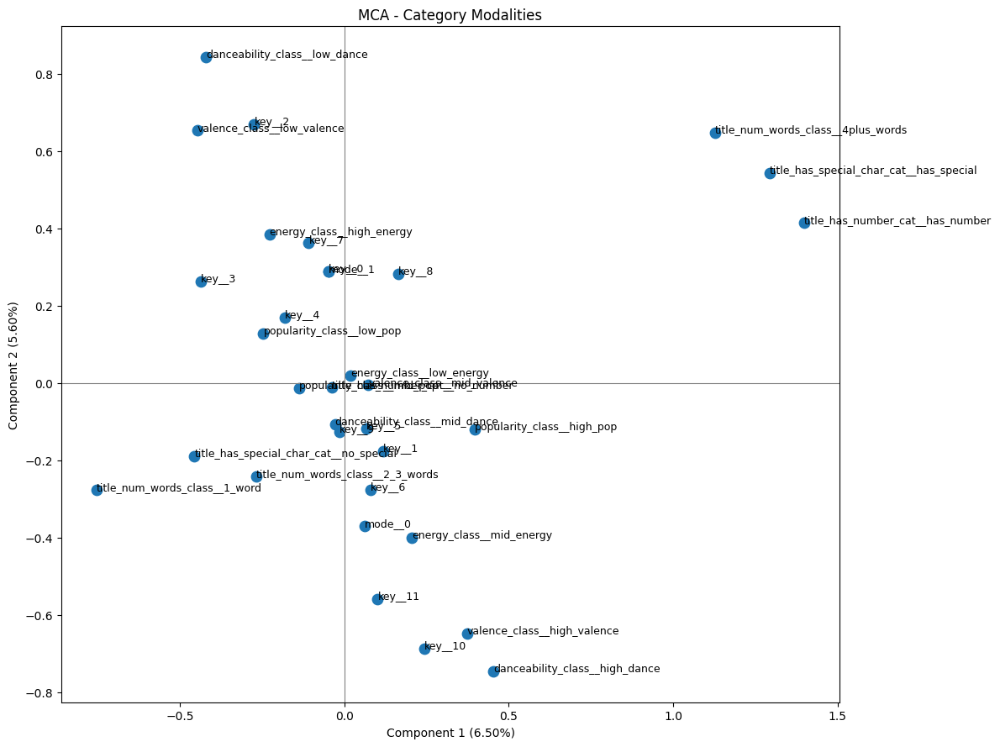

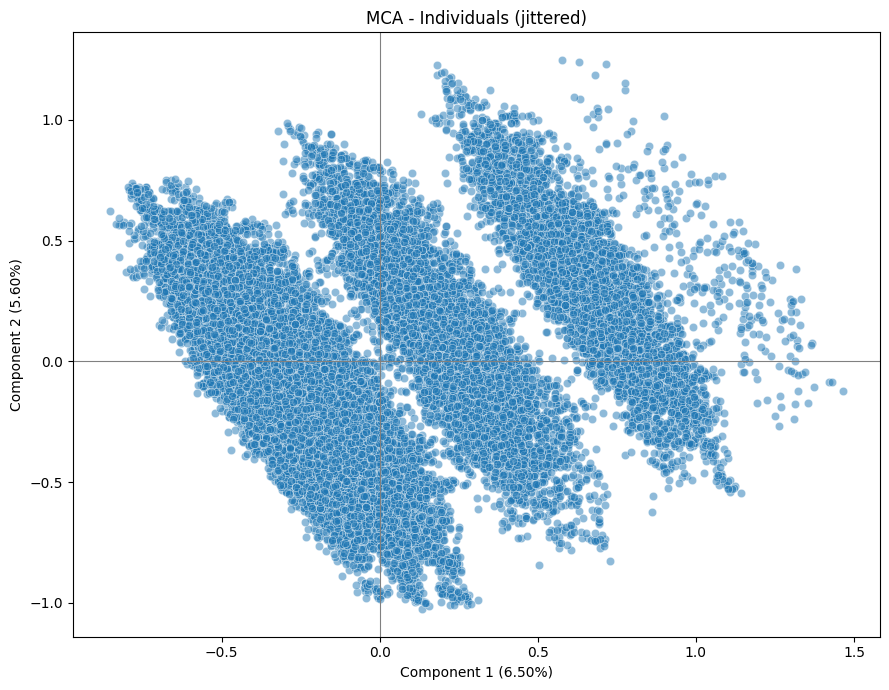

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import prince
import re

# ===================================================
# 0. COPY DATA
# ===================================================
df_mca = df_clean.copy()

# ===================================================
# 1. TITLE-BASED CATEGORICAL FEATURES
#    (uses track_name, keeping only title before " - ")
# ===================================================
df_mca["track_name"] = df_mca["track_name"].fillna("").astype(str)

# keep only the part before " - "
df_mca["title_main"] = df_mca["track_name"].apply(
    lambda x: re.split(r"\s-\s", x, maxsplit=1)[0].strip()
)

# clean version
df_mca["title_main_clean"] = df_mca["title_main"].str.lower().str.strip()

# extract words
def extract_words(title):
    return re.findall(r"\b[\w']+\b", title.lower())

df_mca["title_words"] = df_mca["title_main_clean"].apply(extract_words)

# numeric title features
df_mca["title_num_words"] = df_mca["title_words"].apply(len)
df_mca["title_has_special_char"] = df_mca["title_main"].apply(
    lambda x: int(bool(re.search(r"[^A-Za-z0-9\s]", x)))
)
df_mca["title_has_number"] = df_mca["title_main"].apply(
    lambda x: int(bool(re.search(r"\d", x)))
)

# discretized / categorical title features
df_mca["title_num_words_class"] = pd.cut(
    df_mca["title_num_words"],
    bins=[-1, 1, 3, 100],
    labels=["1_word", "2_3_words", "4plus_words"]
)

df_mca["title_has_special_char_cat"] = df_mca["title_has_special_char"].map({
    0: "no_special",
    1: "has_special"
})

df_mca["title_has_number_cat"] = df_mca["title_has_number"].map({
    0: "no_number",
    1: "has_number"
})

# ===================================================
# 2. DISCRETIZE QUANTITATIVE FEATURES FOR MCA
# ===================================================
df_mca["popularity_class"] = pd.qcut(
    df_mca["track_popularity"],
    q=3,
    labels=["low_pop", "mid_pop", "high_pop"],
    duplicates="drop"
)

df_mca["energy_class"] = pd.qcut(
    df_mca["energy"],
    q=3,
    labels=["low_energy", "mid_energy", "high_energy"],
    duplicates="drop"
)

df_mca["danceability_class"] = pd.qcut(
    df_mca["danceability"],
    q=3,
    labels=["low_dance", "mid_dance", "high_dance"],
    duplicates="drop"
)

# optional if you have valence
if "valence" in df_mca.columns:
    df_mca["valence_class"] = pd.qcut(
        df_mca["valence"],
        q=3,
        labels=["low_valence", "mid_valence", "high_valence"],
        duplicates="drop"
    )

# ===================================================
# 3. DEFINE MCA COLUMNS
# ===================================================
mca_cols = [
    "key",
    "mode",
    "popularity_class",
    "energy_class",
    "danceability_class",
    "title_num_words_class",
    "title_has_special_char_cat",
    "title_has_number_cat"
]

# add valence if available
if "valence_class" in df_mca.columns:
    mca_cols.append("valence_class")

# keep only existing cols
mca_cols = [col for col in mca_cols if col in df_mca.columns]

# ===================================================
# 4. PREPARE MCA DATA
# ===================================================
df_quali_mca = df_mca[mca_cols].copy().dropna()

# convert everything to string/categorical-like
for col in df_quali_mca.columns:
    df_quali_mca[col] = df_quali_mca[col].astype(str)

print("Columns used for MCA:")
print(df_quali_mca.columns.tolist())

print("\nNumber of unique categories per variable:")
for col in df_quali_mca.columns:
    print(f"{col}: {df_quali_mca[col].nunique()}")

# ===================================================
# 5. COUNT PLOTS
# ===================================================
for var in df_quali_mca.columns:
    plt.figure(figsize=(8, 4))
    order = df_quali_mca[var].value_counts().index
    sns.countplot(data=df_quali_mca, x=var, order=order)
    plt.xticks(rotation=45, ha="right")
    plt.title(f"Count plot of {var}")
    plt.tight_layout()
    plt.show()

# ===================================================
# 6. FIT MCA
# ===================================================
mca = prince.MCA(
    n_components=2,
    n_iter=10,
    copy=True,
    check_input=True,
    engine="sklearn",
    random_state=42
)

mca = mca.fit(df_quali_mca)

# ===================================================
# 7. EXPLAINED INERTIA
# ===================================================
print("\nExplained inertia by component:")
print(mca.percentage_of_variance_)

# ===================================================
# 8. COORDINATES
# ===================================================
row_coords = mca.row_coordinates(df_quali_mca)
col_coords = mca.column_coordinates(df_quali_mca)

print("\nRow coordinates:")
print(row_coords.head())

print("\nColumn coordinates:")
print(col_coords)

# ===================================================
# 9. PLOT INDIVIDUALS COLORED BY GENRE
# ===================================================
row_coords_plot = row_coords.copy()
if "playlist_genre" in df_quali_mca.columns:
    row_coords_plot["playlist_genre"] = df_quali_mca["playlist_genre"].values

plt.figure(figsize=(9, 7))
sns.scatterplot(
    data=row_coords_plot,
    x=0,
    y=1,
    hue="playlist_genre" if "playlist_genre" in row_coords_plot.columns else None,
    alpha=0.7
)
plt.axhline(0, color="grey", linewidth=0.8)
plt.axvline(0, color="grey", linewidth=0.8)
plt.xlabel(f"Component 1 ({mca.percentage_of_variance_[0]:.2f}%)")
plt.ylabel(f"Component 2 ({mca.percentage_of_variance_[1]:.2f}%)")
plt.title("MCA - Individuals")
plt.tight_layout()
plt.show()

# ===================================================
# 10. PLOT MODALITIES
# ===================================================
plt.figure(figsize=(12, 9))
plt.scatter(col_coords[0], col_coords[1], s=80)

for i, label in enumerate(col_coords.index):
    plt.text(
        col_coords.iloc[i, 0],
        col_coords.iloc[i, 1],
        str(label),
        fontsize=9
    )

plt.axhline(0, color="grey", linewidth=0.8)
plt.axvline(0, color="grey", linewidth=0.8)
plt.xlabel(f"Component 1 ({mca.percentage_of_variance_[0]:.2f}%)")
plt.ylabel(f"Component 2 ({mca.percentage_of_variance_[1]:.2f}%)")
plt.title("MCA - Category Modalities")
plt.tight_layout()
plt.show()

# ===================================================
# 11. OPTIONAL: JITTERED INDIVIDUAL PLOT
#     useful when many points overlap
# ===================================================
row_coords_jitter = row_coords.copy()
row_coords_jitter[0] = row_coords_jitter[0] + np.random.normal(0, 0.02, len(row_coords_jitter))
row_coords_jitter[1] = row_coords_jitter[1] + np.random.normal(0, 0.02, len(row_coords_jitter))

if "playlist_genre" in df_quali_mca.columns:
    row_coords_jitter["playlist_genre"] = df_quali_mca["playlist_genre"].values

plt.figure(figsize=(9, 7))
sns.scatterplot(
    data=row_coords_jitter,
    x=0,
    y=1,
    hue="playlist_genre" if "playlist_genre" in row_coords_jitter.columns else None,
    alpha=0.5
)
plt.axhline(0, color="grey", linewidth=0.8)
plt.axvline(0, color="grey", linewidth=0.8)
plt.xlabel(f"Component 1 ({mca.percentage_of_variance_[0]:.2f}%)")
plt.ylabel(f"Component 2 ({mca.percentage_of_variance_[1]:.2f}%)")
plt.title("MCA - Individuals (jittered)")
plt.tight_layout()
plt.show()

In [37]:
# PERFORM MCA
mca = prince.MCA(
    n_components=18,
    n_iter=10,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
)
mca = mca.fit(df_quali_restricted)

In [38]:
pd.get_dummies(df_quali_restricted)

,mode_0,mode_1,key_0,key_1,key_10,key_11,key_2,key_3,key_4,key_5,...,playlist_subgenre_new jack swing,playlist_subgenre_permanent wave,playlist_subgenre_pop edm,playlist_subgenre_post-teen pop,playlist_subgenre_progressive electro house,playlist_subgenre_reggaeton,playlist_subgenre_southern hip hop,playlist_subgenre_trap,playlist_subgenre_tropical,playlist_subgenre_urban contemporary
0,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,True,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,True,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,True,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32827,False,True,False,False,False,False,False,False,False,True,...,False,False,False,False,True,False,False,False,False,False
32828,False,True,False,False,False,False,True,False,False,False,...,False,False,False,False,True,False,False,False,False,False
32829,False,True,True,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False
32830,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False


In [39]:
# tranform mode into a CATEGORY
print(df_quali_restricted.columns)
df_quali_restricted['mode'] = df_quali_restricted['mode'].astype(bool)
mode_dummies = pd.get_dummies(df_quali_restricted['mode'], prefix='mode')
df_quali_restricted = df_quali_restricted.drop(columns=['mode'])
df_quali_restricted = pd.concat([df_quali_restricted, mode_dummies], axis=1)

Index(['mode', 'key', 'playlist_genre', 'playlist_subgenre'], dtype='str')


In [40]:
pd.get_dummies(df_quali_restricted)


,mode_True,key_0,key_1,key_10,key_11,key_2,key_3,key_4,key_5,key_6,...,playlist_subgenre_new jack swing,playlist_subgenre_permanent wave,playlist_subgenre_pop edm,playlist_subgenre_post-teen pop,playlist_subgenre_progressive electro house,playlist_subgenre_reggaeton,playlist_subgenre_southern hip hop,playlist_subgenre_trap,playlist_subgenre_tropical,playlist_subgenre_urban contemporary
0,True,False,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
1,True,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,True,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,True,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32827,True,False,False,False,False,False,False,False,True,False,...,False,False,False,False,True,False,False,False,False,False
32828,True,False,False,False,False,True,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False
32829,True,True,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False
32830,True,False,False,False,False,False,False,False,False,True,...,False,False,False,False,True,False,False,False,False,False


In [41]:
import pandas as pd
from sklearn.cluster import KMeans

def get_mca_modality_clusters(mca, data, n_clusters=5, n_components=3):
    """
    Cluster MCA modalities using their coordinates on the first n_components axes.

    Parameters
    ----------
    mca : fitted MCA object
        Your fitted MCA model.
    data : pandas.DataFrame
        Qualitative dataframe used to fit MCA.
    n_clusters : int
        Number of clusters wanted.
    n_components : int
        Number of MCA dimensions used for clustering.

    Returns
    -------
    coords : DataFrame
        Coordinates of modalities with assigned cluster.
    cluster_dict : dict
        Dictionary {cluster_id: list of modalities}
    """

    # Get coordinates of modalities
    # For prince MCA this usually works:
    coords = mca.column_coordinates(data).copy()

    # Keep only first n_components axes
    coords_used = coords.iloc[:, :n_components].copy()

    # Drop rows with NaN values to avoid KMeans error
    coords_used = coords_used.dropna()

    # KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    coords_used["cluster"] = kmeans.fit_predict(coords_used)

    # Keep full coords + cluster, but only for non-NaN
    result = coords.loc[coords_used.index].copy()
    result["cluster"] = coords_used["cluster"]

    # Build dictionary cluster -> list of modalities
    cluster_dict = {}
    for cl in sorted(result["cluster"].unique()):
        cluster_dict[cl] = result[result["cluster"] == cl].index.tolist()

    return result, cluster_dict



In [42]:
"""import matplotlib.pyplot as plt
import seaborn as sns

# GRAPH OF QUALITATIVE VALUES
def plot_mca(mca, ax1=0, ax2=1, hue=None, ax=None, data=df_quali_restricted):
    dataset = mca.transform(data).copy()
    
    # add the qualitative variable
    dataset[hue] = df_clean[hue].values
    dataset = dataset.reset_index(drop=True)

    sns.scatterplot(
        data=dataset,
        x=ax1,
        y=ax2,
        hue=hue,
        ax=ax,
        alpha=0.75,
        s=45,              # point size
        edgecolor="none",
        legend=False       # remove legend from each subplot
    )

    ax.set_xlabel(f'Component {ax1+1} — {mca.percentage_of_variance_[ax1]:.2f}%')
    ax.set_ylabel(f'Component {ax2+1} — {mca.percentage_of_variance_[ax2]:.2f}%')
    ax.set_title(f'Axes {ax1+1} vs {ax2+1}')
    ax.grid(True, linestyle='--', alpha=0.4)


# GROUP 3 PLOTS FOR THE SAME QUALITATIVE VARIABLE
def plot_several(mca, hue, data):
    # prepare transformed data once
    dataset = mca.transform(data).copy()
    dataset[hue] = df_clean[hue].values
    dataset = dataset.reset_index(drop=True)

    # create figure
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), constrained_layout=True)

    # common palette
    categories = dataset[hue].dropna().unique()
    palette = sns.color_palette("tab20", n_colors=len(categories))
    palette_dict = dict(zip(categories, palette))

    # plot the 3 combinations
    for ax, (i, j) in zip(axes, [(0, 1), (1, 2), (0, 2)]):
        sns.scatterplot(
            data=dataset,
            x=i,
            y=j,
            hue=hue,
            palette=palette_dict,
            ax=ax,
            alpha=0.75,
            s=45,
            edgecolor="none",
            legend=False
        )
        ax.set_xlabel(f'Component {i+1} — {mca.percentage_of_variance_[i]:.2f}%')
        ax.set_ylabel(f'Component {j+1} — {mca.percentage_of_variance_[j]:.2f}%')
        ax.set_title(f'Axes {i+1} vs {j+1}')
        ax.grid(True, linestyle='--', alpha=0.4)

    # build one single legend outside
    handles = [
        plt.Line2D([], [], marker='o', linestyle='', color=palette_dict[cat], label=str(cat), markersize=7)
        for cat in categories
    ]

    fig.legend(
        handles=handles,
        labels=[str(cat) for cat in categories],
        title=hue,
        loc='center left',
        bbox_to_anchor=(1.02, 0.5),
        frameon=True,
        fontsize=9,
        title_fontsize=10
    )

    fig.suptitle(f"MCA projection colored by '{hue}'", fontsize=14)
    plt.show()


# LOOP ON ALL QUALITATIVE VARIABLES
for qual_var in quali_features_restricted:
    plot_several(mca, hue=qual_var, data=df_quali_restricted)


df_subgenre = df_quali_restricted['playlist_subgenre']
df_subgenre_pandas = pd.concat([df_subgenre, mode_dummies], axis=1)


print("MCA modality clusters:")
mca_coords, mca_clusters = get_mca_modality_clusters(mca, df_subgenre_pandas, n_clusters=5, n_components=3)
print(mca_clusters)

cluster_table = (
    mca_coords.reset_index()
    .rename(columns={"index": "modality"})
    .sort_values("cluster")
)

display(cluster_table[["modality", "cluster"]])"""

'import matplotlib.pyplot as plt\nimport seaborn as sns\n\n# GRAPH OF QUALITATIVE VALUES\ndef plot_mca(mca, ax1=0, ax2=1, hue=None, ax=None, data=df_quali_restricted):\n    dataset = mca.transform(data).copy()\n\n    # add the qualitative variable\n    dataset[hue] = df_clean[hue].values\n    dataset = dataset.reset_index(drop=True)\n\n    sns.scatterplot(\n        data=dataset,\n        x=ax1,\n        y=ax2,\n        hue=hue,\n        ax=ax,\n        alpha=0.75,\n        s=45,              # point size\n        edgecolor="none",\n        legend=False       # remove legend from each subplot\n    )\n\n    ax.set_xlabel(f\'Component {ax1+1} — {mca.percentage_of_variance_[ax1]:.2f}%\')\n    ax.set_ylabel(f\'Component {ax2+1} — {mca.percentage_of_variance_[ax2]:.2f}%\')\n    ax.set_title(f\'Axes {ax1+1} vs {ax2+1}\')\n    ax.grid(True, linestyle=\'--\', alpha=0.4)\n\n\n# GROUP 3 PLOTS FOR THE SAME QUALITATIVE VARIABLE\ndef plot_several(mca, hue, data):\n    # prepare transformed data once

#### 4. MFA

#### 5. MFA

## GMM

Avec les précédentes méthodes de clustering, nous supposons que les classes sont convexes ou elliptiques. Nous allons donc utiliser la méthode des Mixtures de Modèles Gaussiens basés sur les probabilités d'appartenir à une classe plutôt que sur les distances aux centroïdes respectifs.


#### 1. Choix du nombre de clusters

Nous allons faire la procédure de GMM pour plusieurs nombres de classes K différents.

* Score AIC/BIC (Silouhette si jamais)
* Score de distorsion (yellow bricks)


##### a) AIC/BIC Score

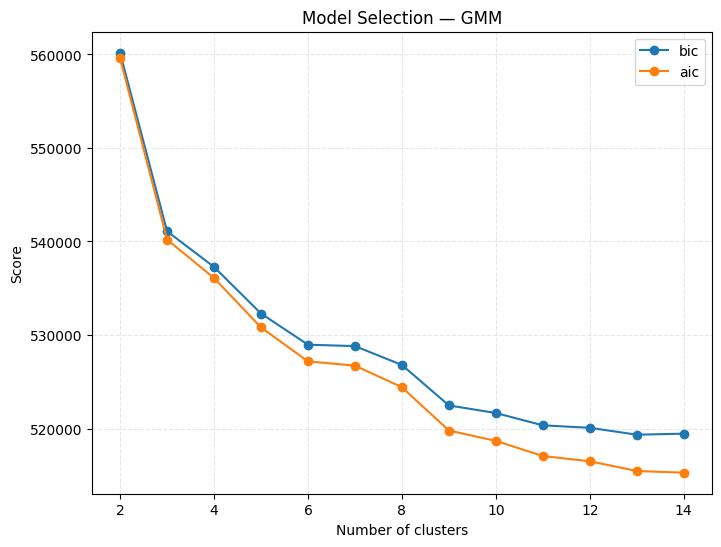

'\n# Scatter plot\n\n# on met iloc car df_quanti est un DataFrame, et on veut les 2 premières colonnes (PC1 et PC2)\nsc = plt.scatter(df_quanti.iloc[:, 0], df_quanti.iloc[:, 1],\n                     c=clusters_gmm, s=1, alpha=0.15,s=3, cmap=cmap)\n\n\naxes[i].title("Individuals factor map — GMM")\nplt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")\nplt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")\nplt.grid(True, linestyle="--", alpha=0.3)\nplt.colorbar(sc, ax=plt.gca(), ticks=range(K), label="Cluster", shrink=0.6)\nplt.show()\n'

In [64]:
from sklearn.decomposition import PCA
#based on the previous results, we will keep 7 components for the PCA (explained variance > 80%)
pca = PCA(n_components=7)
X_pca = pca.fit_transform(df_quanti)   

K_min = 2
K_max = 15

axes, fig = plt.subplots(figsize=(8, 6))

scores={score: [] for score in ["bic", "aic"]}

for K in range(K_min, K_max):
    cmap = plt.get_cmap("Set3", K)

    gmm = GaussianMixture(n_components=K, n_init=3)
    clusters_gmm = gmm.fit_predict(X_pca)

    scores["bic"].append(gmm.bic(X_pca))
    scores["aic"].append(gmm.aic(X_pca))

# --- #

for score_name in scores.keys():
    plt.plot(range(K_min, K_max), scores[score_name], marker="o", label=score_name)
plt.legend()
plt.xlabel("Number of clusters")
plt.ylabel("Score")
plt.title("Model Selection — GMM")
plt.grid(True, linestyle="--", alpha=0.3)
plt.show()




"""
# Scatter plot

# on met iloc car df_quanti est un DataFrame, et on veut les 2 premières colonnes (PC1 et PC2)
sc = plt.scatter(df_quanti.iloc[:, 0], df_quanti.iloc[:, 1],
                     c=clusters_gmm, s=1, alpha=0.15,s=3, cmap=cmap)


axes[i].title("Individuals factor map — GMM")
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
plt.grid(True, linestyle="--", alpha=0.3)
plt.colorbar(sc, ax=plt.gca(), ticks=range(K), label="Cluster", shrink=0.6)
plt.show()
"""




On choisit un K optimal qui fait le compromis entre un score (AIC ou BIC) faible avec un nombre de classes faible pour éviter l'overfitting. Ici on choisit soit K=6 ou K=8.

##### b) Distorsion Score - Elbow Method

In [ ]:
## TO FINISH!!

K = 6

cmap = plt.get_cmap("Set3", K)
gmm = GaussianMixture(n_components=K, n_init=3)
clusters_gmm = gmm.fit_predict(X_pca)

n_sizes = 20
x = np.arange(n_sizes, 0, -1)
y = gmm.distances_[-n_sizes:]

fig, ax = plt.subplots(figsize=(8, 4))

ax.plot(x, y, marker="o", color="steelblue", linewidth=2, markersize=6)

ax.set_xlabel("Number of clusters")
ax.set_ylabel("Merge distance")
ax.set_title("Elbow method — Agglomerative Clustering")
ax.set_xticks(x)
ax.spines[["top", "right"]].set_visible(False)
ax.grid(True, linestyle="--", alpha=0.3)

plt.tight_layout()
plt.show()

AttributeError: 'GaussianMixture' object has no attribute 'distances_'

## Analyse thématique

#### 1. Analyse Temporelle

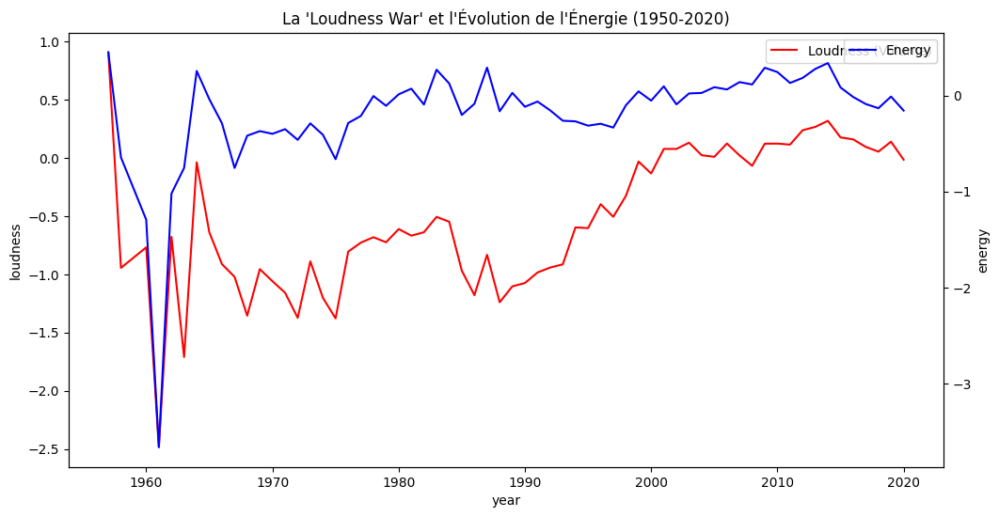

In [ ]:
# 1. Extraction propre de l'année
# On s'assure que c'est bien du texte avant le split pour éviter les erreurs de type
data['year'] = data['track_album_release_date'].astype(str).str[:4]
data['year'] = pd.to_numeric(data['year'], errors='coerce')

# 2. Filtrer les années aberrantes (si besoin, ex: avant 1950)
df_temporel = data[data['year'] > 1950]

# 3. Calcul de la moyenne annuelle
# On reconvertit en float standard pour éviter les soucis de FloatingArray avec Seaborn
evolution = df_temporel.groupby('year')[['loudness', 'energy', 'danceability']].mean().astype(float)

# 4. Plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=evolution['loudness'], color='red', label='Loudness (Volume)')
plt.twinx() # Créer un deuxième axe Y pour l'énergie car les échelles diffèrent
sns.lineplot(data=evolution['energy'], color='blue', label='Energy')

plt.title("La 'Loudness War' et l'Évolution de l'Énergie (1950-2020)")
plt.xlabel("Année de sortie")
plt.show()

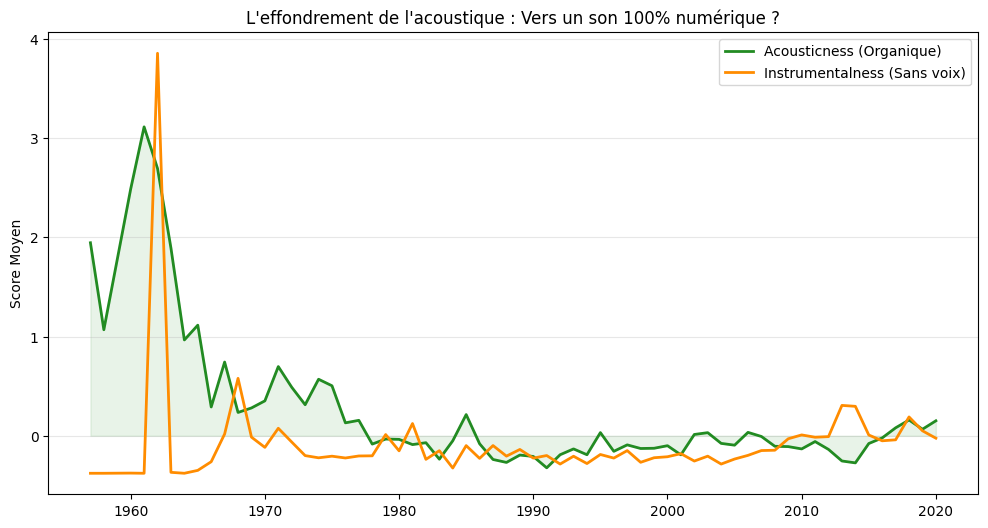

In [ ]:
# On prépare les données (en s'assurant que ce sont des floats)
evo_organic = df_temporel.groupby('year')[['acousticness', 'instrumentalness', 'speechiness']].mean().astype(float)

plt.figure(figsize=(12, 6))
plt.plot(evo_organic.index, evo_organic['acousticness'], label='Acousticness (Organique)', color='forestgreen', lw=2)
plt.plot(evo_organic.index, evo_organic['instrumentalness'], label='Instrumentalness (Sans voix)', color='darkorange', lw=2)
plt.fill_between(evo_organic.index, evo_organic['acousticness'], alpha=0.1, color='forestgreen')

plt.title("L'effondrement de l'acoustique : Vers un son 100% numérique ?")
plt.ylabel("Score Moyen")
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.show()

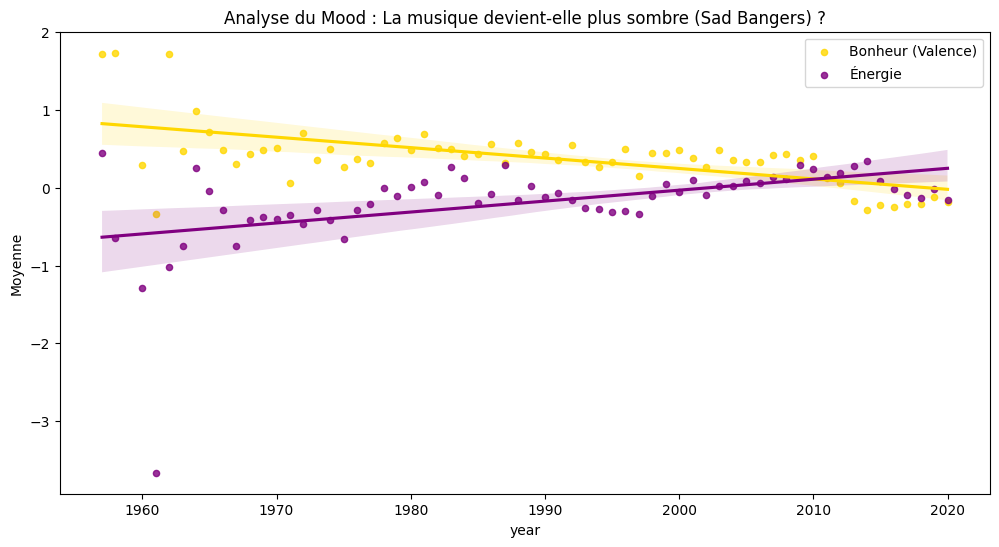

In [ ]:
# Calcul du ratio
evo_mood = df_temporel.groupby('year')[['valence', 'energy']].mean().astype(float)

plt.figure(figsize=(12, 6))
sns.regplot(x=evo_mood.index, y=evo_mood['valence'], scatter_kws={'s':20}, label='Bonheur (Valence)', color='gold')
sns.regplot(x=evo_mood.index, y=evo_mood['energy'], scatter_kws={'s':20}, label='Énergie', color='purple')

plt.title("Analyse du Mood : La musique devient-elle plus sombre (Sad Bangers) ?")
plt.ylabel("Moyenne")
plt.legend()
plt.show()

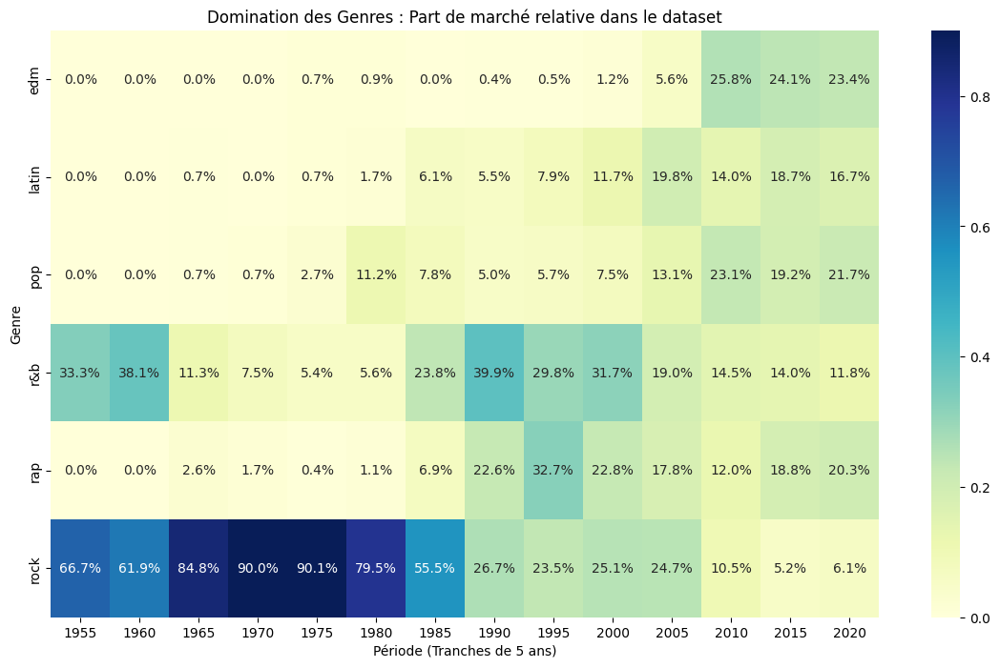

In [ ]:
# 1. Création de tranches de 5 ans pour plus de clarté
data['period'] = (data['year'] // 5) * 5

# 2. On compte le nombre de chansons par genre et par période
genre_trend = data.groupby(['period', 'playlist_genre']).size().unstack().fillna(0)

# 3. Normalisation par ligne (pour voir la part de marché relative)
genre_trend_pct = genre_trend.div(genre_trend.sum(axis=1), axis=0)

plt.figure(figsize=(14, 8))
sns.heatmap(genre_trend_pct.T, annot=True, fmt=".1%", cmap="YlGnBu")
plt.title("Domination des Genres : Part de marché relative dans le dataset")
plt.ylabel("Genre")
plt.xlabel("Période (Tranches de 5 ans)")
plt.show()

#### 2. Analyse Genre

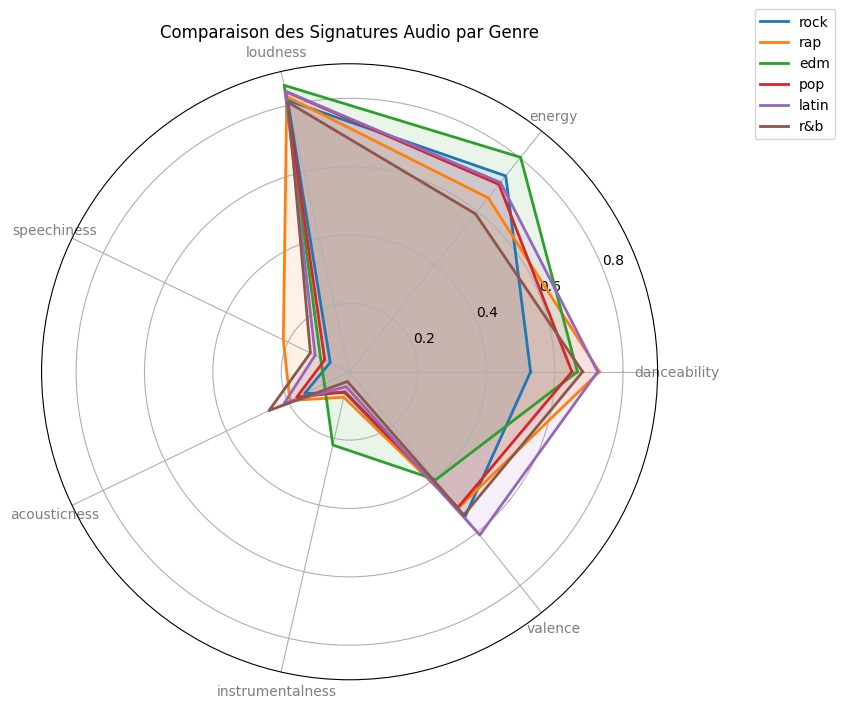

In [ ]:
import numpy as np
from math import pi

# 1. Sélection des colonnes et normalisation (Min-Max) pour que tout soit entre 0 et 1
cols_radar = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'valence']
df_radar = data[cols_radar + ['playlist_genre']].copy()

# Normalisation pour le graphique
for col in cols_radar:
    df_radar[col] = (df_radar[col] - df_radar[col].min()) / (df_radar[col].max() - df_radar[col].min())

# Moyenne par genre
stats = df_radar.groupby('playlist_genre').mean()

def make_radar(genres_list, data_stats):
    categories = list(data_stats.columns)
    N = len(categories)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    
    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
    
    for genre in genres_list:
        # Utilisation de .to_numpy() pour éviter le bug FloatingArray
        values = data_stats.loc[genre].to_numpy().flatten().tolist()
        values += values[:1]
        ax.plot(angles, values, linewidth=2, linestyle='solid', label=genre)
        ax.fill(angles, values, alpha=0.1)
    
    plt.xticks(angles[:-1], categories, color='grey', size=10)
    plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
    plt.title("Comparaison des Signatures Audio par Genre")
    plt.show()

# Affichage : tu peux changer les genres dans la liste
make_radar(['rock', 'rap', 'edm', 'pop', 'latin', 'r&b'], stats)

C:\Users\lenovoyoga914\AppData\Local\Temp\ipykernel_26972\191147585.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


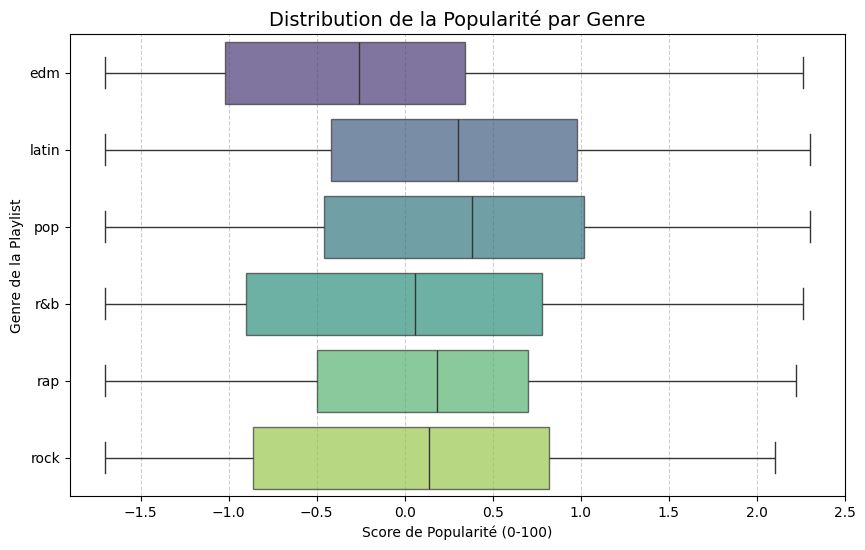

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# On prépare les données en forçant les types
plot_data = data[['playlist_genre', 'track_popularity']].copy()
plot_data['track_popularity'] = plot_data['track_popularity'].astype(float)

plt.figure(figsize=(10, 6))
# Boxplot horizontal pour voir la distribution par genre
sns.boxplot(
    data=plot_data, 
    x='track_popularity', 
    y='playlist_genre', 
    palette='viridis',
    boxprops=dict(alpha=.7)
)

plt.title("Distribution de la Popularité par Genre", fontsize=14)
plt.xlabel("Score de Popularité (0-100)")
plt.ylabel("Genre de la Playlist")
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.show()

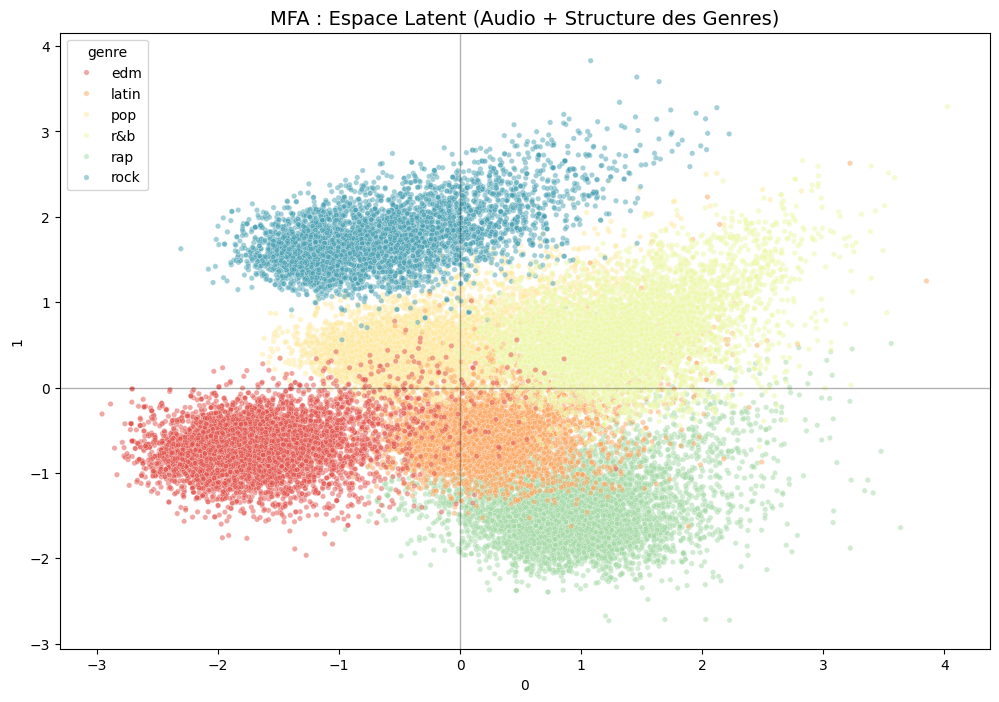

In [ ]:
import prince
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Préparation des données
audio_features = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 
                  'instrumentalness', 'liveness', 'valence', 'tempo']

# Création des variables "dummies" pour le genre (0 ou 1)
genre_dummies = pd.get_dummies(data['playlist_genre'], prefix='genre')
genre_cols = genre_dummies.columns.tolist()

# On assemble le tout : Audio + Genres encodés
X_mfa = pd.concat([data[audio_features].astype(float), genre_dummies], axis=1)

# 2. Définition des groupes (tous numériques maintenant)
groups = {
    'Audio': audio_features,
    'Genre_Struct': genre_cols
}

# 3. Fit de la MFA
mfa = prince.MFA(n_components=2, n_iter=3, random_state=42)
mfa = mfa.fit(X_mfa, groups=groups)

# 4. Visualisation
row_coords = mfa.row_coordinates(X_mfa)
row_coords['genre'] = data['playlist_genre'].values

plt.figure(figsize=(12, 8))
sns.scatterplot(data=row_coords, x=0, y=1, hue='genre', alpha=0.5, s=15, palette='Spectral')

plt.axhline(0, color='black', lw=1, alpha=0.3)
plt.axvline(0, color='black', lw=1, alpha=0.3)
plt.title("MFA : Espace Latent (Audio + Structure des Genres)", fontsize=14)
plt.show()

#Le groupe "EDM" (Bleu) , rock (jaune) et "RAP" (Orange) sont les plus excentrés et les moins mélangés entre eux. 

Le centre du graphique est un "carrefour" où la POP (Rouge) et le R&B (Vert), latin(jaune-vert) se mélangent énormément.

Rapport de données : "Le modèle MFA identifie trois pôles distincts (EDM, RAP, ROCK) et une zone de forte corrélation centrale (POP/R&B/latin) où les caractéristiques audio sont hybrides.

Sur l'Axe 0 (Horizontal) :
À gauche, j'ai l'EDM. Si je regarde mes statistiques descriptives (moyennes par genre), je verrais que l'EDM a les valeurs de energy et loudness les plus hautes.
À droite, j'ai le Rap. Les stats montreraient un speechiness élevé.
Conclusion: L'Axe 0 semble être un gradient de densité sonore / présence vocale.

Sur l'Axe 1 (Vertical) :
Tout en haut, j'ai le Rock.
Tout en bas, j'ai le Rap et le Latin.
Conclusion : L'Axe 1 sépare probablement les morceaux selon leur instrumentation 

#### 3. Analyse Popularité

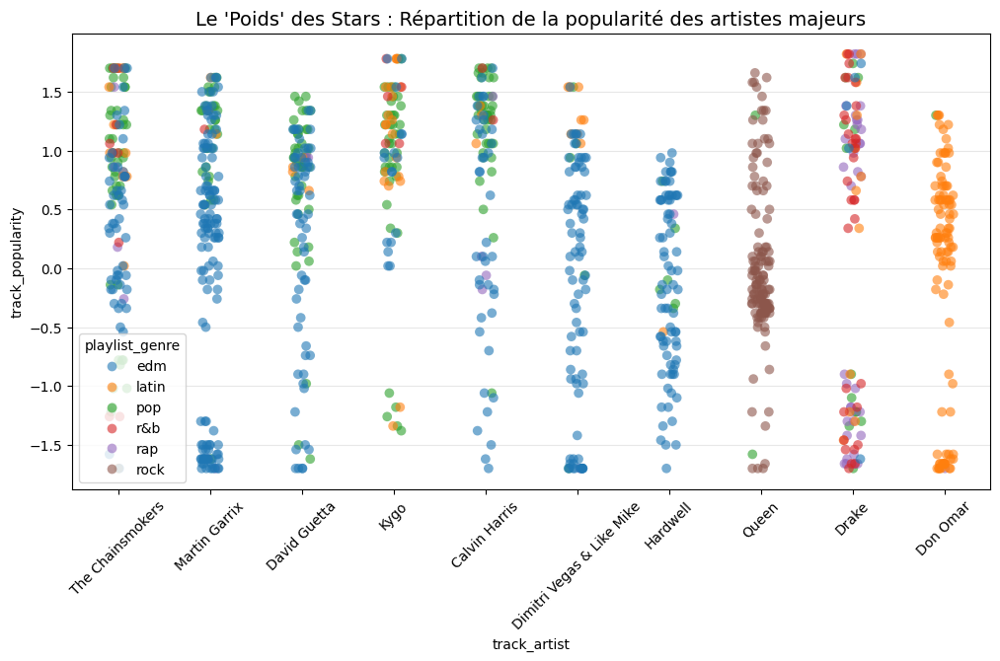

In [ ]:
# 1. Trouver les top 10 artistes par nombre de chansons
top_artists = data['track_artist'].value_counts().nlargest(10).index
df_top = data[data['track_artist'].isin(top_artists)].copy()
df_top['track_popularity'] = df_top['track_popularity'].astype(float)
df_top['energy'] = df_top['energy'].astype(float)

plt.figure(figsize=(12, 6))
# Stripplot : chaque point est une chanson, alignée par artiste
sns.stripplot(
    data=df_top, x='track_artist', y='track_popularity', 
    hue='playlist_genre', jitter=True, alpha=0.6, size=7
)

plt.xticks(rotation=45)
plt.title("Le 'Poids' des Stars : Répartition de la popularité des artistes majeurs", fontsize=14)
plt.grid(axis='y', alpha=0.3)
plt.show()

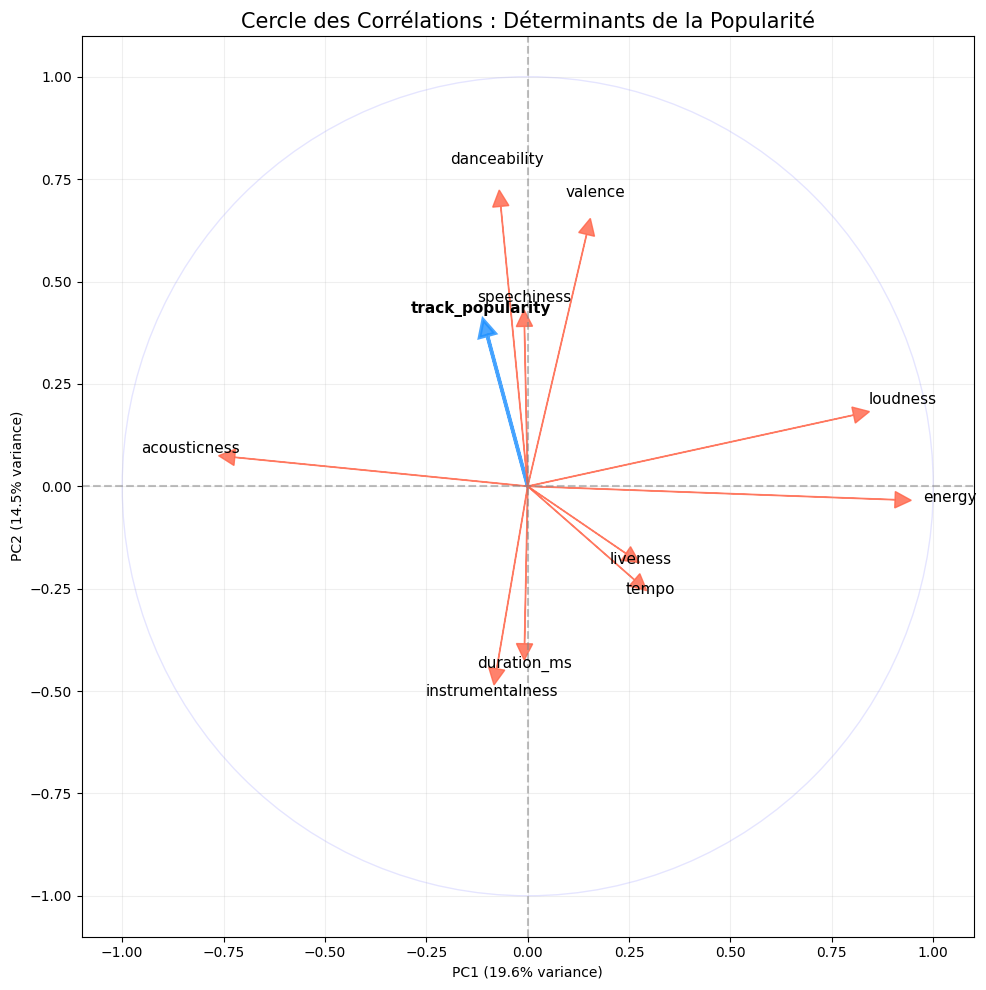

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# 1. Liste des variables
features = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 
            'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']
target = 'track_popularity'
all_vars = [target] + features

# 2. Scaling (Centrage et Réduction) - Crucial pour le cercle
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[all_vars])

# 3. Calcul de la PCA
pca = PCA(n_components=2)
pca.fit(data_scaled)

# 4. Extraction des corrélations (Loadings)
# On multiplie les composantes par la racine des valeurs propres
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
loadings_df = pd.DataFrame(loadings, columns=['PC1', 'PC2'], index=all_vars)

# 5. Visualisation du Cercle
plt.figure(figsize=(10, 10))
plt.xlim(-1.1, 1.1)
plt.ylim(-1.1, 1.1)
plt.axhline(0, color='grey', ls='--', alpha=0.5)
plt.axvline(0, color='grey', ls='--', alpha=0.5)

# Dessin du cercle unité
circle = plt.Circle((0,0), 1, color='blue', fill=False, linestyle='-', alpha=0.1)
plt.gca().add_artist(circle)

# Tracé des flèches
for var in all_vars:
    x = loadings_df.loc[var, 'PC1']
    y = loadings_df.loc[var, 'PC2']
    
    # Mise en évidence de la popularité
    is_pop = (var == target)
    color = 'dodgerblue' if is_pop else 'tomato'
    width = 2.5 if is_pop else 1
    
    plt.arrow(0, 0, x, y, head_width=0.04, head_length=0.04, 
              color=color, linewidth=width, alpha=0.8)
    
    # Label
    plt.text(x*1.15, y*1.15, var, color='black', 
             fontweight='bold' if is_pop else 'normal', fontsize=11, ha='center')

plt.title("Cercle des Corrélations : Déterminants de la Popularité", fontsize=15)
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.1%} variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.1%} variance)")
plt.grid(True, alpha=0.2)
plt.tight_layout()
plt.show()

##### Popularity and genre

Mean popularity by genre:
 playlist_genre
pop      0.217702
latin    0.195920
rap      0.046279
rock    -0.010080
r&b     -0.037721
edm     -0.280857
Name: track_popularity, dtype: float64


C:\Users\lenovoyoga914\AppData\Local\Temp\ipykernel_26972\409691029.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_clean,


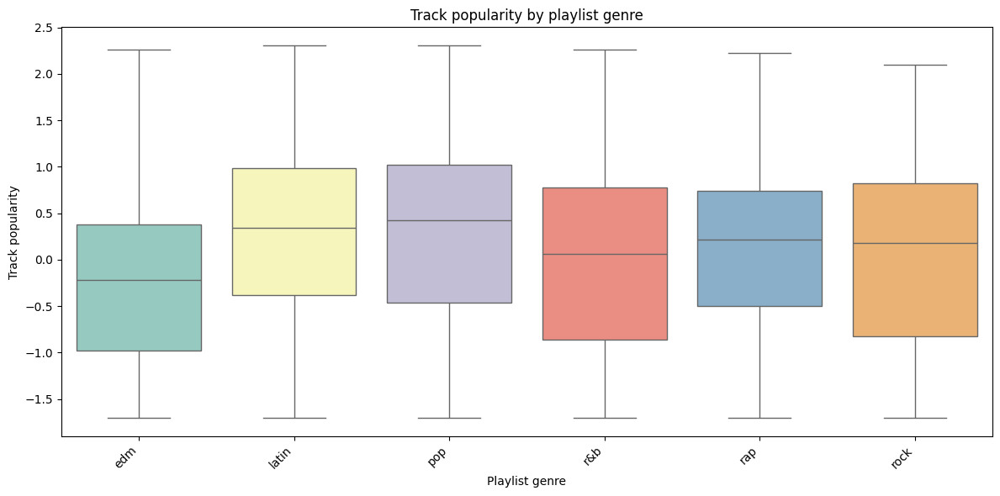

In [ ]:
# basic statistics per genre
mean_pop = df_clean.groupby('playlist_genre')['track_popularity'] \
                   .mean() \
                   .sort_values(ascending=False)
print("Mean popularity by genre:\n", mean_pop)

# visual comparison
plt.figure(figsize=(12,6))
sns.boxplot(data=df_clean,
            x='playlist_genre',
            y='track_popularity',
            palette="Set3")
plt.xticks(rotation=45, ha='right')
plt.title('Track popularity by playlist genre')
plt.ylabel('Track popularity')
plt.xlabel('Playlist genre')
plt.tight_layout()
plt.show()


In [ ]:
# Convert track_popularity into categories: low, medium, high
# Assuming track_popularity is scaled between 0 and 1
bins = [0, 0.33, 0.66, 1]
labels = ['low', 'medium', 'high']
df_clean['popularity_class'] = pd.cut(df_clean['track_popularity'], bins=bins, labels=labels, include_lowest=True)

quali_features_restricted = ['mode','key','playlist_genre','playlist_subgenre']

for quali_var in quali_features_restricted:
    # Build contingency table: rows = playlist_genre, columns = popularity_class
    contingency_table = pd.crosstab(df_clean[quali_var], df_clean['popularity_class'])

    print(f"Contingency Table: {quali_var} vs Popularity Class")
    print(contingency_table)

    """# Optional: Visualize with a heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(contingency_table, annot=True, cmap='Blues', fmt='d')
    plt.title('Contingency Table: Playlist Genre vs Popularity Class')
    plt.xlabel('Popularity Class')
    plt.ylabel(quali_var)
    plt.show()"""
    

Contingency Table: mode vs Popularity Class
popularity_class   low  medium  high
mode                                
0                 1524    1631  1669
1                 1909    2027  2240
Contingency Table: key vs Popularity Class
popularity_class  low  medium  high
key                                
0                 367     378   445
1                 416     467   454
2                 265     279   333
3                 122     102   105
4                 219     254   225
5                 272     318   339
6                 284     292   322
7                 362     349   363
8                 279     309   343
9                 285     325   346
10                237     268   291
11                325     317   343
Contingency Table: playlist_genre vs Popularity Class
popularity_class  low  medium  high
playlist_genre                     
edm               708     547   446
latin             616     598   629
pop               482     619   761
r&b               496     5


ANALYSIS: key vs popularity_class

Chi-square test:
Chi2 statistic = 25.0692
Degrees of freedom = 22
p-value = 0.293778
Cramér's V = 0.0338


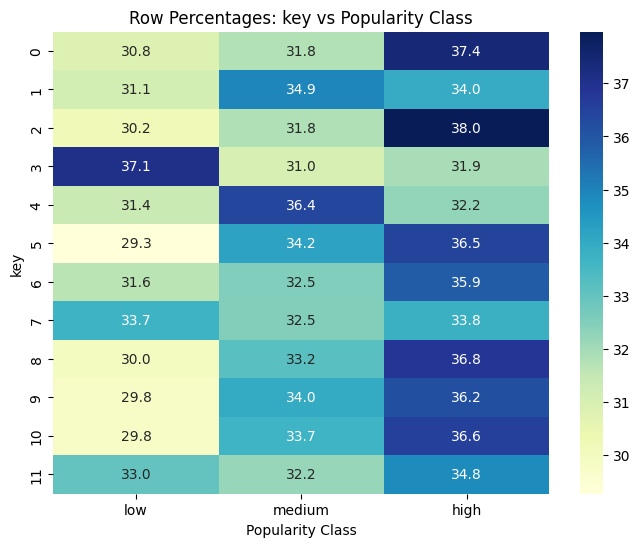

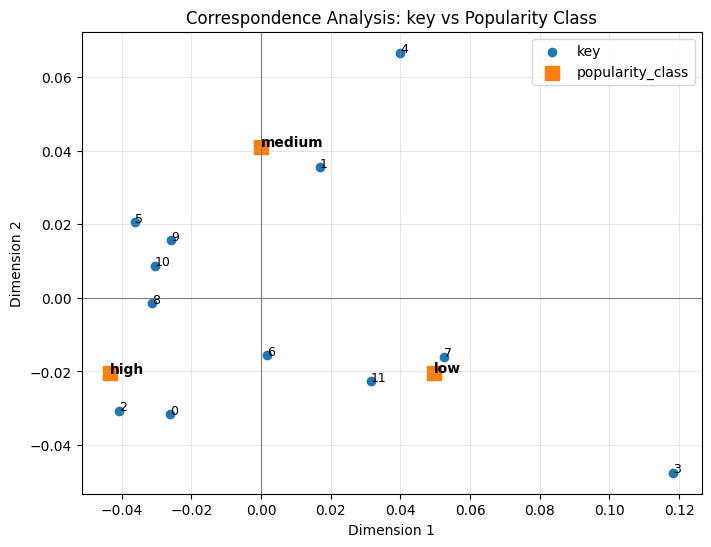


ANALYSIS: playlist_genre vs popularity_class

Chi-square test:
Chi2 statistic = 167.0166
Degrees of freedom = 10
p-value = 0.000000
Cramér's V = 0.0871


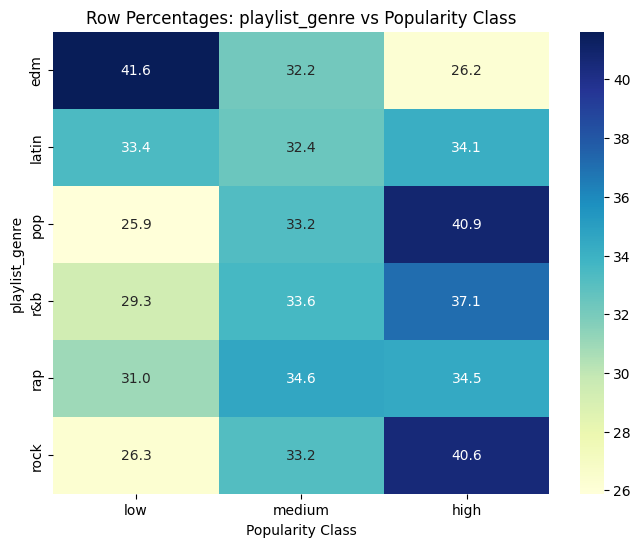

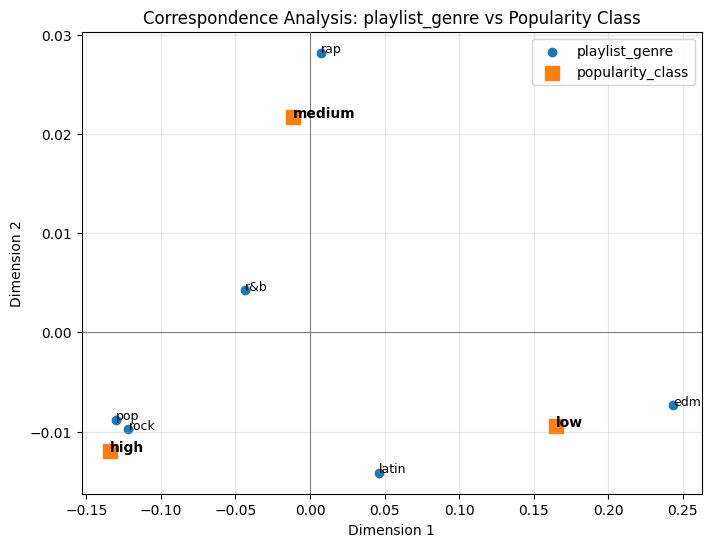


ANALYSIS: playlist_subgenre vs popularity_class

Chi-square test:
Chi2 statistic = 483.5988
Degrees of freedom = 46
p-value = 0.000000
Cramér's V = 0.1483


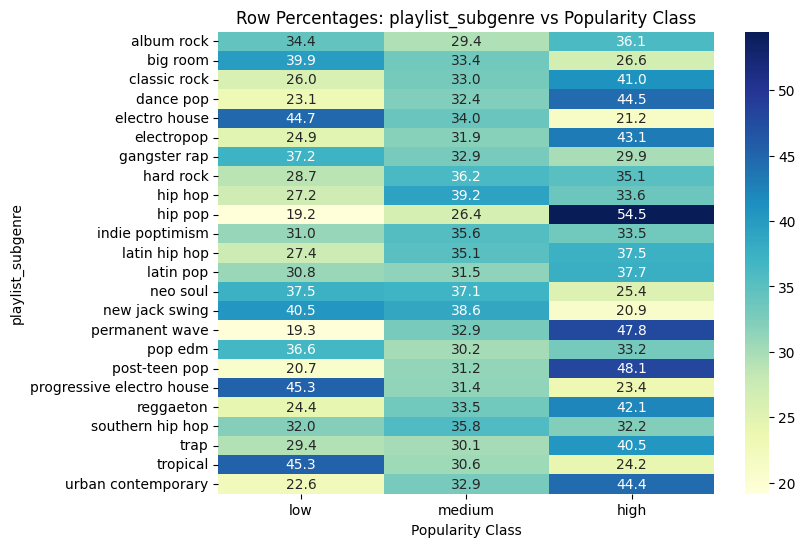

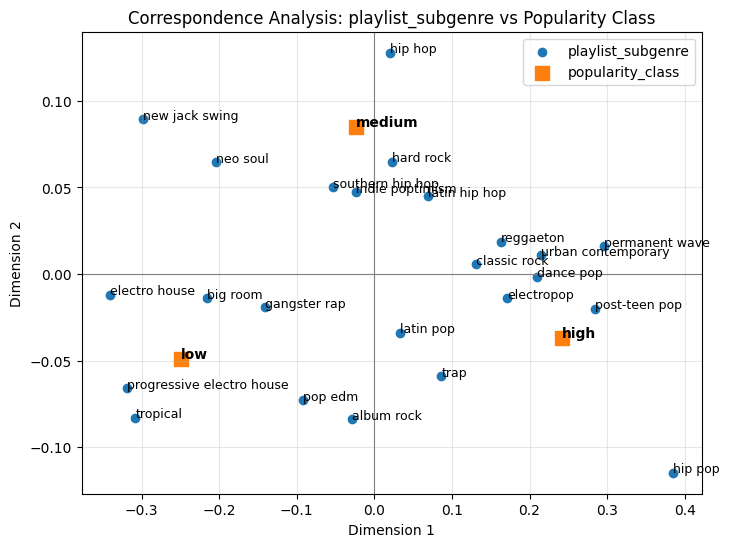

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import chi2_contingency
import prince

# ---------------------------------------------------
# 1. Create popularity classes
# ---------------------------------------------------
bins = [0, 0.33, 0.66, 1]
labels = ['low', 'medium', 'high']

df_clean['popularity_class'] = pd.cut(
    df_clean['track_popularity'],
    bins=bins,
    labels=labels,
    include_lowest=True
)

# qualitative variables to study
quali_features_restricted = ['key', 'playlist_genre', 'playlist_subgenre']

# ---------------------------------------------------
# 2. Function to compute Cramér's V
# ---------------------------------------------------
def cramers_v(contingency_table):
    chi2 = chi2_contingency(contingency_table)[0]
    n = contingency_table.to_numpy().sum()
    r, k = contingency_table.shape
    return np.sqrt(chi2 / (n * (min(r, k) - 1)))

# ---------------------------------------------------
# 3. Full analysis loop
# ---------------------------------------------------
for quali_var in quali_features_restricted:
    print("\n" + "="*70)
    print(f"ANALYSIS: {quali_var} vs popularity_class")
    print("="*70)

    # contingency table
    contingency_table = pd.crosstab(df_clean[quali_var], df_clean['popularity_class'])

    # row percentages
    row_perc = contingency_table.div(contingency_table.sum(axis=1), axis=0) * 100

    # chi-square test
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print("\nChi-square test:")
    print(f"Chi2 statistic = {chi2:.4f}")
    print(f"Degrees of freedom = {dof}")
    print(f"p-value = {p:.6f}")

    # Cramér's V
    v = cramers_v(contingency_table)
    print(f"Cramér's V = {v:.4f}")

    # standardized residuals
    residuals = (contingency_table - expected) / np.sqrt(expected)
    residuals = pd.DataFrame(
        residuals,
        index=contingency_table.index,
        columns=contingency_table.columns
    )


    """# ---------------------------------------------------
    # 4. Heatmap of counts
    # ---------------------------------------------------
    plt.figure(figsize=(8, 6))
    sns.heatmap(contingency_table, annot=True, cmap='Blues', fmt='d')
    plt.title(f'Counts: {quali_var} vs Popularity Class')
    plt.xlabel('Popularity Class')
    plt.ylabel(quali_var)
    plt.show()"""

    # ---------------------------------------------------
    # 5. Heatmap of row percentages
    # ---------------------------------------------------
    plt.figure(figsize=(8, 6))
    sns.heatmap(row_perc, annot=True, cmap='YlGnBu', fmt='.1f')
    plt.title(f'Row Percentages: {quali_var} vs Popularity Class')
    plt.xlabel('Popularity Class')
    plt.ylabel(quali_var)
    plt.show()

    """# ---------------------------------------------------
    # 6. Heatmap of standardized residuals
    # ---------------------------------------------------
    plt.figure(figsize=(8, 6))
    sns.heatmap(residuals, annot=True, cmap='coolwarm', center=0, fmt='.2f')
    plt.title(f'Standardized Residuals: {quali_var} vs Popularity Class')
    plt.xlabel('Popularity Class')
    plt.ylabel(quali_var)
    plt.show()"""

    # ---------------------------------------------------
    # 7. Correspondence Analysis
    # ---------------------------------------------------
    ca = prince.CA(n_components=2, random_state=42)
    ca = ca.fit(contingency_table)

    row_coords = ca.row_coordinates(contingency_table)
    col_coords = ca.column_coordinates(contingency_table)

    plt.figure(figsize=(8, 6))

    # row points
    plt.scatter(row_coords[0], row_coords[1], label=quali_var)
    for i, txt in enumerate(row_coords.index):
        plt.annotate(txt, (row_coords.iloc[i, 0], row_coords.iloc[i, 1]), fontsize=9)

    # column points
    plt.scatter(col_coords[0], col_coords[1], marker='s', s=100, label='popularity_class')
    for i, txt in enumerate(col_coords.index):
        plt.annotate(txt, (col_coords.iloc[i, 0], col_coords.iloc[i, 1]), fontsize=10, fontweight='bold')

    plt.axhline(0, color='grey', linewidth=0.8)
    plt.axvline(0, color='grey', linewidth=0.8)
    plt.title(f'Correspondence Analysis: {quali_var} vs Popularity Class')
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

##### Top 10%

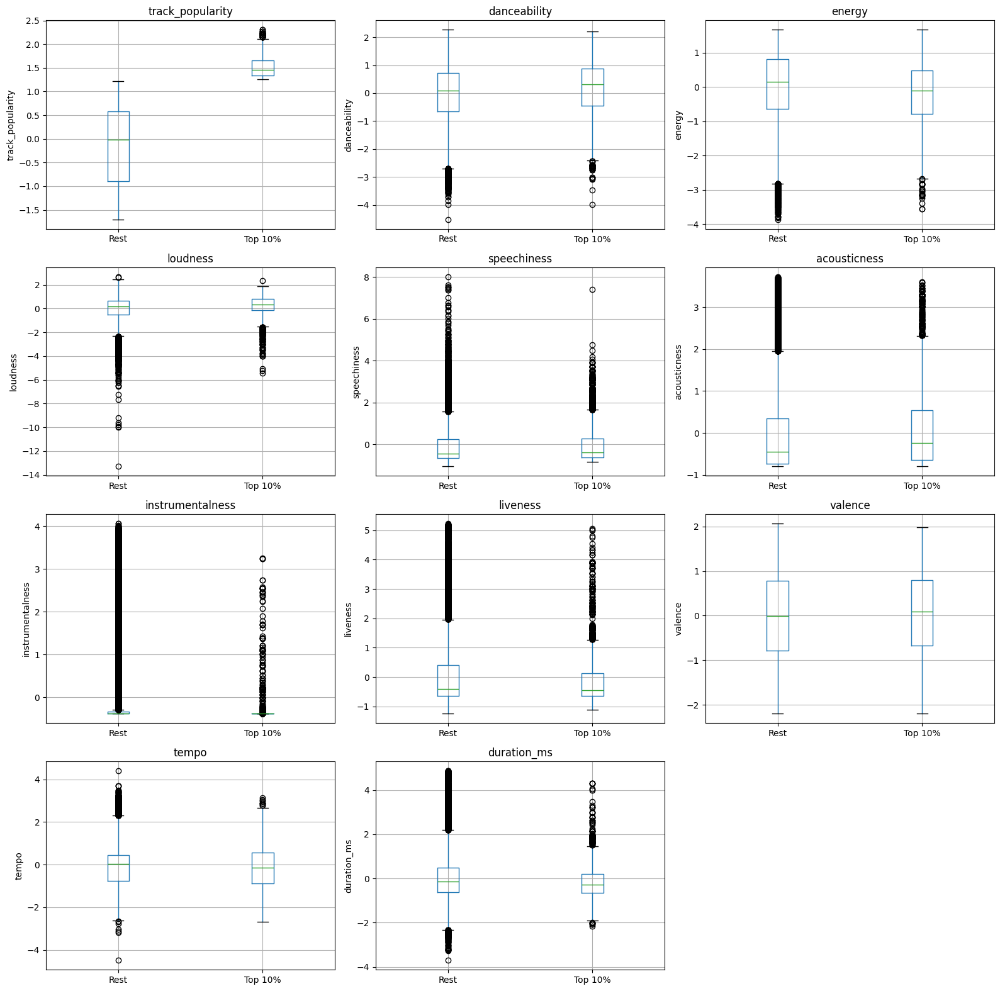

In [ ]:

df_box = data.copy()
popularity_threshold = df_box["track_popularity"].quantile(0.90)
df_box["popularity_group"] = np.where(
    df_box["track_popularity"] >= popularity_threshold,
    "Top 10%",
    "Rest"
)

features_to_plot = quant_cols

n_features = len(features_to_plot)
ncols = 3
nrows = int(np.ceil(n_features / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 4 * nrows))
axes = axes.flatten()

for i, feature in enumerate(features_to_plot):
    df_box.boxplot(column=feature, by="popularity_group", ax=axes[i])
    axes[i].set_title(feature)
    axes[i].set_xlabel("")
    axes[i].set_ylabel(feature)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Comparison of Top 10% most popular songs vs Rest")
fig.suptitle("")
plt.tight_layout()
plt.show()

On observe que le 10% des chansons les plus populaires ne présentent pas spécialement de différences majeures par rapport au reste des chansons de notre base de données. Nous pouvons toutefois observer que pour les chansons populaires il y a une légère tendence vers des chansons plus courtes (duration_ms), plus positives (valence), moins énergétiques, plus acoustiques, dansantes et avec une d'intensité sonore plus élevé.

#### 4. Analyse Charactéristiques Audio

#### 5. Song recommendation

In [ ]:
from sklearn.preprocessing import StandardScaler
features = quant_cols
scaler = StandardScaler()
data_plot = data.copy()
data_plot[features] = scaler.fit_transform(data[features])

def id_to_name(song_id, data):
    song_info = data[data['track_id'] == song_id]
    if not song_info.empty:
        return song_info.iloc[0]['track_name']
    else:
        return "Chanson non trouvée"

def similarity_score_euclidean(row1, row2):
    # On utilise la distance euclidienne inversée pour mesurer la similarité entre deux chansons
    dist = np.linalg.norm(row1 - row2)
    return 1 / (1 + dist)  # Plus la distance est petite, plus la similarité est grande

def similarity_score_cosine(row1, row2):
    # Similarité cosinus
    dot_product = np.dot(row1, row2)
    norm_a = np.linalg.norm(row1)
    norm_b = np.linalg.norm(row2)
    if norm_a == 0 or norm_b == 0:
        return 0.0
    return dot_product / (norm_a * norm_b)

def similarity_pca(row1, row2, pca):
    # On projette les chansons dans l'espace PCA et on calcule la distance euclidienne inversée
    proj1 = pca.transform(row1.reshape(1, -1))
    proj2 = pca.transform(row2.reshape(1, -1))
    dist = np.linalg.norm(proj1 - proj2)
    return 1 / (1 + dist)

def recommend_songs(song_id, data, features, top_n=5):
    # On trouve la chanson cible
    target_song = data[data['track_id'] == song_id]
    if target_song.empty:
        print("Chanson non trouvée.")
        return []
    
    target_features = target_song.iloc[0][features].to_numpy(dtype=float)
    
    pca = PCA(n_components=2)
    pca.fit(data[features].values.astype(float))

    # Calcul des similarités avec toutes les autres chansons
    similarities = []
    for idx, row in data.iterrows():
        if row['track_id'] == song_id:
            continue  # On ignore la chanson cible
        row_features = row[features].values.flatten()
        sim_euclidean = similarity_score_euclidean(target_features, row_features)
        sim_cosine = similarity_score_cosine(target_features, row_features)
        sim_pca = similarity_pca(target_features, row_features, pca)
        similarities.append((row['track_id'], sim_euclidean, sim_cosine, sim_pca))
    
    # Tri par similarité (euclidienne ou cosinus)
    similarities.sort(key=lambda x: x[1], reverse=True)  # Tri par euclidienne
    top_euclidean = similarities[:top_n]
    
    similarities.sort(key=lambda x: x[2], reverse=True)  # Tri par cosinus
    top_cosine = similarities[:top_n]

    similarities.sort(key=lambda x: x[3], reverse=True)  # Tri par PCA 
    top_pca = similarities[:top_n]
    
    return top_euclidean, top_cosine, top_pca

features = quant_cols  # On utilise les variables quantitatives pour la recommandation

song_name = 'Lucky'
song_id = data[data['track_name'] == song_name]['track_id'].values[0]
recommended_songs_euclidean, recommended_songs_cosine, recommended_songs_pca = recommend_songs(song_id, data, features)

print("Recommandations basées sur la similarité euclidienne:")
for song in recommended_songs_euclidean:
    print(f"Track title: {id_to_name(song[0], data)}, Similarité Euclidienne: {song[1]:.4f}")

print("\nRecommandations basées sur la similarité cosinus:")
for song in recommended_songs_cosine:
    print(f"Track title: {id_to_name(song[0], data)}, Similarité Cosinus: {song[2]:.4f}")

print("\nRecommandations basées sur la similarité PCA:")
for song in recommended_songs_pca:
    print(f"Track title: {id_to_name(song[0], data)}, Similarité PCA: {song[3]:.4f}")

Recommandations basées sur la similarité euclidienne:
Track title: XO, Similarité Euclidienne: 0.4322
Track title: Me Enamoré, Similarité Euclidienne: 0.4321
Track title: Society, Similarité Euclidienne: 0.3958
Track title: Waves - Guitar Acoustic, Similarité Euclidienne: 0.3852
Track title: idontwannabeyouanymore, Similarité Euclidienne: 0.3579

Recommandations basées sur la similarité cosinus:
Track title: Me Enamoré, Similarité Cosinus: 0.9639
Track title: XO, Similarité Cosinus: 0.9632
Track title: Society, Similarité Cosinus: 0.9494
Track title: You Are The Reason, Similarité Cosinus: 0.9482
Track title: Pink Matter, Similarité Cosinus: 0.9471

Recommandations basées sur la similarité PCA:
Track title: Turning Tables, Similarité PCA: 0.9842
Track title: Electric (feat. Khalid), Similarité PCA: 0.9566
Track title: Nikes, Similarité PCA: 0.9551
Track title: Slow Burn, Similarité PCA: 0.9410
Track title: Trampled Rose, Similarité PCA: 0.9382


In [ ]:
def explain_similarity(song_id_target, song_id_candidate, data, features, top_k=5):
    target_row = data[data['track_id'] == song_id_target].iloc[0]
    candidate_row = data[data['track_id'] == song_id_candidate].iloc[0]

    target_features = target_row[features].to_numpy(dtype=float)
    candidate_features = candidate_row[features].to_numpy(dtype=float)

    abs_diff = np.abs(target_features - candidate_features)

    comparison = pd.DataFrame({
        'feature': features,
        'target_value': target_features,
        'candidate_value': candidate_features,
        'abs_difference': abs_diff
    })

    comparison = comparison.sort_values('abs_difference')

    most_similar_features = comparison.head(top_k)
    most_different_features = comparison.tail(top_k)

    return comparison, most_similar_features, most_different_features

def similarity_summary(song_id_target, song_id_candidate, data, features, top_k=5):
    _, most_similar, most_different = explain_similarity(
        song_id_target, song_id_candidate, data, features, top_k=top_k
    )

    target_name = id_to_name(song_id_target, data)
    candidate_name = id_to_name(song_id_candidate, data)

    similar_feats = ", ".join(most_similar['feature'].tolist())
    different_feats = ", ".join(most_different['feature'].tolist())

    print(f'"{candidate_name}" is similar to "{target_name}" mainly in: {similar_feats}.')
    print(f'The main differences are in: {different_feats}.')

# Exemple d'utilisation
song_id_target = song_id  # "Lucky"
song_id_candidate = recommended_songs_euclidean[0][0]  # La chanson la plus similaire selon l'euclidienne

similarity_summary(song_id_target, song_id_candidate, data_plot, features)

"XO" is similar to "Lucky" mainly in: instrumentalness, tempo, energy, valence, danceability.
The main differences are in: track_popularity, speechiness, loudness, duration_ms, acousticness.


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import Counter
from sklearn.decomposition import PCA

def histogram_similar_different_side_by_side(
    song_id_target,
    data,
    features,
    method="euclidean",
    top_n_recommendations=100,
    top_k_features=5
):
    # Get recommendations
    rec_euclidean, rec_cosine, rec_pca = recommend_songs(
        song_id_target, data, features, top_n=top_n_recommendations
    )

    if method == "euclidean":
        recommended_songs = rec_euclidean
    elif method == "cosine":
        recommended_songs = rec_cosine
    elif method == "pca":
        recommended_songs = rec_pca
    else:
        raise ValueError("method must be 'euclidean', 'cosine', or 'pca'")

    similar_counter = Counter()
    different_counter = Counter()

    # Count both similar and different features
    for rec in recommended_songs:
        song_id_candidate = rec[0]

        _, most_similar_features, most_different_features = explain_similarity(
            song_id_target,
            song_id_candidate,
            data,
            features,
            top_k=top_k_features
        )

        for feat in most_similar_features["feature"]:
            similar_counter[feat] += 1

        for feat in most_different_features["feature"]:
            different_counter[feat] += 1

    # Build a common dataframe with all features
    all_features = list(features)

    feature_counts_df = pd.DataFrame({
        "feature": all_features,
        "similar_count": [similar_counter[f] for f in all_features],
        "different_count": [different_counter[f] for f in all_features]
    })

    # Optional: sort by total importance
    feature_counts_df["total"] = (
        feature_counts_df["similar_count"] + feature_counts_df["different_count"]
    )
    feature_counts_df = feature_counts_df.sort_values("total", ascending=False)

    # Plot side-by-side bars
    x = np.arange(len(feature_counts_df))
    width = 0.4

    plt.figure(figsize=(14, 6))
    plt.bar(
        x - width/2,
        feature_counts_df["similar_count"],
        width=width,
        label="Similar"
    )
    plt.bar(
        x + width/2,
        feature_counts_df["different_count"],
        width=width,
        label="Different"
    )

    plt.xticks(x, feature_counts_df["feature"], rotation=45, ha="right")
    plt.xlabel("Feature")
    plt.ylabel("Count")
    plt.title(f"Similar vs different features in top {top_n_recommendations} recommendations ({method})")
    plt.legend()
    plt.tight_layout()
    plt.show()

    return feature_counts_df

# Exemple d'utilisation
feature_counts_df = histogram_similar_different_side_by_side(
    song_id_target=song_id_target,
    data=data_plot,
    features=features,
    method="cosine",
    top_n_recommendations=100,
    top_k_features=5
)

print(feature_counts_df)

NameError: name 'song_id_target' is not defined

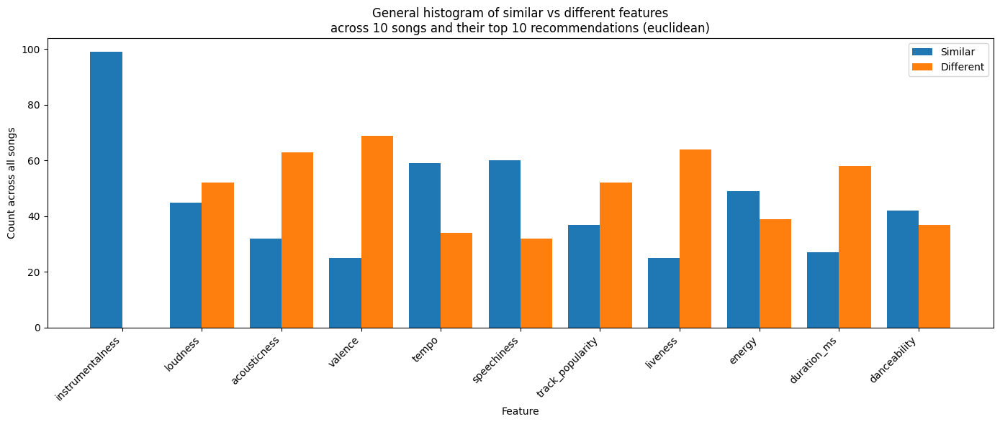

             feature  similar_count  different_count  total
6   instrumentalness             99                0     99
3           loudness             45               52     97
5       acousticness             32               63     95
8            valence             25               69     94
9              tempo             59               34     93
4        speechiness             60               32     92
0   track_popularity             37               52     89
7           liveness             25               64     89
2             energy             49               39     88
10       duration_ms             27               58     85
1       danceability             42               37     79


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import Counter
from sklearn.decomposition import PCA

def global_histogram_similar_different(
    data,
    features,
    method="euclidean",
    n_songs=100,
    top_n_recommendations=100,
    top_k_features=5
):
    """
    For the first n_songs in the dataset:
    - get top recommendations
    - extract most similar and most different features
    - aggregate counts across all songs
    - plot one final histogram
    """

    similar_counter = Counter()
    different_counter = Counter()

    # Take first n unique song IDs
    song_ids = data["track_id"].dropna().unique()[:n_songs]

    for idx, song_id_target in enumerate(song_ids):
        try:
            rec_euclidean, rec_cosine, rec_pca = recommend_songs(
                song_id_target, data, features, top_n=top_n_recommendations
            )

            if method == "euclidean":
                recommended_songs = rec_euclidean
            elif method == "cosine":
                recommended_songs = rec_cosine
            elif method == "pca":
                recommended_songs = rec_pca
            else:
                raise ValueError("method must be 'euclidean', 'cosine', or 'pca'")

            for rec in recommended_songs:
                song_id_candidate = rec[0]

                _, most_similar_features, most_different_features = explain_similarity(
                    song_id_target,
                    song_id_candidate,
                    data,
                    features,
                    top_k=top_k_features
                )

                for feat in most_similar_features["feature"]:
                    similar_counter[feat] += 1

                for feat in most_different_features["feature"]:
                    different_counter[feat] += 1

        except Exception as e:
            print(f"Error for song {song_id_target}: {e}")

    # Build final dataframe
    feature_counts_df = pd.DataFrame({
        "feature": features,
        "similar_count": [similar_counter[f] for f in features],
        "different_count": [different_counter[f] for f in features]
    })

    # Sort by total count
    feature_counts_df["total"] = (
        feature_counts_df["similar_count"] + feature_counts_df["different_count"]
    )
    feature_counts_df = feature_counts_df.sort_values("total", ascending=False)

    # Plot one final histogram
    x = np.arange(len(feature_counts_df))
    width = 0.4

    plt.figure(figsize=(14, 6))
    plt.bar(x - width/2, feature_counts_df["similar_count"], width=width, label="Similar")
    plt.bar(x + width/2, feature_counts_df["different_count"], width=width, label="Different")

    plt.xticks(x, feature_counts_df["feature"], rotation=45, ha="right")
    plt.xlabel("Feature")
    plt.ylabel("Count across all songs")
    plt.title(
        f"General histogram of similar vs different features\n"
        f"across {n_songs} songs and their top {top_n_recommendations} recommendations ({method})"
    )
    plt.legend()
    plt.tight_layout()
    plt.show()

    return feature_counts_df

# Example usage
final_counts = global_histogram_similar_different(
    data=data_plot,
    features=features,
    method="euclidean",
    n_songs=10,
    top_n_recommendations=10,
    top_k_features=5
)

print(final_counts)

#### 6. Title influence


Tout d'abord nous créons de nouvelles variables à partir des caractéristiques du titre.

In [ ]:
import pandas as pd
import numpy as np
import re
from collections import Counter

# --------------------------------------------------
# 1. Work on a copy
# --------------------------------------------------
df_title = data.copy()

# make sure title column is string
df_title["track_name"] = df_title["track_name"].fillna("").astype(str)

# remove the artist name from the title if it's there (common pattern: "Artist - Title")
# remove the parantheses content (often remix info) to focus on the main title
df_title["title_main"] = df_title["track_name"].apply(
    lambda x: x.split("-")[0].strip()
)
df_title["title_main"] = df_title["title_main"].apply(
    lambda x: re.sub(r"\(.*?\)", "", x).strip()
)


# lowercase version for text processing
df_title["track_name_clean"] = df_title["track_name"].str.lower().str.strip()
df_title["title_main_clean"] = df_title["title_main"].str.lower().str.strip()

# --------------------------------------------------
# 2. Basic text cleaning for word extraction
# --------------------------------------------------
def extract_words(title):
    # keep only letters/numbers/apostrophes inside words
    words = re.findall(r"\b[\w']+\b", title.lower())
    return words

df_title["title_words"] = df_title["title_main_clean"].apply(extract_words)

# --------------------------------------------------
# 3. Buzz words = top 100 most frequent words in titles
# --------------------------------------------------
all_words = [word for words in df_title["title_words"] for word in words]
word_counts = Counter(all_words)

top_100_words = [word for word, count in word_counts.most_common(100)]
buzz_words_set = set(top_100_words)

print("Top 100 buzz words:")
print(top_100_words)

# --------------------------------------------------
# 4. Title-based feature engineering
# --------------------------------------------------

# number of words
df_title["title_num_words"] = df_title["title_words"].apply(len)

# title length in characters
df_title["title_num_characters"] = df_title["title_main_clean"].apply(len)

# average word length
df_title["title_avg_word_length"] = df_title["title_words"].apply(
    lambda words: np.mean([len(w) for w in words]) if len(words) > 0 else 0
)

# number of unique words
df_title["title_num_unique_words"] = df_title["title_words"].apply(lambda words: len(set(words)))

# repeated word indicator
df_title["title_has_repeated_words"] = df_title["title_words"].apply(
    lambda words: int(len(words) != len(set(words)))
)

# number of buzz words in title
df_title["title_num_buzz_words"] = df_title["title_words"].apply(
    lambda words: sum(word in buzz_words_set for word in words)
)

# presence of at least one buzz word
df_title["title_has_buzz_word"] = df_title["title_num_buzz_words"].apply(lambda x: int(x > 0))

# proportion of words that are buzz words
df_title["title_buzz_word_ratio"] = df_title.apply(
    lambda row: row["title_num_buzz_words"] / row["title_num_words"] if row["title_num_words"] > 0 else 0,
    axis=1
)

# presence of any special character (anything not letter/number/space)
df_title["title_has_special_char"] = df_title["track_name"].apply(
    lambda x: int(bool(re.search(r"[^A-Za-z0-9\s]", x)))
)

# number of special characters
df_title["title_num_special_chars"] = df_title["track_name"].apply(
    lambda x: len(re.findall(r"[^A-Za-z0-9\s]", x))
)

# presence of numbers
df_title["title_has_number"] = df_title["track_name"].apply(
    lambda x: int(bool(re.search(r"\d", x)))
)

# number of digits
df_title["title_num_digits"] = df_title["track_name"].apply(
    lambda x: len(re.findall(r"\d", x))
)

# exclamation mark
df_title["title_has_exclamation"] = df_title["track_name"].apply(
    lambda x: int("!" in x)
)

# question mark
df_title["title_has_question"] = df_title["track_name"].apply(
    lambda x: int("?" in x)
)

# parentheses presence
df_title["title_has_parentheses"] = df_title["track_name"].apply(
    lambda x: int(bool(re.search(r"[\(\)\[\]]", x)))
)

# slash / dash presence
df_title["title_has_separator"] = df_title["title_main_clean"].apply(
    lambda x: int(bool(re.search(r"[/\-:]", x)))
)

# feat / ft / featuring markers
df_title["title_has_feat"] = df_title["track_name"].apply(
    lambda x: int(bool(re.search(r"\b(feat|ft|featuring)\b", x)))
)

# remix marker
df_title["title_has_remix"] = df_title["track_name"].apply(
    lambda x: int(bool(re.search(r"\bremix\b", x, re.IGNORECASE)))
)

# all caps ratio
def caps_ratio(text):
    letters = [c for c in text if c.isalpha()]
    if len(letters) == 0:
        return 0
    return sum(c.isupper() for c in letters) / len(letters)

df_title["title_caps_ratio"] = df_title["track_name"].apply(caps_ratio)

# non-ascii characters (proxy for accents / non-English script / stylization)
df_title["title_has_non_ascii"] = df_title["track_name"].apply(
    lambda x: int(any(ord(c) > 127 for c in x))
)

# first word is buzz word
df_title["title_first_word_buzz"] = df_title["title_words"].apply(
    lambda words: int(len(words) > 0 and words[0] in buzz_words_set)
)

# last word is buzz word
df_title["title_last_word_buzz"] = df_title["title_words"].apply(
    lambda words: int(len(words) > 0 and words[-1] in buzz_words_set)
)

# --------------------------------------------------
# 5. Optional: manually defined marketing/emotion keywords
# --------------------------------------------------
marketing_words = {
    "love", "baby", "night", "heart", "dance", "dream", "fire", "moon",
    "blue", "girl", "boy", "life", "world", "time", "you", "me"
}

df_title["title_num_marketing_words"] = df_title["title_words"].apply(
    lambda words: sum(word in marketing_words for word in words)
)

df_title["title_has_marketing_word"] = df_title["title_num_marketing_words"].apply(
    lambda x: int(x > 0)
)

# --------------------------------------------------
# 6. Show created features
# --------------------------------------------------
title_feature_cols = [
    "title_num_words",
    "title_num_characters",
    "title_avg_word_length",
    "title_num_unique_words",
    "title_has_repeated_words",
    "title_num_buzz_words",
    "title_has_buzz_word",
    "title_buzz_word_ratio",
    "title_has_special_char",
    "title_num_special_chars",
    "title_has_number",
    "title_num_digits",
    "title_has_exclamation",
    "title_has_question",
    "title_",
    "has_parentheses",
    "title_has_separator",
    "title_has_feat",
    "title_caps_ratio",
    "title_has_non_ascii",
    "title_first_word_buzz",
    "title_last_word_buzz",
    "title_num_marketing_words",
    "title_has_marketing_word",
    "title_has_remix"
]

print(df_title[["title_main"] + title_feature_cols].head())

Top 100 buzz words:
['the', 'you', 'me', 'i', 'love', 'a', 'my', 'to', 'it', 'in', 'of', 'on', 'no', "don't", 'up', 'like', 'your', 'all', 'for', 'la', 'is', 'be', 'we', 'down', 'one', 'go', 'do', 'and', 'get', 'back', 'this', 'with', 'de', 'good', 'way', 'what', 'time', 'night', "i'm", 'out', 'let', 'life', 'know', 'so', 'u', 'are', 'now', "can't", 'feat', 'got', 'that', 'el', 'bad', 'never', 'girl', 'te', 'heart', 'want', 'home', 'take', 'dance', 'just', 'que', 'again', 'feel', 'man', 'world', 'wanna', 'away', 'mi', 'not', 'day', 'right', 'how', 'better', "it's", 'mind', 'rock', 'song', 'over', 'if', 'come', 'say', 'when', 'more', 'make', '2', 'sweet', 'here', 'black', 'only', 'at', "ain't", 'light', 'money', 'fire', 'baby', 'hold', 'about', 'stop']


KeyError: "['title_', 'has_parentheses'] not in index"

#### Title influence

In [ ]:
import statsmodels.api as sm

# --------------------------------------------------
# 1. Prepare data
# --------------------------------------------------
df_reg = df_title.copy()

# audio features
audio_features = [col for col in quant_cols if col in df_reg.columns and col != "track_popularity"]
df_reg = df_reg.loc[:, ~df_reg.columns.duplicated()]

# title features
title_features = [
    "title_num_words",
    "title_num_characters",
    "title_avg_word_length",
    "title_num_unique_words",
    "title_has_repeated_words",
    "title_num_buzz_words",
    "title_has_buzz_word",
    "title_buzz_word_ratio",
    "title_has_special_char",
    "title_num_special_chars",
    "title_has_number",
    "title_num_digits",
    "title_has_exclamation",
    "title_has_question",
    "title_has_parentheses",
    "title_has_separator",
    "title_has_feat",
    "title_caps_ratio",
    "title_has_non_ascii",
    "title_first_word_buzz",
    "title_last_word_buzz",
    "title_num_marketing_words",
    "title_has_marketing_word",
    "has_special_char_excl_parentheses"
]

title_features = [col for col in title_features if col in df_reg.columns]

# keep needed columns only
cols_needed = ["track_popularity"] + audio_features + title_features
df_reg = df_reg[cols_needed].dropna()

# dependent variable
y = df_reg["track_popularity"]

# --------------------------------------------------
# 2. Fit nested models
# --------------------------------------------------
# Model 1: audio only
X_audio = sm.add_constant(df_reg[audio_features])
model_audio = sm.OLS(y, X_audio).fit()

# Model 2: audio + title
X_audio_title = sm.add_constant(df_reg[audio_features + title_features])
model_audio_title = sm.OLS(y, X_audio_title).fit()

# --------------------------------------------------
# 4. F-test comparing nested models
# --------------------------------------------------
f_stat, p_value, df_diff = model_audio_title.compare_f_test(model_audio)

# --------------------------------------------------
# 5. Compare model fit statistics
# --------------------------------------------------
comparison_table = pd.DataFrame({
    "Model": ["Audio only", "Audio + Title"],
    "R_squared": [model_audio.rsquared, model_audio_title.rsquared],
    "Adj_R_squared": [model_audio.rsquared_adj, model_audio_title.rsquared_adj],
    "AIC": [model_audio.aic, model_audio_title.aic],
    "BIC": [model_audio.bic, model_audio_title.bic],
    "Num_parameters": [int(model_audio.df_model + 1), int(model_audio_title.df_model + 1)]
})

print("\nMODEL COMPARISON TABLE")
print(comparison_table)

# --------------------------------------------------
# 6. Coefficients of title features only
# --------------------------------------------------
title_coef_table = pd.DataFrame({
    "feature": model_audio_title.params.index,
    "coefficient": model_audio_title.params.values,
    "p_value": model_audio_title.pvalues.values
})

title_coef_table = title_coef_table[title_coef_table["feature"].isin(title_features)]
title_coef_table = title_coef_table.sort_values("p_value")

print("\nTITLE FEATURE COEFFICIENTS IN EXTENDED MODEL")
print(title_coef_table)




MODEL COMPARISON TABLE
           Model  R_squared  Adj_R_squared           AIC           BIC  \
0     Audio only   0.071948       0.071665  90732.639122  90825.028530   
1  Audio + Title   0.090905       0.089990  90101.150808  90386.718069   

   Num_parameters  
0              11  
1              34  

TITLE FEATURE COEFFICIENTS IN EXTENDED MODEL
                      feature  coefficient       p_value
27             title_has_feat     0.333776  7.248185e-28
25      title_has_parentheses     0.265663  2.546407e-21
28           title_caps_ratio     0.305271  5.019848e-14
20    title_num_special_chars    -0.045999  1.694594e-13
29        title_has_non_ascii     0.201364  2.228113e-12
22           title_num_digits     0.111450  2.595175e-12
19     title_has_special_char    -0.108725  8.519280e-12
17        title_has_buzz_word     0.083760  2.802130e-03
16       title_num_buzz_words     0.053174  3.712412e-03
18      title_buzz_word_ratio    -0.203426  1.161188e-02
31       title_last_

Nous observons qu'il semble y avoir une influence entre le titre et la popularité d'une chanson.

##### Correlations

                           title_num_words  title_num_characters  \
title_num_words                       1.00                  0.87   
title_num_characters                  0.87                  1.00   
title_avg_word_length                -0.50                 -0.09   
title_num_unique_words                0.99                  0.86   
title_has_repeated_words              0.18                  0.14   
title_num_buzz_words                  0.77                  0.55   
title_has_buzz_word                   0.64                  0.45   
title_buzz_word_ratio                 0.54                  0.32   
title_has_special_char                0.14                  0.14   
title_num_special_chars               0.12                  0.12   
title_has_number                      0.06                  0.04   
title_num_digits                      0.06                  0.05   
title_has_exclamation                -0.01                 -0.01   
title_has_question                    0.06      

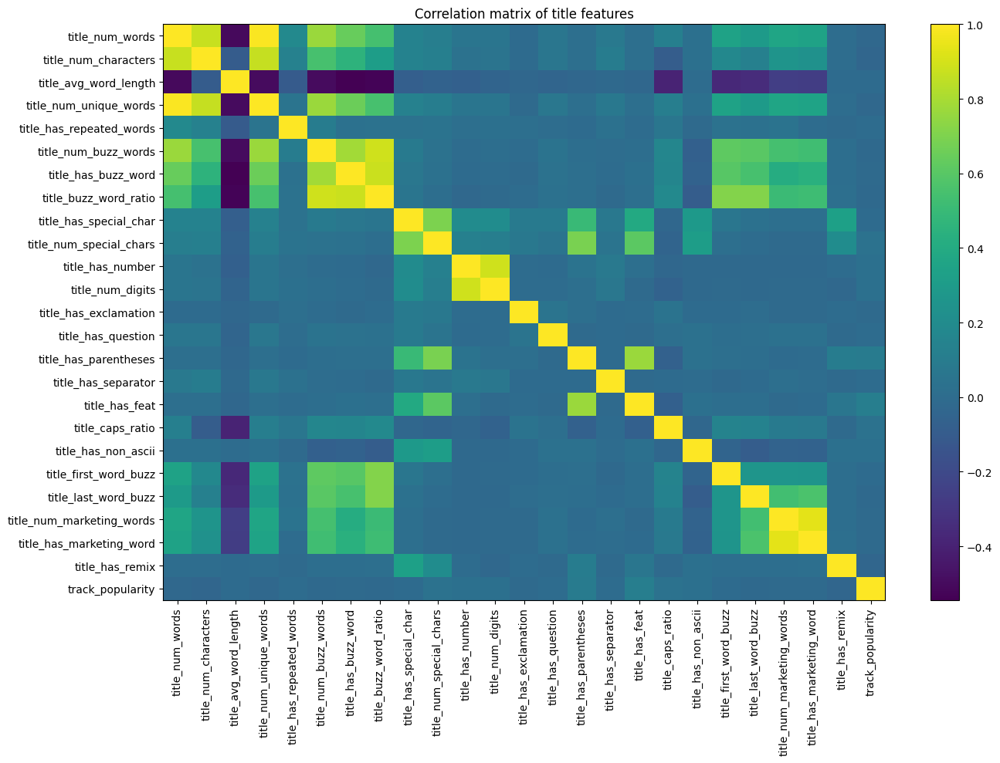

In [ ]:
corr_matrix = df_title[title_feature_cols + ["track_popularity"]].corr(numeric_only=True)

print(corr_matrix.round(2))

plt.figure(figsize=(14, 10))
plt.imshow(corr_matrix, aspect="auto")
plt.colorbar()
plt.xticks(range(len(corr_matrix.columns)), corr_matrix.columns, rotation=90)
plt.yticks(range(len(corr_matrix.index)), corr_matrix.index)
plt.title("Correlation matrix of title features")
plt.tight_layout()
plt.show()

In [ ]:
# list of the most correlated features to popularity (absolute value)
most_corr = corr_matrix["track_popularity"].abs().sort_values(ascending=False)
print("Features most correlated with popularity:")  
print(most_corr)

Features most correlated with popularity:
track_popularity             1.000000
title_has_feat               0.116751
title_has_parentheses        0.100519
title_caps_ratio             0.036966
title_num_special_chars      0.035621
title_has_remix              0.033531
title_num_characters         0.032785
title_num_digits             0.026788
title_has_number             0.024893
title_num_unique_words       0.024211
title_has_non_ascii          0.024158
title_num_words              0.023201
title_num_buzz_words         0.018158
title_last_word_buzz         0.017277
title_buzz_word_ratio        0.016165
title_has_buzz_word          0.012847
title_num_marketing_words    0.010515
title_has_marketing_word     0.009998
title_has_exclamation        0.008539
title_first_word_buzz        0.005800
title_avg_word_length        0.005349
title_has_special_char       0.004894
title_has_repeated_words     0.004371
title_has_question           0.003278
title_has_separator          0.001409
Name: tr

On observe une corrélation remarquable entre la popularité la présence d'un feat et de paranthèses dans le titre. Nous allons poursuivre cette analyse en étudiant le 10% des chansons les plus populaires.

#### Boxplots : 10% most popular songs


Popularity threshold for Top 10%: 1.2616624743265237
top10_group
Rest       29508
Top 10%     3320
Name: count, dtype: int64


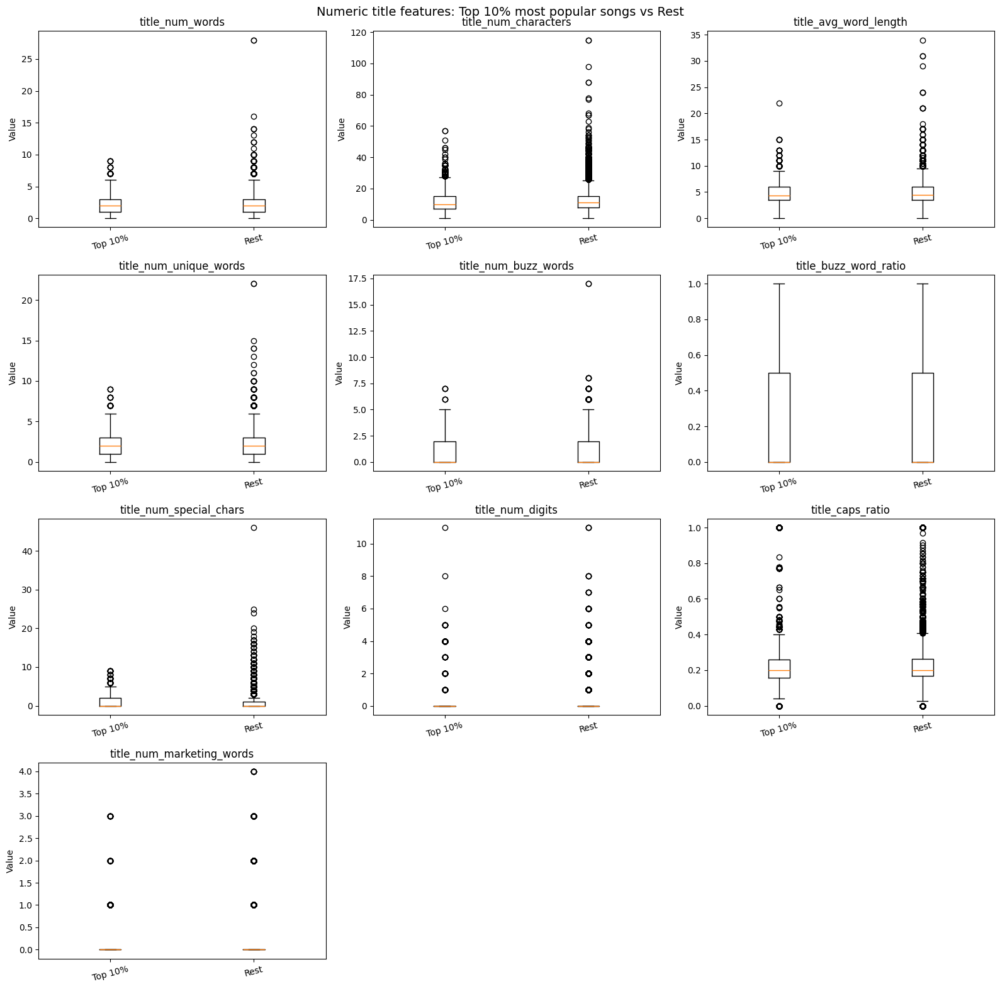

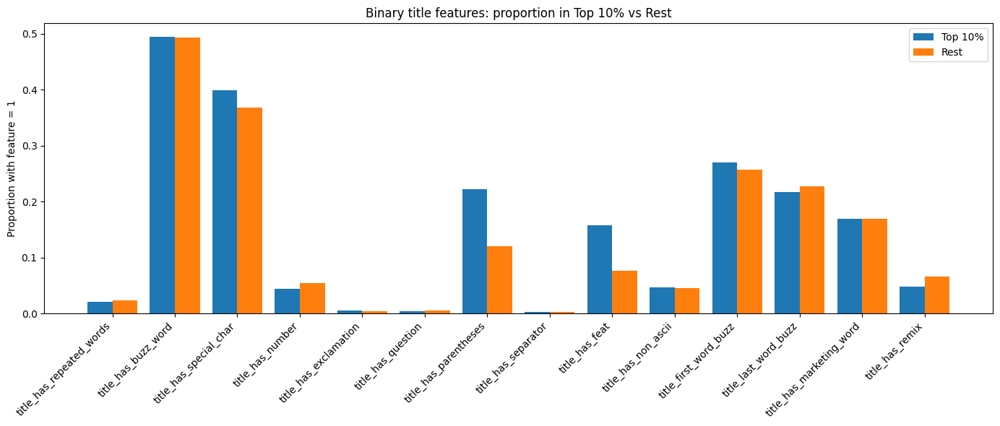


Average numeric feature values by group:
top10_group                     Rest    Top 10%
title_num_words             2.412939   2.336145
title_num_characters       12.046394  11.524699
title_avg_word_length       4.933749   4.891689
title_num_unique_words      2.385556   2.310241
title_num_buzz_words        0.922970   0.932530
title_buzz_word_ratio       0.283801   0.287980
title_num_special_chars     0.797377   1.017169
title_num_digits            0.155822   0.134639
title_caps_ratio            0.231403   0.247053
title_num_marketing_words   0.188796   0.193373

Binary feature proportions by group:
                           Top 10%      Rest
feature                                     
title_has_repeated_words  0.021687  0.023214
title_has_buzz_word       0.493976  0.492748
title_has_special_char    0.398795  0.368646
title_has_number          0.043976  0.054358
title_has_exclamation     0.006325  0.004507
title_has_question        0.004819  0.005117
title_has_parentheses     0.2228

In [ ]:


# --------------------------------------------------
# 1. Create target group: Top 10% vs Rest
# --------------------------------------------------
df_analysis = df_title.copy()

pop_threshold = df_analysis["track_popularity"].quantile(0.90)

df_analysis["top10_group"] = np.where(
    df_analysis["track_popularity"] >= pop_threshold,
    "Top 10%",
    "Rest"
)

print("Popularity threshold for Top 10%:", pop_threshold)
print(df_analysis["top10_group"].value_counts())

# --------------------------------------------------
# 2. Define numeric and binary title features
# --------------------------------------------------
numeric_title_features = [
    "title_num_words",
    "title_num_characters",
    "title_avg_word_length",
    "title_num_unique_words",
    "title_num_buzz_words",
    "title_buzz_word_ratio",
    "title_num_special_chars",
    "title_num_digits",
    "title_caps_ratio",
    "title_num_marketing_words"
]

binary_title_features = [
    "title_has_repeated_words",
    "title_has_buzz_word",
    "title_has_special_char",
    "title_has_number",
    "title_has_exclamation",
    "title_has_question",
    "title_has_parentheses",
    "title_has_separator",
    "title_has_feat",
    "title_has_non_ascii",
    "title_first_word_buzz",
    "title_last_word_buzz",
    "title_has_marketing_word",
    "title_has_remix"
]

# keep only columns that actually exist
numeric_title_features = [col for col in numeric_title_features if col in df_analysis.columns]
binary_title_features = [col for col in binary_title_features if col in df_analysis.columns]

# --------------------------------------------------
# 3. Boxplots for numeric features
# --------------------------------------------------
n_num = len(numeric_title_features)
ncols = 3
nrows = int(np.ceil(n_num / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 4 * nrows))
axes = np.array(axes).reshape(-1)

for i, feature in enumerate(numeric_title_features):
    top_vals = df_analysis[df_analysis["top10_group"] == "Top 10%"][feature].dropna()
    rest_vals = df_analysis[df_analysis["top10_group"] == "Rest"][feature].dropna()

    axes[i].boxplot([top_vals, rest_vals], tick_labels=["Top 10%", "Rest"])
    axes[i].set_title(feature)
    axes[i].set_ylabel("Value")
    axes[i].tick_params(axis="x", rotation=15)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Numeric title features: Top 10% most popular songs vs Rest", fontsize=14)
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 4. Barplots for binary features
#    Plot proportion of songs with feature = 1 in each group
# --------------------------------------------------
binary_summary = []

for feature in binary_title_features:
    top_rate = df_analysis[df_analysis["top10_group"] == "Top 10%"][feature].mean()
    rest_rate = df_analysis[df_analysis["top10_group"] == "Rest"][feature].mean()

    binary_summary.append({
        "feature": feature,
        "Top 10%": top_rate,
        "Rest": rest_rate
    })

binary_summary_df = pd.DataFrame(binary_summary)

# side-by-side barplots
x = np.arange(len(binary_summary_df))
width = 0.4

plt.figure(figsize=(14, 6))
plt.bar(x - width/2, binary_summary_df["Top 10%"], width=width, label="Top 10%")
plt.bar(x + width/2, binary_summary_df["Rest"], width=width, label="Rest")

plt.xticks(x, binary_summary_df["feature"], rotation=45, ha="right")
plt.ylabel("Proportion with feature = 1")
plt.title("Binary title features: proportion in Top 10% vs Rest")
plt.legend()
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 5. Optional summary table
# --------------------------------------------------
numeric_summary = df_analysis.groupby("top10_group")[numeric_title_features].mean().T
print("\nAverage numeric feature values by group:")
print(numeric_summary)

print("\nBinary feature proportions by group:")
print(binary_summary_df.set_index("feature"))

In [ ]:
binary_summary_df["difference_top_minus_rest"] = binary_summary_df["Top 10%"] - binary_summary_df["Rest"]
print(binary_summary_df.sort_values("difference_top_minus_rest", ascending=False))
numeric_diff = (
    df_analysis.groupby("top10_group")[numeric_title_features].mean().T
)
numeric_diff["difference_top_minus_rest"] = numeric_diff["Top 10%"] - numeric_diff["Rest"]
print(numeric_diff.sort_values("difference_top_minus_rest", ascending=False))

                     feature   Top 10%      Rest  difference_top_minus_rest
6      title_has_parentheses  0.222892  0.119934                   0.102958
8             title_has_feat  0.157831  0.076589                   0.081242
2     title_has_special_char  0.398795  0.368646                   0.030149
10     title_first_word_buzz  0.270783  0.256676                   0.014107
4      title_has_exclamation  0.006325  0.004507                   0.001818
1        title_has_buzz_word  0.493976  0.492748                   0.001228
9        title_has_non_ascii  0.046386  0.045649                   0.000737
12  title_has_marketing_word  0.169277  0.168937                   0.000340
5         title_has_question  0.004819  0.005117                  -0.000298
7        title_has_separator  0.002711  0.003253                  -0.000543
0   title_has_repeated_words  0.021687  0.023214                  -0.001527
11      title_last_word_buzz  0.217771  0.226955                  -0.009184
3           

Comme vu précedemment avec les corrélations, nous observons une différence majeure entre le 10% des chansons les plus populaires et le reste des chansons en ce qui concerne :
* la présence de paranthèses (10%)
* la présence d'une collaboration "feat" (8%)
* la présence de charactères spéciaux (22%)

Les paranthèses sont souvent utilisées pour préciser qu'il s'agit d'une collaboration, en explicitant l'autre artiste comme dans l'exemple de "I Don't Care (with Justin Bieber)". Nous en déduisons donc que les chansons en collaboration sont plus susceptibles d'être populaires. Allons maintenant analyser la présence de charactères spéciaux.

  special_char  frequency
0            (       4291
1            )       4289
2            .       3779
3            '       2519
4            &        943
5            ,        661
6            -        292
7            é        243
8            á        187
9            а        182


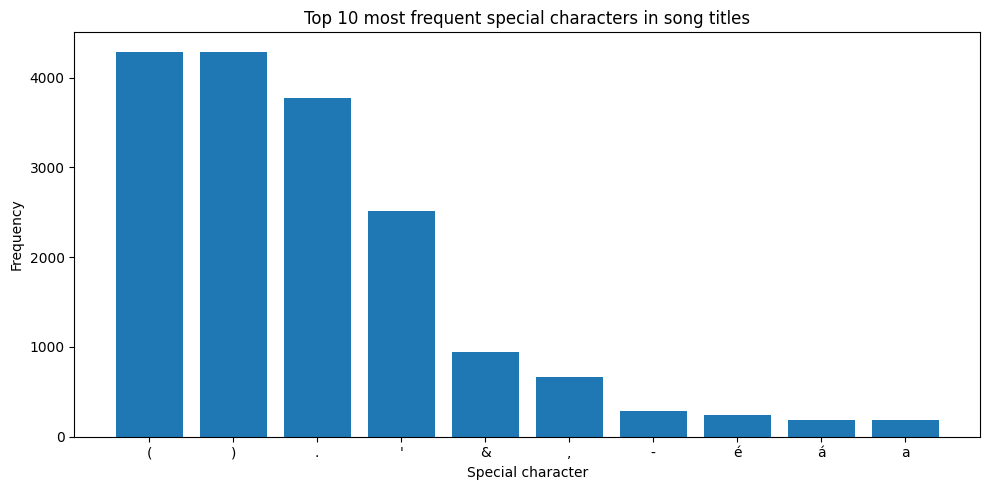

In [ ]:
## SPECIAL CHARACTERS ANALYSIS

import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
from collections import Counter

# --------------------------------------------------
# 1. Work on title before " - "
# --------------------------------------------------
df_special = data.copy()
df_special["track_name"] = df_special["track_name"].fillna("").astype(str)

df_special["title_main"] = df_special["track_name"].apply(
    lambda x: re.split(r"\s-\s", x, maxsplit=1)[0].strip()
)

# --------------------------------------------------
# 2. Extract only special characters
#    Here: anything that is NOT letter, digit, or space
# --------------------------------------------------
def extract_special_characters(text):
    return re.findall(r"[^A-Za-z0-9\s]", text)

df_special["special_chars"] = df_special["title_main"].apply(extract_special_characters)

# flatten all characters into one list
all_special_chars = [char for chars in df_special["special_chars"] for char in chars]

# count frequencies
special_char_counts = Counter(all_special_chars)

# top 10
top_10_special_chars = special_char_counts.most_common(10)

# convert to dataframe
top_10_special_df = pd.DataFrame(top_10_special_chars, columns=["special_char", "frequency"])

print(top_10_special_df)

# --------------------------------------------------
# 3. Plot histogram / bar chart
# --------------------------------------------------
plt.figure(figsize=(10, 5))
plt.bar(top_10_special_df["special_char"], top_10_special_df["frequency"])
plt.xlabel("Special character")
plt.ylabel("Frequency")
plt.title("Top 10 most frequent special characters in song titles")
plt.tight_layout()
plt.show()

Nous observons que les caractères spéciaux les plus fréquents sont les paranthèses, cela explique pourquoi est-ce que la présence de caractères spéciaux influence la popularité d'une chanson. Il s'agit en fait d'un indicateur des collaborations également.

In [ ]:
import re

df_analysis["has_special_char_excl_parentheses"] = df_analysis["title_main"].apply(
    lambda x: int(bool(re.search(r"[^A-Za-z0-9\s\(\)]", x)))
)

top_rate = df_analysis.loc[df_analysis["top10_group"] == "Top 10%", "has_special_char_excl_parentheses"].mean()
rest_rate = df_analysis.loc[df_analysis["top10_group"] == "Rest", "has_special_char_excl_parentheses"].mean()

print(f"Top 10%: {top_rate:.2%} of songs have a special character other than parentheses.")
print(f"Rest: {rest_rate:.2%} of songs have a special character other than parentheses.")

Top 10%: 14.07% of songs have a special character other than parentheses.
Rest: 14.90% of songs have a special character other than parentheses.


The difference between popular and average songs in terms of the presence of special characters becomes negligeable. There is no influence of the presence of speaicl characters if we do not include the paranthesis.

In [ ]:
# STATISTICAL TEST : Numeric Features

from scipy.stats import ttest_ind, mannwhitneyu

numeric_title_features = [
    "title_num_words",
    "title_num_characters",
    "title_avg_word_length",
    "title_num_unique_words",
    "title_num_buzz_words",
    "title_buzz_word_ratio",
    "title_num_special_chars",
    "title_num_digits",
    "title_caps_ratio",
    "title_num_marketing_words"
]

results_numeric = []

for feature in numeric_title_features:
    top_vals = df_analysis.loc[df_analysis["top10_group"] == "Top 10%", feature].dropna()
    rest_vals = df_analysis.loc[df_analysis["top10_group"] == "Rest", feature].dropna()
    
    # t-test
    t_stat, t_pval = ttest_ind(top_vals, rest_vals, equal_var=False)
    
    # Mann-Whitney
    u_stat, u_pval = mannwhitneyu(top_vals, rest_vals, alternative="two-sided")
    
    results_numeric.append({
        "feature": feature,
        "mean_top10": top_vals.mean(),
        "mean_rest": rest_vals.mean(),
        "difference": top_vals.mean() - rest_vals.mean(),
        "ttest_pvalue": t_pval,
        "mannwhitney_pvalue": u_pval
    })

results_numeric_df = pd.DataFrame(results_numeric).sort_values("mannwhitney_pvalue")
print(results_numeric_df)

                     feature  mean_top10  mean_rest  difference  ttest_pvalue  \
6    title_num_special_chars    1.017169   0.797377    0.219792  4.149636e-14   
1       title_num_characters   11.524699  12.046394   -0.521695  2.632667e-06   
3     title_num_unique_words    2.310241   2.385556   -0.075315  2.002781e-03   
0            title_num_words    2.336145   2.412939   -0.076794  1.863599e-03   
7           title_num_digits    0.134639   0.155822   -0.021184  1.039032e-01   
8           title_caps_ratio    0.247053   0.231403    0.015650  4.063432e-06   
2      title_avg_word_length    4.891689   4.933749   -0.042060  2.406461e-01   
5      title_buzz_word_ratio    0.287980   0.283801    0.004178  4.880278e-01   
4       title_num_buzz_words    0.932530   0.922970    0.009560  6.628391e-01   
9  title_num_marketing_words    0.193373   0.188796    0.004577  5.902814e-01   

   mannwhitney_pvalue  
6        2.016404e-10  
1        1.432256e-09  
3        6.794100e-05  
0        8.7

In [ ]:
# STATISTICAL TEST : Binary Features
from scipy.stats import chi2_contingency, fisher_exact

binary_title_features = [
    "title_has_repeated_words",
    "title_has_buzz_word",
    "title_has_special_char",
    "title_has_number",
    "title_has_exclamation",
    "title_has_question",
    "title_has_parentheses",
    "title_has_separator",
    "title_has_feat",
    "title_has_non_ascii",
    "title_first_word_buzz",
    "title_last_word_buzz",
    "title_has_marketing_word",
    "has_special_char_excl_parentheses"
]

results_binary = []

for feature in binary_title_features:
    contingency = pd.crosstab(df_analysis[feature], df_analysis["top10_group"])
    
    if contingency.shape == (2, 2):
        chi2, chi2_pval, _, _ = chi2_contingency(contingency)
        oddsratio, fisher_pval = fisher_exact(contingency)
        
        results_binary.append({
            "feature": feature,
            "top10_rate": df_analysis.loc[df_analysis["top10_group"] == "Top 10%", feature].mean(),
            "rest_rate": df_analysis.loc[df_analysis["top10_group"] == "Rest", feature].mean(),
            "difference": (
                df_analysis.loc[df_analysis["top10_group"] == "Top 10%", feature].mean()
                - df_analysis.loc[df_analysis["top10_group"] == "Rest", feature].mean()
            ),
            "chi2_pvalue": chi2_pval,
            "fisher_pvalue": fisher_pval
        })

results_binary_df = pd.DataFrame(results_binary).sort_values("fisher_pvalue")
print(results_binary_df)

                              feature  top10_rate  rest_rate  difference  \
6               title_has_parentheses    0.222892   0.119934    0.102958   
8                      title_has_feat    0.157831   0.076589    0.081242   
2              title_has_special_char    0.398795   0.368646    0.030149   
3                    title_has_number    0.043976   0.054358   -0.010382   
10              title_first_word_buzz    0.270783   0.256676    0.014107   
4               title_has_exclamation    0.006325   0.004507    0.001818   
13  has_special_char_excl_parentheses    0.140663   0.148977   -0.008314   
11               title_last_word_buzz    0.217771   0.226955   -0.009184   
0            title_has_repeated_words    0.021687   0.023214   -0.001527   
7                 title_has_separator    0.002711   0.003253   -0.000543   
9                 title_has_non_ascii    0.046386   0.045649    0.000737   
1                 title_has_buzz_word    0.493976   0.492748    0.001228   
12          

Les résultats obtenus précedemment se confirment via les tests statistiques qui nous indiquent la significativité de nos variables présentant des faibles p-valeurs.

##### Titles through the years

Available decades:
['1950s', '1960s', '1970s', '1980s', '1990s', '2000s', '2010s', '2020s']


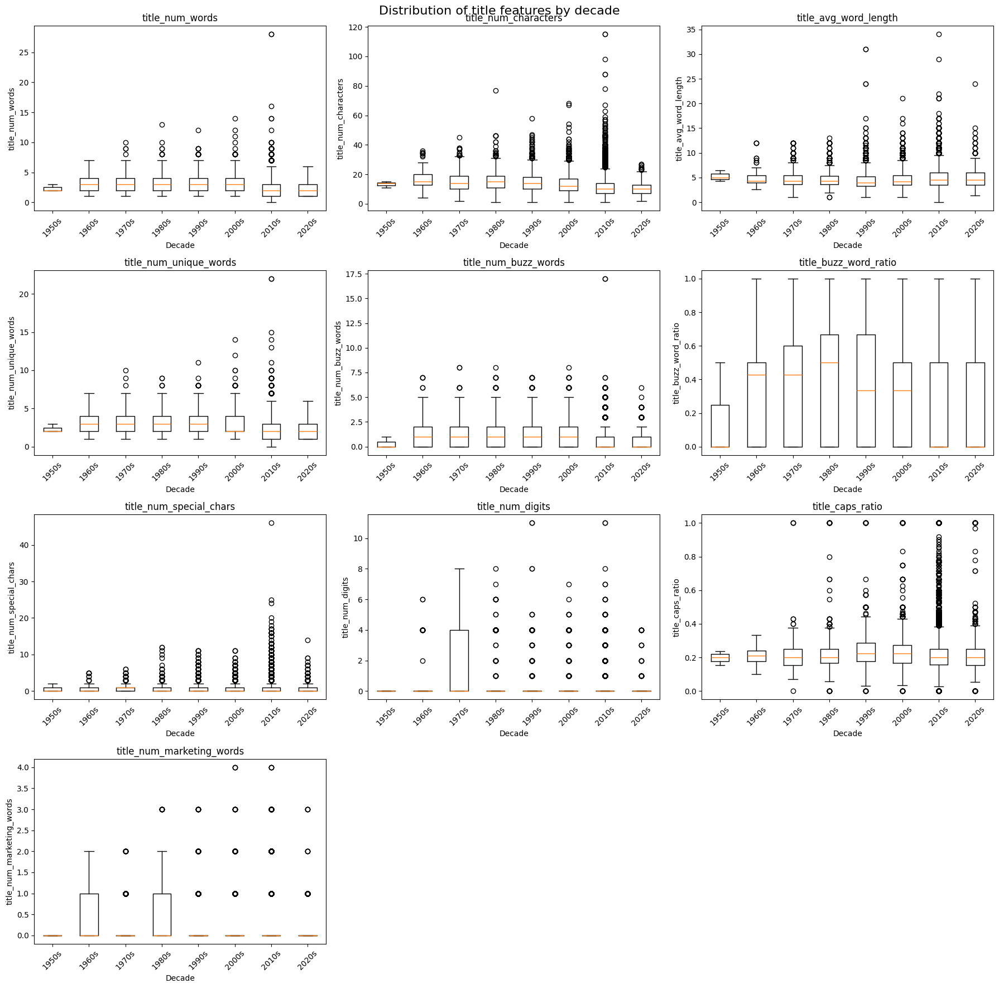

KeyError: 'Column not found: has_special_char_excl_parentheses'

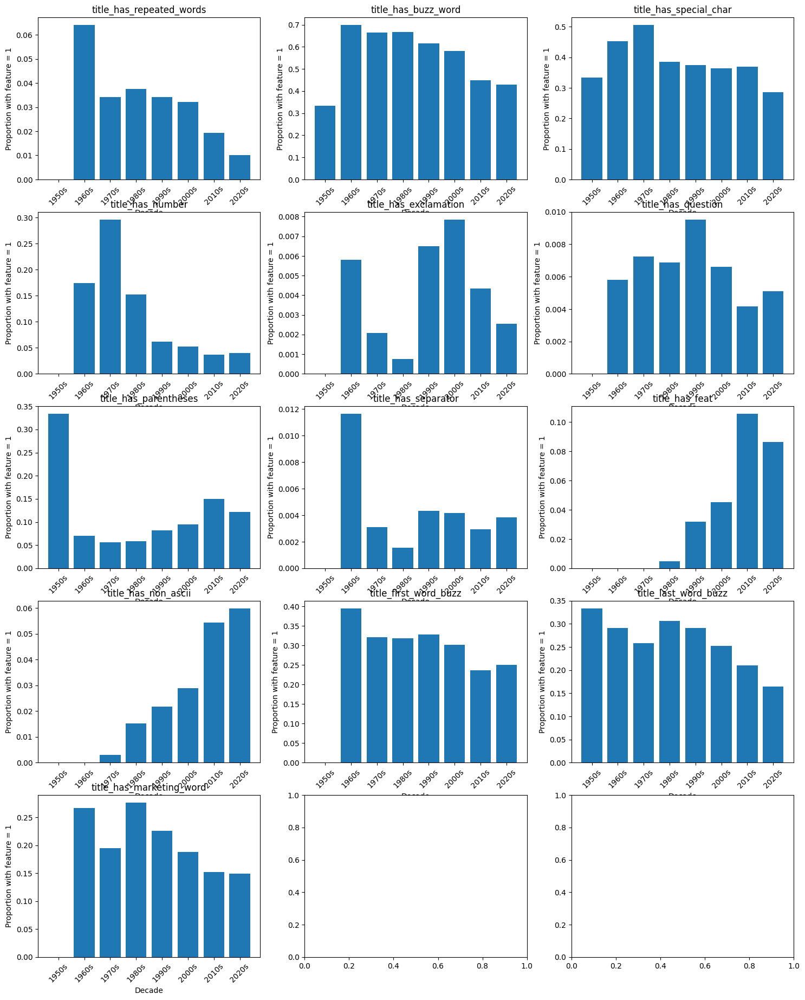

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --------------------------------------------------
# 1. Work on a copy
# --------------------------------------------------
df_decades = df_title.copy()

# --------------------------------------------------
# 2. Choose the year column
#    Replace "year" if your column has another name
#    examples: "release_year", "album_release_year", etc.
# --------------------------------------------------
year_col = "year"

# keep only valid years
df_decades = df_decades[df_decades[year_col].notna()].copy()
df_decades[year_col] = pd.to_numeric(df_decades[year_col], errors="coerce")
df_decades = df_decades[df_decades[year_col].notna()].copy()
df_decades[year_col] = df_decades[year_col].astype(int)

# --------------------------------------------------
# 3. Create decade column
#    Example: 1994 -> 1990s
# --------------------------------------------------
df_decades["decade"] = (df_decades[year_col] // 10) * 10
df_decades["decade_label"] = df_decades["decade"].astype(str) + "s"

# optional: sort labels chronologically
decade_order = sorted(df_decades["decade"].unique())
decade_labels = [str(d) + "s" for d in decade_order]

print("Available decades:")
print(decade_labels)

# --------------------------------------------------
# 4. Select the most relevant title features
#    You can adapt this list
# --------------------------------------------------
relevant_features = numeric_title_features + binary_title_features

relevant_features = [col for col in relevant_features if col in df_decades.columns]

# --------------------------------------------------
# 5. Boxplots by decade :  Numeric features: distribution by decade
# --------------------------------------------------
n_features = len(numeric_title_features)
ncols = 3
nrows = int(np.ceil(n_features / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4.5 * nrows))
axes = np.array(axes).reshape(-1)

for i, feature in enumerate(numeric_title_features):
    grouped_data = [
        df_decades.loc[df_decades["decade"] == d, feature].dropna()
        for d in decade_order
    ]
    
    axes[i].boxplot(grouped_data, tick_labels=decade_labels)
    axes[i].set_title(feature)
    axes[i].set_xlabel("Decade")
    axes[i].set_ylabel(feature)
    axes[i].tick_params(axis="x", rotation=45)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Distribution of title features by decade", fontsize=16)
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 5. Barplots by decade : Binary features: proportion of songs with feature 
n_features_bin = len(binary_title_features)
ncols_bin = 3
nrows_bin = int(np.ceil(n_features_bin / ncols_bin))
fig, axes = plt.subplots(nrows=nrows_bin, ncols=ncols_bin, figsize=(18, 4.5 * nrows_bin))
axes = np.array(axes).reshape(-1)
for i, feature in enumerate(binary_title_features):
    proportions = df_decades.groupby("decade")[feature].mean().reindex(decade_order)
    
    axes[i].bar(decade_labels, proportions)
    axes[i].set_title(feature)
    axes[i].set_xlabel("Decade")
    axes[i].set_ylabel("Proportion with feature = 1")
    axes[i].tick_params(axis="x", rotation=45)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
plt.suptitle("Proportion of songs with binary title features by decade", fontsize=16)
plt.tight_layout()

# --------------------------------------------------
# 6. Summary table: mean by decade
# --------------------------------------------------
summary_by_decade = (
    df_decades.groupby("decade_label")[relevant_features]
    .mean()
    .reindex(decade_labels)
)

print("\nMean values of title features by decade:")
print(summary_by_decade.round(2))

Nous observons une diminution dans les titres à travers les décennies :
* des mots répétés
* des buzz words
* des mots de marketing
* des chiffres

Nous observons une augmentation dans les titres à travers les décennies :
* des remix
* des charactères non ascii
* des collaborations "feat"

##### Titles through the genres

Genres kept:
['edm', 'rap', 'pop', 'r&b', 'latin', 'rock']


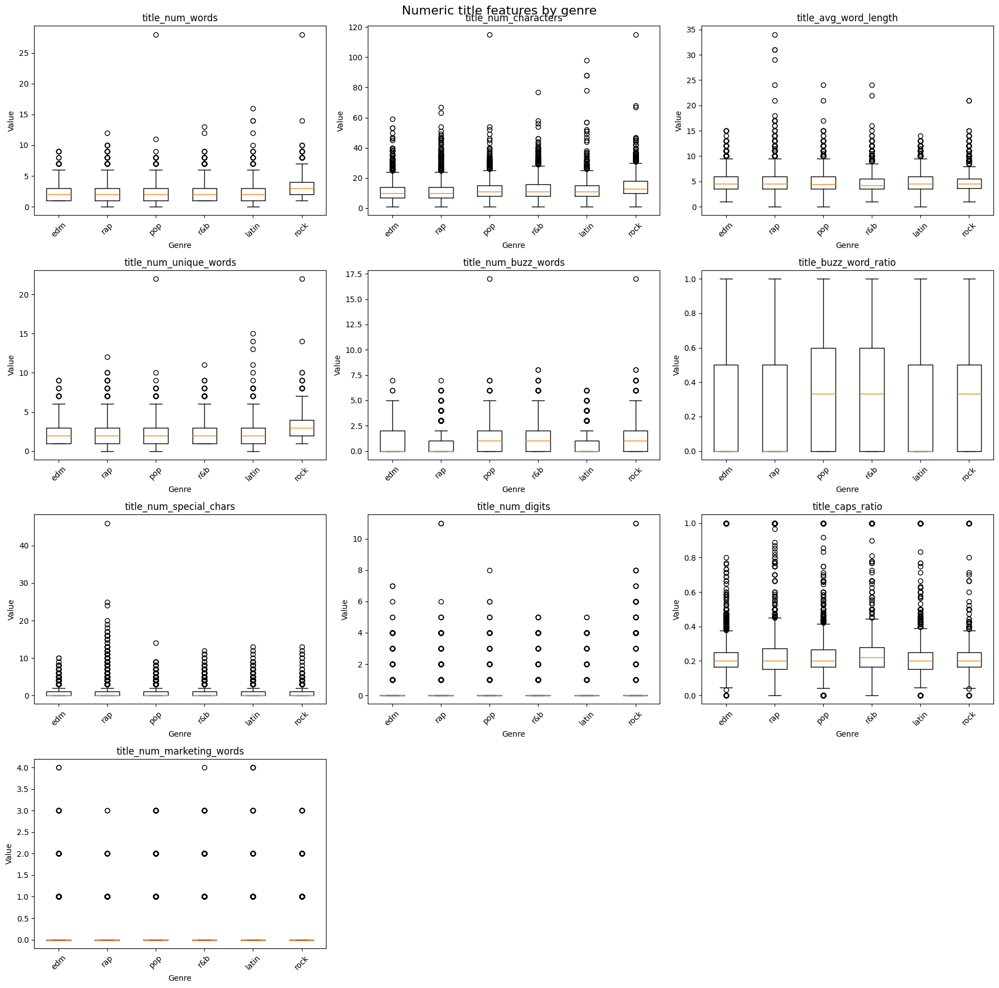

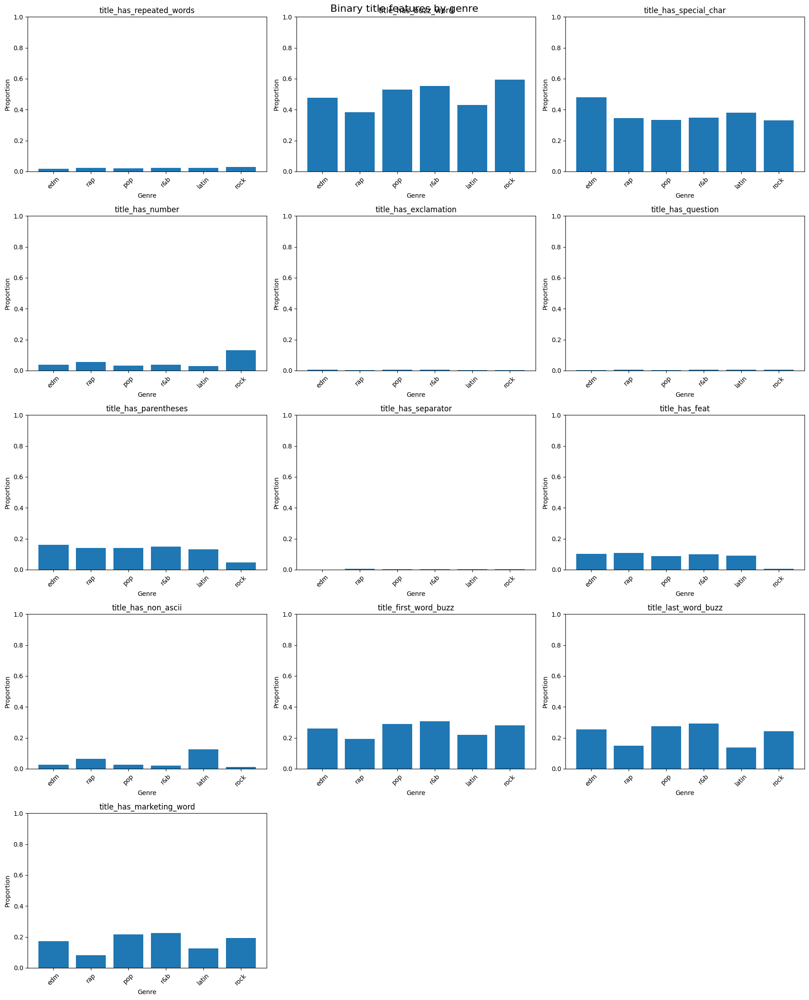


Mean numeric title features by genre:
                title_num_words  title_num_characters  title_avg_word_length  \
playlist_genre                                                                 
edm                        2.17                 10.81                   5.02   
rap                        2.27                 11.43                   4.99   
pop                        2.39                 11.85                   4.91   
r&b                        2.54                 12.39                   4.75   
latin                      2.32                 11.60                   4.98   
rock                       2.80                 14.21                   4.90   

                title_num_unique_words  title_num_buzz_words  \
playlist_genre                                                 
edm                               2.14                  0.89   
rap                               2.25                  0.66   
pop                               2.36                  1.04   


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --------------------------------------------------
# 1. Copy data
# --------------------------------------------------
df_genre = df_title.copy()

# Change this if your genre column has another name
genre_col = "playlist_genre"

# Keep only rows with a genre
df_genre = df_genre[df_genre[genre_col].notna()].copy()

# Optional: keep only top 10 most frequent genres for cleaner plots
top_n_genres = 10
top_genres = df_genre[genre_col].value_counts().head(top_n_genres).index
df_genre = df_genre[df_genre[genre_col].isin(top_genres)].copy()

# Order genres by frequency
genre_order = df_genre[genre_col].value_counts().index.tolist()

print("Genres kept:")
print(genre_order)

# --------------------------------------------------
# 2. Define numeric and binary title features
# --------------------------------------------------
numeric_title_features = [
    "title_num_words",
    "title_num_characters",
    "title_avg_word_length",
    "title_num_unique_words",
    "title_num_buzz_words",
    "title_buzz_word_ratio",
    "title_num_special_chars",
    "title_num_digits",
    "title_caps_ratio",
    "title_num_marketing_words"
]

binary_title_features = [
    "title_has_repeated_words",
    "title_has_buzz_word",
    "title_has_special_char",
    "title_has_number",
    "title_has_exclamation",
    "title_has_question",
    "title_has_parentheses",
    "title_has_separator",
    "title_has_feat",
    "title_has_non_ascii",
    "title_first_word_buzz",
    "title_last_word_buzz",
    "title_has_marketing_word",
    "has_special_char_excl_parentheses"
]

numeric_title_features = [col for col in numeric_title_features if col in df_genre.columns]
binary_title_features = [col for col in binary_title_features if col in df_genre.columns]

# --------------------------------------------------
# 3. Boxplots for numeric features by genre
# --------------------------------------------------
n_num = len(numeric_title_features)
ncols = 3
nrows = int(np.ceil(n_num / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4.5 * nrows))
axes = np.array(axes).reshape(-1)

for i, feature in enumerate(numeric_title_features):
    grouped_data = [
        df_genre.loc[df_genre[genre_col] == genre, feature].dropna()
        for genre in genre_order
    ]
    
    axes[i].boxplot(grouped_data, tick_labels=genre_order)
    axes[i].set_title(feature)
    axes[i].set_xlabel("Genre")
    axes[i].set_ylabel("Value")
    axes[i].tick_params(axis="x", rotation=45)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Numeric title features by genre", fontsize=16)
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 4. Barplots for binary features by genre
#    = proportion of songs with feature = 1
# --------------------------------------------------
n_bin = len(binary_title_features)
ncols = 3
nrows = int(np.ceil(n_bin / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4.5 * nrows))
axes = np.array(axes).reshape(-1)

for i, feature in enumerate(binary_title_features):
    proportions = (
        df_genre.groupby(genre_col)[feature]
        .mean()
        .reindex(genre_order)
    )
    
    axes[i].bar(proportions.index, proportions.values)
    axes[i].set_title(feature)
    axes[i].set_xlabel("Genre")
    axes[i].set_ylabel("Proportion")
    axes[i].tick_params(axis="x", rotation=45)
    axes[i].set_ylim(0, 1)

    """# adapted y-scale
    max_val = proportions.max()
    upper = min(1.0, max_val * 1.15 + 0.02)   # small margin above bars
    axes[i].set_ylim(0, upper)"""


for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Binary title features by genre", fontsize=16)
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 5. Optional summary tables
# --------------------------------------------------
numeric_summary = (
    df_genre.groupby(genre_col)[numeric_title_features]
    .mean()
    .reindex(genre_order)
)

binary_summary = (
    df_genre.groupby(genre_col)[binary_title_features]
    .mean()
    .reindex(genre_order)
)

print("\nMean numeric title features by genre:")
print(numeric_summary.round(2))

print("\nProportion of binary title features by genre:")
print(binary_summary.round(2))

##### PCA

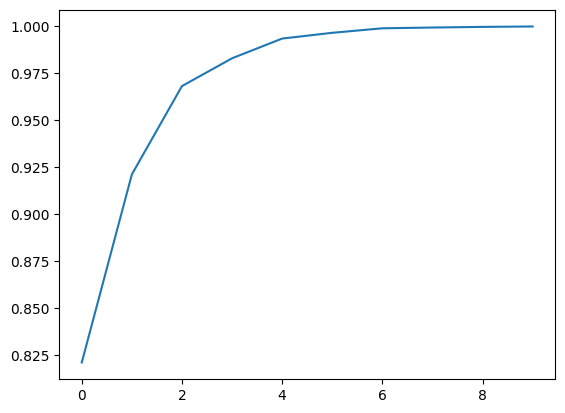

In [ ]:
pca = PCA()
## Estimation, calcul des composantes principales
C = pca.fit(df_title[numeric_title_features].fillna(0)).transform(df_title[numeric_title_features].fillna(0))
## Décroissance de la variance expliquée
plt.plot(pca.explained_variance_ratio_.cumsum())
plt.show()

In [ ]:
plt.figure(figsize=(5,5))
for i, j, nom in zip(C[:,0], C[:,1], df_title["playlist_genre"]):
    color = "red" if nom  else "blue"
    plt.plot(i, j, "o",color=color)
plt.axis((-6,4,-6,4))  
plt.show()

NameError: name 'plt' is not defined

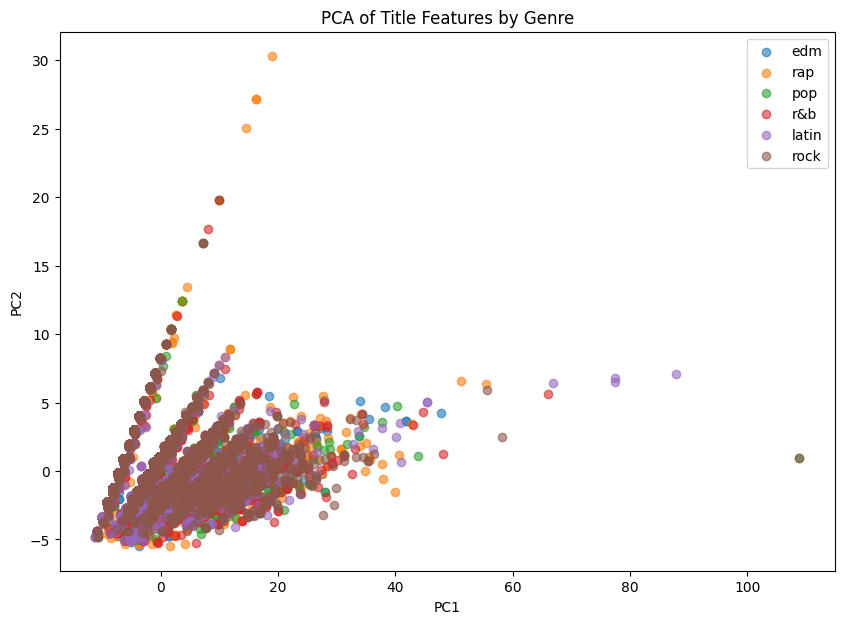

In [ ]:
pca = PCA(n_components=3)
features_pca = pca.fit_transform(df_title[numeric_title_features].fillna(0))
df_title["pca_1"] = features_pca[:, 0]
df_title["pca_2"] = features_pca[:, 1]
df_title["pca_3"] = features_pca[:, 2]
plt.figure(figsize=(10, 7))
for genre in genre_order:
    subset = df_title[df_title[genre_col] == genre]
    plt.scatter(subset["pca_1"], subset["pca_2"], label=genre, alpha=0.6)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA of Title Features by Genre")
plt.legend()
plt.show()  

In [ ]:
# On crée la figure
plt.figure(figsize=(8, 8))

# Liste des couples de dimensions à tester (index des colonnes de C)
couples = [(0, 1), (0, 2), (1, 2),(1,3),(3,4),(2,3)]

# Configuration : 3 lignes, 2 colonnes
n_rows, n_cols = 3, 2
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 15))

# On "aplatit" la matrice axes pour pouvoir boucler dessus avec un seul index (i)
axes_flat = axes.flatten()

for i, (dim_x, dim_y) in enumerate(couples):
    sns.scatterplot(
        x=C[:, dim_x], y=C[:, dim_y], 
        hue=df_clean["playlist_genre"], 
        ax=axes_flat[i], palette="husl", alpha=1, s=2,
        legend=(i == 0) # On garde la légende sur un seul graphique pour plus de clarté
    )
    
    axes_flat[i].set(title=f"Dimensions {dim_x+1} & {dim_y+1}", 
                     xlabel=f"C{dim_x+1}", ylabel=f"C{dim_y+1}",
                     xlim=(-1, 1), ylim=(-1, 1))
    axes_flat[i].axis((-4, 4, -4, 4)) # Ajuste selon tes données
    
    axes_flat[i].axhline(0, color='grey', lw=1, ls='--')
    axes_flat[i].axvline(0, color='grey', lw=1, ls='--')

plt.tight_layout()
plt.show()